In [1]:
import json
import pickle
import re
import numpy as np
import pandas as pd
from Datasets import *
from tqdm.notebook import tqdm
import torch
from torch.nn import DataParallel
from torch.utils.data import DataLoader, RandomSampler
from sklearn.metrics import roc_curve, jaccard_score, accuracy_score
from sklearn.metrics import average_precision_score, coverage_error, label_ranking_average_precision_score, label_ranking_loss, roc_auc_score
import seaborn as sns
from models import PreBuildConverter
from functools import partial
from CKA_torch import CkaLoss
import os
import matplotlib.pylab as plt
import matplotlib
from itertools import combinations
%matplotlib notebook
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
def pretty_size(size):
	"""Pretty prints a torch.Size object"""
	assert(isinstance(size, torch.Size))
	return " × ".join(map(str, size))

def dump_tensors(gpu_only=True):
	"""Prints a list of the Tensors being tracked by the garbage collector."""
	import gc
	total_size = 0
	for obj in gc.get_objects():
		try:
			if torch.is_tensor(obj):
				if not gpu_only or obj.is_cuda:
					print("%s:%s%s %s" % (type(obj).__name__, 
										  " GPU" if obj.is_cuda else "",
										  " pinned" if obj.is_pinned else "",
										  pretty_size(obj.size())))
					total_size += obj.numel()
			elif hasattr(obj, "data") and torch.is_tensor(obj.data):
				if not gpu_only or obj.is_cuda:
					print("%s → %s:%s%s%s%s %s" % (type(obj).__name__, 
												   type(obj.data).__name__, 
												   " GPU" if obj.is_cuda else "",
												   " pinned" if obj.data.is_pinned else "",
												   " grad" if obj.requires_grad else "", 
												   " volatile" if obj.volatile else "",
												   pretty_size(obj.data.size())))
					total_size += obj.data.numel()
		except Exception as e:
			pass        
	print("Total size:", total_size)

In [1049]:
dump_tensors()

Tensor: GPU pinned 64
Tensor: GPU pinned 64
Tensor: GPU pinned 
Tensor: GPU pinned 64
Tensor: GPU pinned 64
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 96
Tensor: GPU pinned 96
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 160
Tensor: GPU pinned 160
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 192
Tensor: GPU pinned 192
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 224
Tensor: GPU pinned 224
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 256
Tensor: GPU pinned 256
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinn

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/torch/distributed/distributed_c10d.py:102: UserWarning: torch.distributed.reduce_op is deprecated, please use torch.distributed.ReduceOp instead
  warnings.warn("torch.distributed.reduce_op is deprecated, please use "


Parameter: GPU pinned 7 × 1024
Parameter: GPU pinned 7
Parameter: GPU pinned 7 × 1024
Parameter: GPU pinned 7
Parameter: GPU pinned 64 × 3 × 7 × 7
Parameter: GPU pinned 64
Parameter: GPU pinned 64
Tensor: GPU pinned 64
Tensor: GPU pinned 64
Tensor: GPU pinned 
Parameter: GPU pinned 1024
Parameter: GPU pinned 1024
Tensor: GPU pinned 1024
Tensor: GPU pinned 1024
Tensor: GPU pinned 
Parameter: GPU pinned 64 × 3 × 7 × 7
Parameter: GPU pinned 64
Parameter: GPU pinned 64
Tensor: GPU pinned 64
Tensor: GPU pinned 64
Tensor: GPU pinned 
Parameter: GPU pinned 1024
Parameter: GPU pinned 1024
Tensor: GPU pinned 1024
Tensor: GPU pinned 1024
Tensor: GPU pinned 
Parameter: GPU pinned 256
Parameter: GPU pinned 256
Tensor: GPU pinned 256
Tensor: GPU pinned 256
Tensor: GPU pinned 
Parameter: GPU pinned 128 × 256 × 1 × 1
Parameter: GPU pinned 512
Parameter: GPU pinned 512
Tensor: GPU pinned 512
Tensor: GPU pinned 512
Tensor: GPU pinned 
Parameter: GPU pinned 256 × 512 × 1 × 1
Parameter: GPU pinned 1024
P

Tensor: GPU pinned 192
Tensor: GPU pinned 192
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 224
Tensor: GPU pinned 224
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 256
Tensor: GPU pinned 256
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 160
Tensor: GPU pinned 160
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 192
Tensor: GPU pinned 192
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 224
Tensor: GPU pinned 224
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GPU pinned 256
Tensor: GPU pinned 256
Tensor: GPU pinned 
Tensor: GPU pinned 128
Tensor: GPU pinned 128
Tensor: GPU pinned 
Tensor: GP

Parameter: GPU pinned 128 × 704 × 1 × 1
Parameter: GPU pinned 128
Parameter: GPU pinned 128
Parameter: GPU pinned 32 × 128 × 3 × 3
Parameter: GPU pinned 736
Parameter: GPU pinned 736
Parameter: GPU pinned 128 × 736 × 1 × 1
Parameter: GPU pinned 128
Parameter: GPU pinned 128
Parameter: GPU pinned 32 × 128 × 3 × 3
Parameter: GPU pinned 768
Parameter: GPU pinned 768
Parameter: GPU pinned 128 × 768 × 1 × 1
Parameter: GPU pinned 128
Parameter: GPU pinned 128
Parameter: GPU pinned 32 × 128 × 3 × 3
Parameter: GPU pinned 800
Parameter: GPU pinned 800
Parameter: GPU pinned 128 × 800 × 1 × 1
Parameter: GPU pinned 128
Parameter: GPU pinned 128
Parameter: GPU pinned 32 × 128 × 3 × 3
Parameter: GPU pinned 832
Parameter: GPU pinned 832
Parameter: GPU pinned 128 × 832 × 1 × 1
Parameter: GPU pinned 128
Parameter: GPU pinned 128
Parameter: GPU pinned 32 × 128 × 3 × 3
Parameter: GPU pinned 864
Parameter: GPU pinned 864
Parameter: GPU pinned 128 × 864 × 1 × 1
Parameter: GPU pinned 128
Parameter: GPU pinn

## loading dataset and models 

choose dataset here

In [2]:
model_dir = 'work_space/save/CheXpert'

In [5]:
# paren are probes
chexpert_paren = {'No_finding': 1,
                             'parenchymal': 1,
                             'extraparenchymal': 0,
                             'limit_out_labels': 0
                  }
                  
_, test, _, out_out = get_chexpert(**chexpert_paren)
dloader_args = {
        'batch_size': 10,
        'pin_memory': False,
        'num_workers': 20,
        'drop_last': True,
}
eval_sampler = RandomSampler(test, replacement=True, num_samples=len(test) // 20)
test = DataLoader(test, sampler=eval_sampler, **dloader_args)
# test = DataLoader(test, **dloader_args)
out_out_sampler = RandomSampler(out_out, replacement=True, num_samples=len(out_out) // 10)
out_out = DataLoader(out_out, sampler=out_out_sampler, **dloader_args)
# out_out = DataLoader(out_out, **dloader_args)

basic_model = "2020-06-08_14:47_cifar_n=2_densenet121_lr=0.0001_m=_a=0_55_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=0"
diverse_model = "2020-06-09_08:56_n=2_densenet121_lr=0.0001_m=_a=0.01_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=0"

basic_model = model_dir +'/'+basic_model
diverse_model = model_dir +'/'+diverse_model

In [3]:
# paren are probes
chexpert_paren = {
    'No_finding': 1,
    'parenchymal': 1,
    'extraparenchymal': 0,
    'limit_out_labels': 1,
    'with_path':True
}
                  
train, test, in_out, out_out = get_chexpert(**chexpert_paren)
dloader_args = {
        'batch_size': 100,
        'pin_memory': False,
        'num_workers': 0,
        'drop_last': False,
}

train_sampler = RandomSampler(train, replacement=True, num_samples=len(train))
train = DataLoader(train, sampler=train_sampler, **dloader_args)
#test = DataLoader(test, **dloader_args)

eval_sampler = RandomSampler(test, replacement=True, num_samples=len(test))
test = DataLoader(test, sampler=eval_sampler, **dloader_args)
#test = DataLoader(test, **dloader_args)

in_out_sampler = RandomSampler(in_out, replacement=True, num_samples=len(in_out)//10)
in_out = DataLoader(in_out, sampler=in_out_sampler, **dloader_args)
#in_out = DataLoader(in_out, **dloader_args)

out_out_sampler = RandomSampler(out_out, replacement=True, num_samples=len(out_out))
out_out = DataLoader(out_out, sampler=out_out_sampler, **dloader_args)
#out_out = DataLoader(out_out, **dloader_args)

# OSCRL
#diverse_model = "OSCRL/2020-06-08_21:41_cifar_n=2_densenet121_lr=0.0001_m=_a=0.1_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1"
#basic_model = "OSCRL/2020-06-08_14:48_cifar_n=2_densenet121_lr=0.0001_m=_a=0_55_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1"

# FDL
#basic_model = "FDL/2020-06-09_09:05_n=1_densenet121_lr=0.0001_m=__55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1"
#diverse_model = "FDL/2020-06-14_13:18_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10"
#diverse_model = "FDL/2020-06-21_14:40_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=1"

#diverse_model = model_dir +'/'+diverse_model
#basic_model = model_dir +'/'+basic_model

In [19]:
# extraparen are probes
chexpert_extraparen = {'No_finding': 1,
                             'parenchymal': 0,
                             'extraparenchymal': 1,
                             'limit_out_labels': 0
                  }
train, test, _, out_out = get_chexpert(**chexpert_extraparen)
dloader_args = {
        'batch_size': 20,
        'pin_memory': False,
        'num_workers': 20,
        'drop_last': False,
}
test = DataLoader(test, **dloader_args)
out_out = DataLoader(out_out, **dloader_args)

diverse_model = '2020-06-09_08:57_n=2_densenet121_lr=0.0001_m=_a=0.01_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-0-1_limited=0'
basic_model = '2020-06-09_08:57_n=2_densenet121_lr=0.0001_m=_a=0_55_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-0-1_limited=0'

In [ ]:
basic_model = [os.path.join(basic_model, model_path) for model_path in 
               os.listdir(basic_model) if 'model' in model_path]
diverse_model = [os.path.join(diverse_model, model_path) for model_path in 
                 os.listdir(diverse_model) if 'model' in model_path]

### calc emmbeddings

In [4]:
def load_fix(target_path):
    a = torch.load(target_path)#, map_location=lambda storage, loc: storage.cuda())
    fixed_a = {k.split('module.')[-1]: a[k] for k in a}
    torch.save(fixed_a, target_path)

def get_model(target_path):
    build_model = PreBuildConverter(in_channels=3, out_classes=len(test.dataset.label_names),
                                    add_func=True, softmax=False, pretrained=False)

    model = build_model.get_by_str('densenet121')
    load_fix(target_path)
    model.load_state_dict(torch.load(target_path))
    model.train(mode=False)
    return model

In [5]:
def make_scores(model_path, loader, train=False):
    model = DataParallel(get_model(model_path)).to('cuda') #get_model(model_path).to('cuda') #
    thetas = []
    labels = []
    paths = []
    for imgs, label, path in tqdm(loader, total=len(loader)):
        if train:
            thetas.append(model(imgs.cuda()).detach().cpu().numpy())
        else:
            bs, n_crops, c, h, w = imgs.size()
            imgs = imgs.view(-1, c, h, w).cuda()
            thetas.append(model(imgs).view(bs, n_crops, -1).mean(1).detach().cpu().numpy())
        labels.append(label.cpu().numpy())
        paths.append(path)
    del model
    torch.cuda.empty_cache()
    
    paths = np.concatenate(paths)
    labels = np.concatenate(labels)
    thetas = [np.concatenate(x) for x in thetas]
    
    return thetas, labels, paths #np.stack(thetas), np.stack(labels)

In [6]:
def make_scores_pair(model_paths, loader, train=False, layer='class'):
    models = [get_model(model).to('cuda') for model in model_paths] # #
    thetas = [[] for i in range(len(model_paths))]
    labels = []
    cka_emb_loss = CkaLoss(models, ['0.features.denseblock4'])
    cka_class_loss = CkaLoss(models, ['0.classifier'])
    cka_emb = [[] for i in range(len(model_paths))]
    cka_class_losses = []
    cka_emb_losses = []
    paths = []
    for imgs, label, path in tqdm(loader, total=len(loader)):
        if train:
            for i,model in enumerate(models):
                thetas[i].append(model(imgs.cuda()).detach().cpu().numpy())
                cka_emb[i].append(cka_emb_loss.model_activations[i]['0.features.denseblock4'].detach().cpu().numpy())
        else:
            bs, n_crops, c, h, w = imgs.size()
            imgs = imgs.view(-1, c, h, w).cuda()
            for i,model in enumerate(models):
                thetas[i].append(model(imgs).view(bs, n_crops, -1).mean(1).detach().cpu().numpy())
                #cka_emb[i].append(cka_emb_loss.model_activations[i]['0.features.denseblock4'].view(bs, n_crops, -1).mean(1).detach().cpu().numpy())
        labels.append(label.cpu().numpy())
        cka_class_losses.append(cka_class_loss().detach().cpu().numpy().item())
        cka_emb_losses.append(cka_emb_loss().detach().cpu().numpy().item())

        paths.append(path)
        
    for model in models: del model
    torch.cuda.empty_cache()
    
    paths = np.concatenate(paths)
    labels = np.concatenate(labels)
    cka_class_losses = np.array(cka_class_losses)
    cka_emb_losses = np.array(cka_emb_losses)
    thetas = [np.concatenate(x) for x in thetas]
    cka_emb = [np.concatenate(x) for x in cka_emb]
    
    return thetas, labels, cka_class_losses, cka_emb_losses, cka_emb, paths #np.stack(thetas), np.stack(labels)



In [8]:
out_res = make_scores_pair(basic_model, out_out)
test_res = make_scores_pair(basic_model, test)
pd.Series((np.hstack(test_res[-1]))).hist(bins=20, grid=False, alpha=.3, label='in_dist')
pd.Series((np.hstack(out_res[-1]))).hist(bins=20, grid=False, alpha=.3, label='out_out_dist')
plt.legend()
plt.title('CKA loss batch histogram')

NameError: name 'basic_model' is not defined

Text(0.5,1,'CKA loss batch histogram')

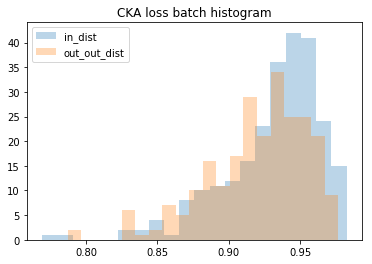

In [45]:
test_res = make_scores_pair(diverse_model, test)
out_res = make_scores_pair(diverse_model, out_out)
pd.Series((np.hstack(test_res[-1]))).hist(bins=20, grid=False, alpha=.3, label='in_dist')
pd.Series((np.hstack(out_res[-1]))).hist(bins=20, grid=False, alpha=.3, label='out_out_dist')
plt.legend()
plt.title('CKA loss batch histogram alpha = 0.0001')

In [ ]:
basic_in_out_res = make_scores_pair(basic_model, in_out)
basic_test_res = make_scores_pair(basic_model, test)
basic_out_res = make_scores_pair(basic_model, out_out)
pd.Series((np.hstack(basic_test_res[-1]))).hist(grid=False, alpha=.3, label='in_dist')
pd.Series((np.hstack(basic_out_res[-1]))).hist(grid=False, alpha=.3, label='out_out_dist')
pd.Series((np.hstack(basic_in_out_res[-1]))).hist(grid=False, alpha=.3, label='in_out_res')
plt.legend()
plt.title('CKA loss batch histogram')

In [7]:
diverse_in_out_res = make_scores_pair(diverse_model, in_out)
diverse_test_res = make_scores_pair(diverse_model, test)
diverse_out_res = make_scores_pair(diverse_model, out_out)
pd.Series((np.hstack(diverse_test_res[-1]))).hist(grid=False, alpha=.3, label='in_dist', desity=True)
pd.Series((np.hstack(diverse_out_res[-1]))).hist(grid=False, alpha=.3, label='out_out_dist', desity=True)
pd.Series((np.hstack(diverse_in_out_res[-1]))).hist(grid=False, alpha=.3, label='in_out_res', desity=True)
plt.legend()
plt.title('CKA loss batch histogram alpha = 0.1 ')

RuntimeError: received 0 items of ancdata

In [26]:
curr_prob = np.vstack(test_res[0])
labels = np.vstack(test_res[1])
aucs = [roc_auc_score(labels[:, i], curr_prob[:, i]) for i in range(len(test.dataset.label_names))]
auc_avg = np.mean(aucs)

## ranking checkup

In [104]:
labels_ = train.dataset.labels.numpy()
ranking = np.argsort(labels_.sum(0) / len(labels_))

In [110]:
labels__ = labels_.copy()
rank_hist = []
for label_ind in ranking:
    rank_hist.append((labels__[:, label_ind] == 1).sum())
    labels__ = labels__[labels__[:, label_ind] != 1]
print(rank_hist/)

[1375, 3553, 2935, 2142, 2830, 6651, 1371]


In [111]:
labels__ = labels_.copy()
rank_hist = []
for label_ind in ranking[::-1]:
    rank_hist.append((labels__[:, label_ind] == 1).sum())
    labels__ = labels__[labels__[:, label_ind] != 1]
print(rank_hist)

[8707, 6651, 2597, 1364, 765, 343, 430]


## confidance fusers

In [31]:
def thresh_calibration(thetas, labels):
    model_calibration = []
    for i in range(len(thetas)):
        curr_prob = thetas[i]
        curr_thresh = []
        for j in range(curr_prob.shape[1]):
            fpr, tpr, thresholds = roc_curve(labels[:, j], curr_prob[:, j])
            optimal_idx = np.argmax(tpr - fpr)
            curr_thresh.append(thresholds[optimal_idx])
        model_calibration.append(curr_thresh)
    return model_calibration

In [32]:
def ood_fuser_detector(mat_a, mat_b, threshhold_a, threshhold_b):
    return ((mat_a >= threshhold_a) != (mat_b >= threshhold_b))

In [33]:
def fuser_ood_detect(thetas, labels, calibration_th, n_classes=7, data=False):
    labels = labels[:, :n_classes]
    ood_prediction = ood_fuser_detector(thetas[0], thetas[1], calibration_th[0], calibration_th[1])
    return ood_prediction.mean(1).mean() if not data else ood_prediction.mean(1)

In [34]:
def thresh_fuser(mat_a, mat_b, threshhold_a, threshhold_b):
    return (mat_a >= threshhold_a) & (mat_b >= threshhold_b)

In [35]:
def ood_fuser_norm(thetas, labels, calibration_th, n_classes=7, data=False):
    labels = labels[:, :n_classes]
    ood_prediction = thresh_fuser(thetas[0], thetas[1], calibration_th[0], calibration_th[1])
    ood = (ood_prediction[:, 0] & ood_prediction[:, 1:].any(1))
    return ood.mean() if not data else ood

In [36]:
def fuser(thetas, labels, calibration_th, n_classes=7, metric=None):
    labels = labels[:, :n_classes]
    fuse_prediction = thresh_fuser(thetas[0], thetas[1], calibration_th[0], calibration_th[1])
    if metric is None:
        return (fuse_prediction == labels).mean(0)
    else:
        return metric(labels, fuse_prediction)

In [37]:
def fuser_ood(thetas, labels, calibration_th, n_classes=7, metric=None):
    labels = labels[:, :n_classes]
    fuse_prediction = thresh_fuser(thetas[0], thetas[1], calibration_th[0], calibration_th[1])
    if metric is None:
        return (fuse_prediction.sum(1) < 1).mean()
    else:
        metric(labels, fuse_prediction)

In [38]:
def corr_est(thetas):
    vx = (thetas[0].T - thetas[0].mean(1).T).T
    vy = (thetas[1].T - thetas[1].mean(1).T).T
    corr = (vx*vy).sum(1) / ((np.linalg.norm(vx, ord=2, axis=-1) * np.linalg.norm(vy, ord=2, axis=-1)) + 1e-6)
    return corr

In [39]:
def mean_thresh_calibration(thetas, labels):
    model_calibration = []
    thetas = np.stack(thetas).mean(0)
    model_calibration = []
    for j in range(thetas.shape[1]):
        fpr, tpr, thresholds = roc_curve(labels[:, j], thetas[:, j])
        optimal_idx = np.argmax(tpr - fpr)
        model_calibration.append(thresholds[optimal_idx])
    return np.array(model_calibration)

In [40]:
def mean_fuser(thetas, labels, calibration_th, n_classes=7, metric=None):
    labels = labels[:, :n_classes]
    thetas = np.stack(thetas).mean(0)
    fuse_prediction = (thetas >= calibration_th)
    if metric is None:
        return (fuse_prediction == labels).mean(0)
    else:
        return metric(labels, fuse_prediction)

In [41]:
def mean_theta_score(thetas, labels, n_classes=7, metric=average_precision_score, rev=False):
    labels = labels[:, :n_classes]
    thetas = np.stack(thetas).mean(0)
    if rev:
        labels = 1-labels
        thetas = 1-thetas
    return metric(labels, thetas)

In [42]:
def mean_pred_score(thetas, labels, calibration_th, n_classes=7, metric=accuracy_score):
    labels = labels[:, :n_classes]
    thetas = np.stack(thetas).mean(0)
    fuse_prediction = (thetas >= calibration_th)
    return metric(fuse_prediction, labels)

In [43]:
def mean_ood_pred_score(thetas, calibration_th, n_classes=7, metric=accuracy_score):
    thetas = np.stack(thetas).mean(0)
    fuse_prediction = 1-(thetas >= calibration_th)
    return metric(fuse_prediction, np.ones(fuse_prediction.shape))

In [44]:
def ood_detec_per_cond(out_res, calib, mean=False, data=False):
    out_labels = out_res[1][:, 7:]
    if mean:
        out_pred = np.stack(out_res[0]).mean(0) >= calib
    else:
        out_pred = thresh_fuser(out_res[0][0], out_res[0][1], calib[0], calib[1])
    ood = (out_pred.sum(1) < 1)
    res = ood.T.dot(out_labels) / out_labels.sum(0)
    return ood if data else res

In [45]:
def plot_cm_out_2(out_res, calib, mean=False):
    out_labels = out_res[1][:, 7:]
    if mean:
        out_pred = np.stack(out_res[0]).mean(0) >= calib
    else:
        out_pred = thresh_fuser(out_res[0][0], out_res[0][1], calib[0], calib[1])
    d = pd.DataFrame(np.concatenate([out_labels, out_pred], axis=1), columns=out_out.dataset.label_names)
    d = d.T.dot(d) / d.sum()
    cm = d.loc[out_out.dataset.label_names[:7].tolist()][out_out.dataset.label_names[7:].tolist()]
    sns.heatmap(cm, vmin=0, vmax=1, annot=True)
    plt.title("prediction probabilty of in-dist state given out-dist true affliction")
    plt.tight_layout()

In [46]:
def plot_cm_out(out_res):
    out_labels = out_res[1][:, 7:]
    out_pred = np.stack(out_res[0]).mean(0)
    d = pd.DataFrame(np.concatenate([out_labels, out_pred], axis=1), columns=out_out.dataset.label_names)
    d = d.corr()
    cm = d.loc[out_out.dataset.label_names[:7].tolist()][out_out.dataset.label_names[7:].tolist()]
    sns.heatmap(cm, vmin=-1, vmax=1, center=0, annot=True)
    plt.title("correlation between in-dist predicted state and out-dist true affliction")
    plt.tight_layout()

In [47]:
def plot_ground_cm_out():
    d = pd.DataFrame(out_out.dataset.labels.numpy(), columns=out_out.dataset.label_names)
    d = d.corr()
    cm = d.loc[out_out.dataset.label_names[:7].tolist()][out_out.dataset.label_names[7:].tolist()]
    f = sns.heatmap(cm, vmin=-1, vmax=1, center=0, annot=True)
    plt.title("correlation between in-dist predicted state and out-dist true affliction")
    return f, cm

## Tree fitting on diverse models

In [53]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [143]:
train_ranking = np.argsort(train.dataset.labels.numpy().sum(0) / len(train.dataset.labels))[::-1]

def get_rank_labels(labels, ranking):
    mul_value = np.arange(len(ranking))
    mul_value.put(ranking, np.arange(len(ranking))[::-1] + 1)
    rank_labels = np.argmax(labels * mul_value, 1)
    return rank_labels

In [144]:
def tree_modeling(res):
    emb_index = -2
    train_rank_labels = get_rank_labels(test.dataset.labels.numpy(), train_ranking)
    test_rank_labels = get_rank_labels(train.dataset.labels.numpy(), train_ranking)
    
    emb_a, emb_b = res['test'][emb_index]
    max_features = min(100, emb_a.shape[1])
    model_a = RandomForestClassifier(n_estimators=1000, min_samples_split=5, max_depth=50, max_features=max_features, verbose=1, n_jobs=20)
    model_b = RandomForestClassifier(n_estimators=1000, min_samples_split=5, max_depth=50, max_features=max_features, verbose=1, n_jobs=20)
    
    model_a = model_a.fit(emb_a, train_rank_labels)
    model_b = model_b.fit(emb_b, train_rank_labels)
    
    test_emb_a, test_emb_b = res['train'][emb_index]
    
    print('train')
    train_a = model_a.predict(emb_a)
    train_b = model_b.predict(emb_b)
    print((train_a == train_rank_labels).mean())
    print((train_b == train_rank_labels).mean())
    print((train_b == train_a).mean())

    print('test')
    test_a = model_a.predict(test_emb_a)
    test_b = model_b.predict(test_emb_b)
    print((test_a == test_rank_labels).mean())
    print((test_b == test_rank_labels).mean())
    print((test_b == test_a).mean())

    print('disagreement')
    out_emb_a, out_emb_b = res['out'][emb_index]
    print((model_a.predict(out_emb_a) == model_b.predict(out_emb_b)).mean())
    out_emb_a, out_emb_b = res['in_out'][emb_index]
    print((model_a.predict(out_emb_a) == model_b.predict(out_emb_b)).mean())


In [123]:
tree_modeling(joint_results[list(joint_results.keys())[0]])

NameError: name 'joint_results' is not defined

In [141]:
tree_modeling(joint_results[list(joint_results.keys())[-2]])

NameError: name 'joint_results' is not defined

In [145]:
tree_modeling(fdl_results[list(fdl_results.keys())[0]])

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    1.6s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   13.2s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:   32.3s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:   59.6s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:  1.3min finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    1.5s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:   13.1s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:   31.8s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:   58.5s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:  1.3min finished


train


[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.1s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.2s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.4s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.1s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.3s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.4s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    0.6s finished


1.0
1.0
1.0
test


[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.2s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.4s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.8s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    1.1s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.2s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.5s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.8s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    1.1s finished


0.41597545188665674
0.4170302536318742
0.9867670326509086
disagreement


[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.2s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.5s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.9s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    1.2s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.2s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.5s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.9s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    1.2s finished


0.9886070686070686


[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.1s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.3s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.6s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    0.7s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.1s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.3s
[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.6s


0.9939745592501674


[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    0.8s finished


### OSCRL

In [30]:
def get_model_performance(use_model):
    print(use_model)
    use_model = [os.path.join(use_model, model_path) for model_path in 
               os.listdir(use_model) if 'model' in model_path]
    
    model_train = make_scores_pair(use_model, train, train=True)
    model_test_res = make_scores_pair(use_model, test, train=True)
    model_in_out_res = make_scores_pair(use_model, in_out, train=True)
    model_out_res = make_scores_pair(use_model, out_out, train=True)
    
    model_calibration = thresh_calibration(model_train[0], model_train[1])
    test_res = fuser(model_test_res[0], model_test_res[1], model_calibration)
    print(test_res)
    out_res = fuser(model_out_res[0], model_out_res[1], model_calibration)
    print(out_res)
    in_out_res = fuser(model_in_out_res[0], model_in_out_res[1], model_calibration)
    print(in_out_res)
    ood_out = fuser_ood(model_out_res[0], model_out_res[1], model_calibration)
    print(ood_out)
    ood_in = fuser_ood(model_in_out_res[0], model_in_out_res[1], model_calibration)
    print(ood_in)
    res = dict({'train':model_train, 'test':model_test_res, 'in_out':model_in_out_res, 'out':model_out_res,
                'calibration': model_calibration, 'test_res': test_res, 'in_out_res':in_out_res, 'out_res':out_res,
                'ood_out':ood_out, 'ood_in':ood_in
               })
    return res

In [25]:
def cka_rejection_scores(res, layer='class', thresh=5, upper=False):
    layer = 2 if layer=='class' else 3
    percentile = np.percentile(res['test'][layer], 100 - thresh if upper else thresh)
    out_reject = ((res['out'][layer] < percentile) if not upper else (res['out'][layer] > percentile)).mean()
    in_out_reject = ((res['in_out'][layer] < percentile) if not upper else (res['in_out'][layer] > percentile)).mean()
    test_auc = mean_theta_score(res['test'][0], res['test'][1], metric=roc_auc_score)
    return out_reject, in_out_reject, test_auc

In [26]:
def plot_cka_scores(res, name='', layer='class', upper=False):
    layer_n = 2 if layer=='class' else 3

    density = False
    plt.figure()
    
    pd.Series(res['test'][layer_n]).hist(bins=20, grid=False, alpha=.3, label='test', density=density)
    pd.Series(res['out'][layer_n]).hist(bins=20, grid=False, alpha=.3, label='out_out', density=density)
    pd.Series(res['in_out'][layer_n]).hist(bins=20, grid=False, alpha=.3, label='in_out', density=density)
    plt.legend()
    plt.title('CKA loss batch histogram alpha = '+name)
    
    out_reject, in_out_reject, test_auc = cka_rejection_scores(res, layer=layer, upper=upper)
    print("out_reject", out_reject)
    print("in_out_reject", in_out_reject)

In [57]:
oscrl_model_list = [model_dir+'/OSCRL/'+d for d in os.listdir(model_dir +'/'+"OSCRL") if 'limited=1' in d]

In [59]:
oscrl_results = {model:get_model_performance(model) for model in oscrl_model_list}

work_space/save/CheXpert/OSCRL/2020-06-08_14:48_cifar_n=2_densenet121_lr=0.0001_m=_a=0_55_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.77738787 0.87893409 0.64414958 0.7840772  0.74416054 0.76039039
 0.72135103]
[0.68661123 0.92453222 0.76066528 0.82370062 0.82544699 0.8993763
 0.78515593]
[0.90216308 0.92571297 0.54022672 0.6832592  0.62079918 0.74620271
 0.60067094]
0.21334719334719335
0.11026644252369122
work_space/save/CheXpert/OSCRL/2020-06-08_21:41_cifar_n=2_densenet121_lr=0.0001_m=_a=0.1_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.79723654 0.70610813 0.64996162 0.75907446 0.63417041 0.6655335
 0.66882334]
[0.64191268 0.68299376 0.51251559 0.79621622 0.63164241 0.72632017
 0.61742204]
[0.92321367 0.76998319 0.66182924 0.64355316 0.42513277 0.44453205
 0.55935822]
0.06835758835758836
0.03272140317469763
work_space/save/CheXpert/OSCRL/2020-06-08_14:47_cifar_n=2_densenet121_lr=0.0001_m=_a=0.01_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.79109551 0.8027196  0.67244215 0.78923128 0.7092883  0.73056256
 0.71948679]
[0.5595842  0.8206237  0.66885655 0.72266112 0.69110187 0.82432432
 0.67089397]
[0.88893765 0.88289025 0.6100061  0.66106309 0.52172005 0.65038159
 0.59274164]
0.03288981288981289
0.011112929380085988
work_space/save/CheXpert/OSCRL/2020-06-08_21:41_cifar_n=2_densenet121_lr=0.0001_m=_a=0.001_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.79405637 0.85228643 0.65445773 0.78988924 0.74854699 0.74734072
 0.71707424]
[0.6393763  0.88494802 0.69742204 0.77010395 0.77180873 0.86557173
 0.76382536]
[0.9031747  0.90123328 0.60445707 0.67240661 0.57202577 0.68552046
 0.59631949]
0.1483991683991684
0.06471384578764933


work_space/save/CheXpert/OSCRL/2020-06-08_14:48_cifar_n=2_densenet121_lr=0.0001_m=_a=0_55_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


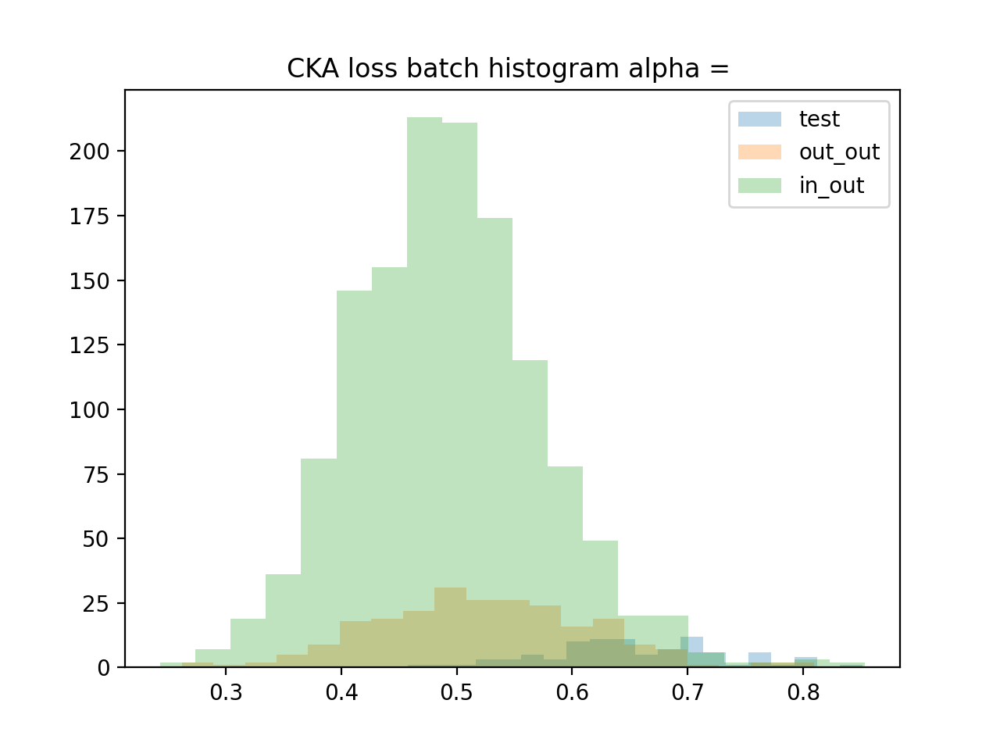

out_reject 0.5269709543568465
in_out_reject 0.6802973977695167
work_space/save/CheXpert/OSCRL/2020-06-08_21:41_cifar_n=2_densenet121_lr=0.0001_m=_a=0.1_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


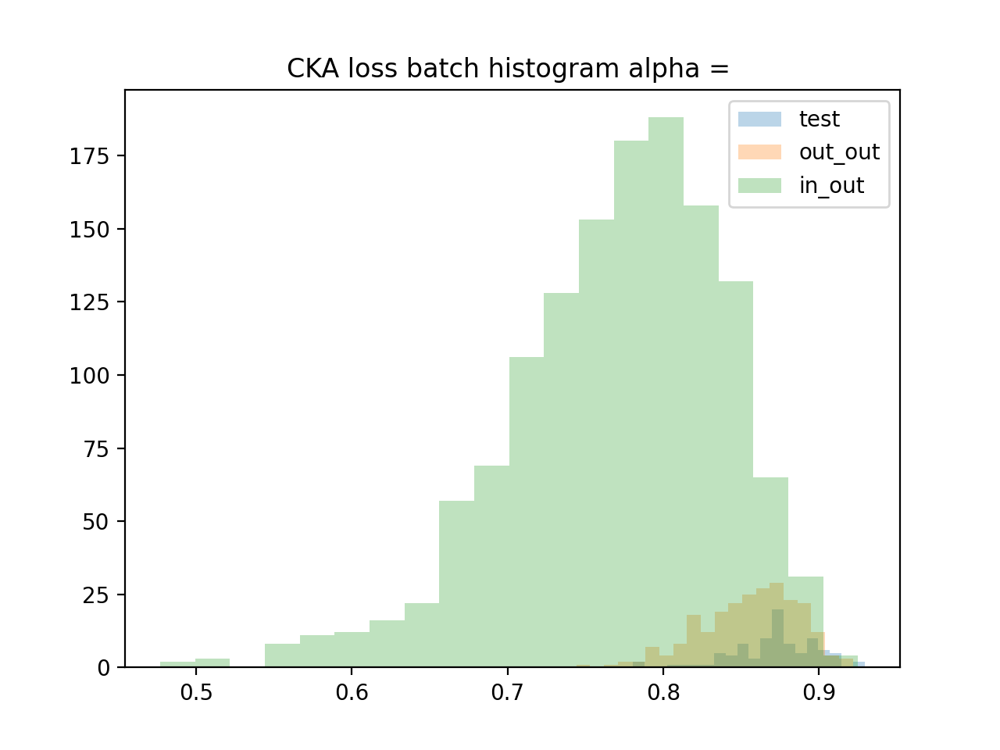

out_reject 0.1825726141078838
in_out_reject 0.7665427509293681
work_space/save/CheXpert/OSCRL/2020-06-08_14:47_cifar_n=2_densenet121_lr=0.0001_m=_a=0.01_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


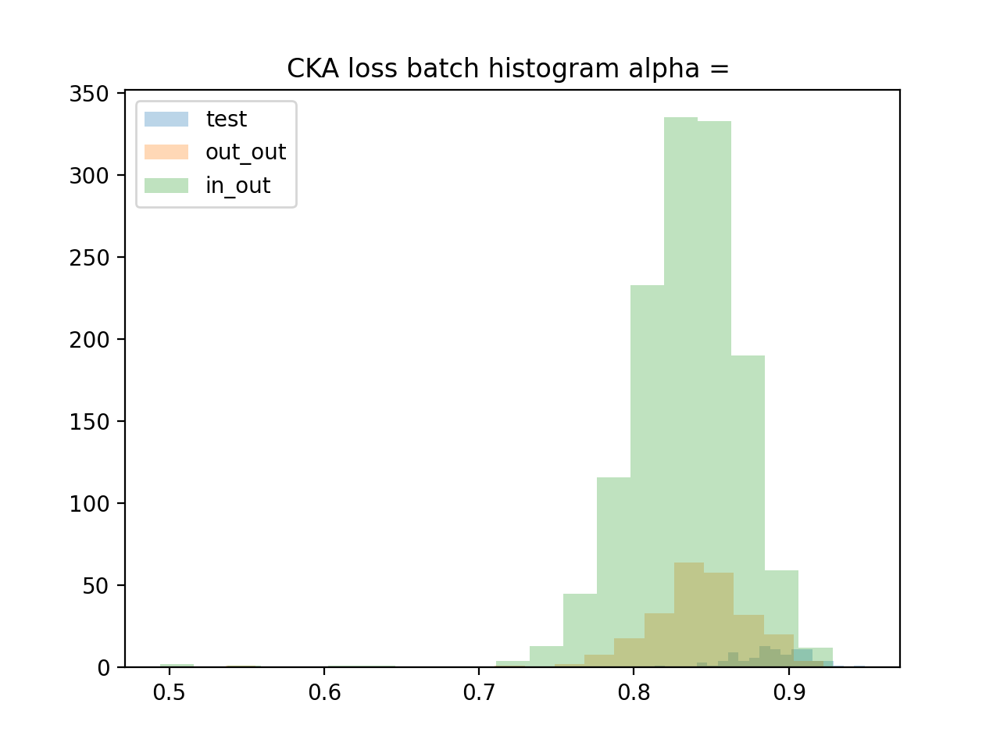

out_reject 0.6431535269709544
in_out_reject 0.7011152416356877
work_space/save/CheXpert/OSCRL/2020-06-08_21:41_cifar_n=2_densenet121_lr=0.0001_m=_a=0.001_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


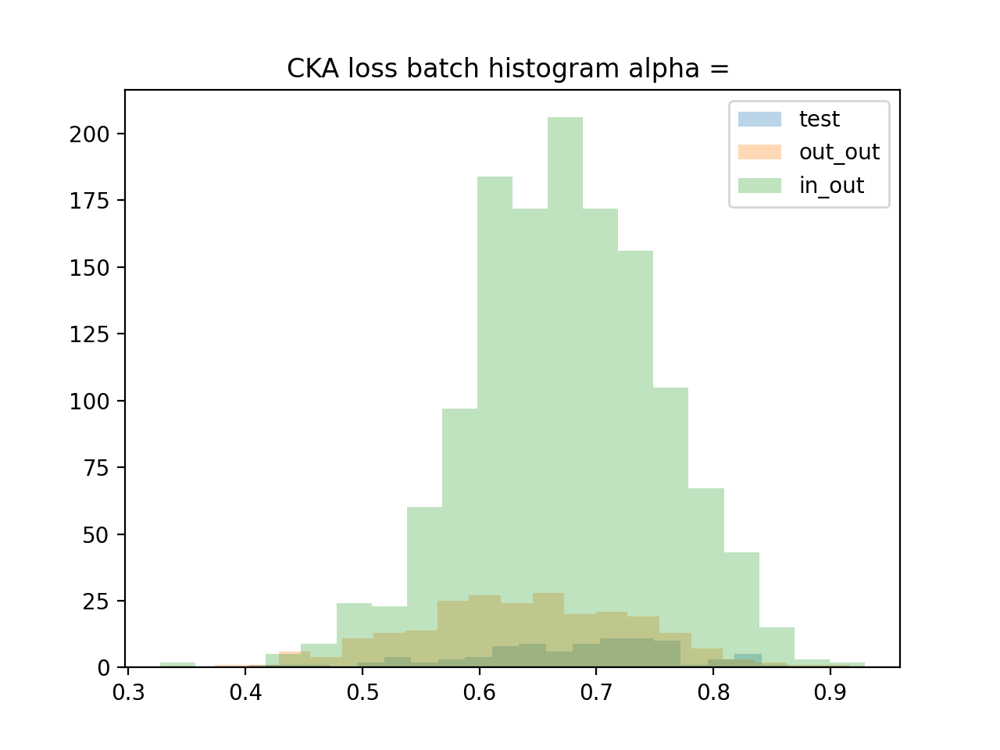

out_reject 0.12033195020746888
in_out_reject 0.035687732342007436


In [60]:
for model in oscrl_results:
    print(model)
    plot_cka_scores(oscrl_results[model])

work_space/save/CheXpert/OSCRL/2020-06-08_14:48_cifar_n=2_densenet121_lr=0.0001_m=_a=0_55_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


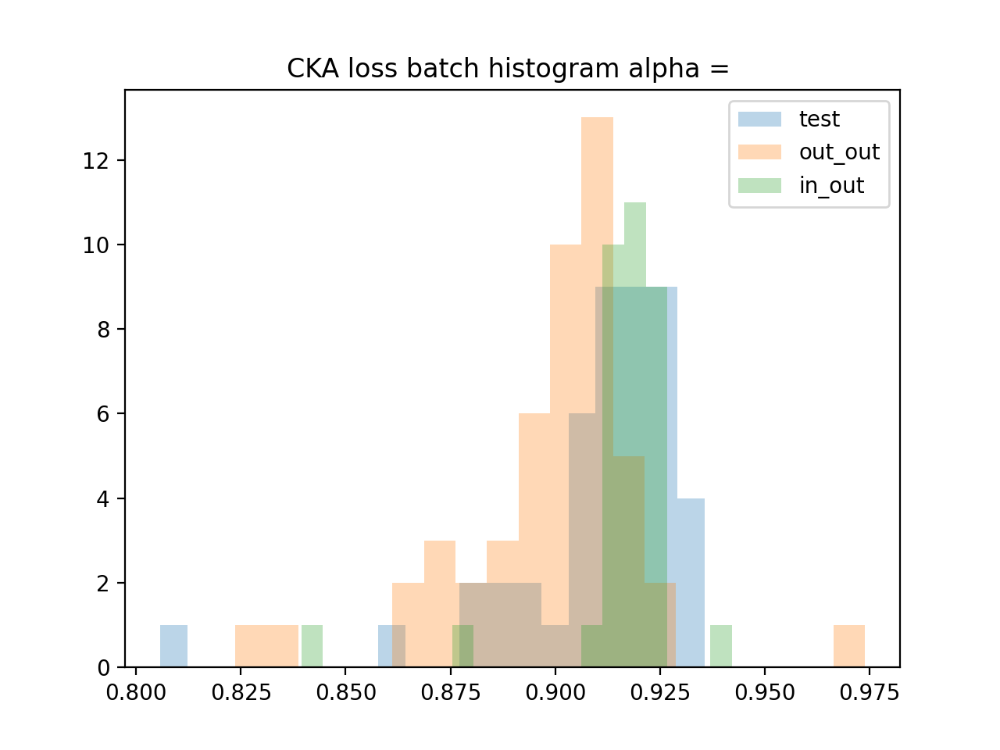

out_reject 0.1836734693877551
in_out_reject 0.058823529411764705
work_space/save/CheXpert/OSCRL/2020-06-08_21:41_cifar_n=2_densenet121_lr=0.0001_m=_a=0.1_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


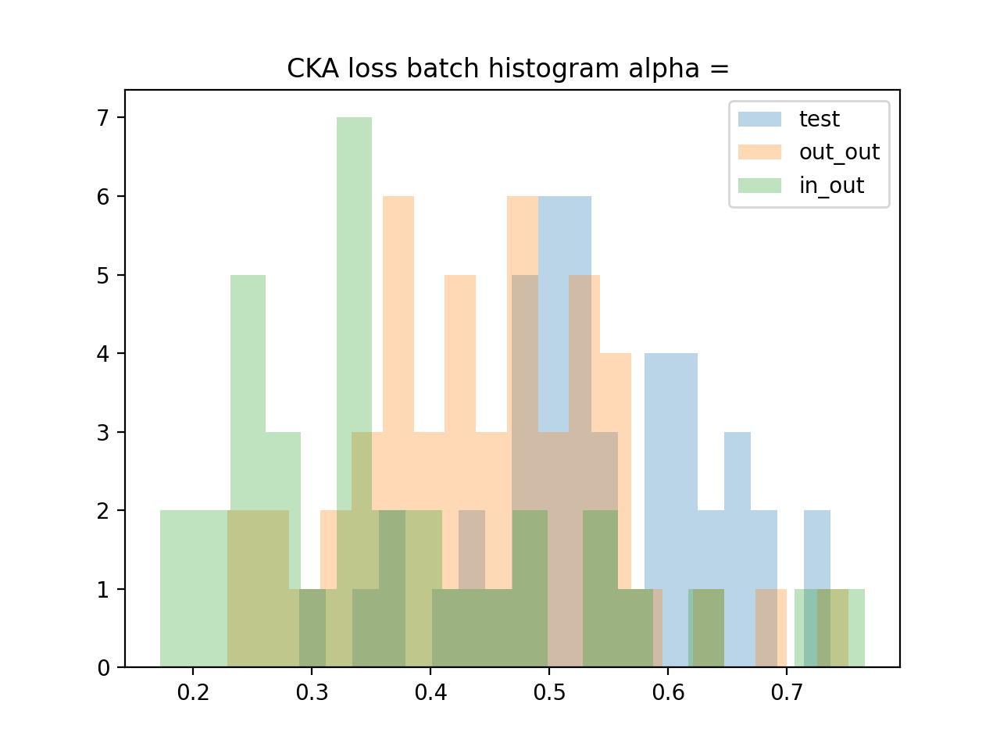

out_reject 0.20408163265306123
in_out_reject 0.6176470588235294
work_space/save/CheXpert/OSCRL/2020-06-08_14:47_cifar_n=2_densenet121_lr=0.0001_m=_a=0.01_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


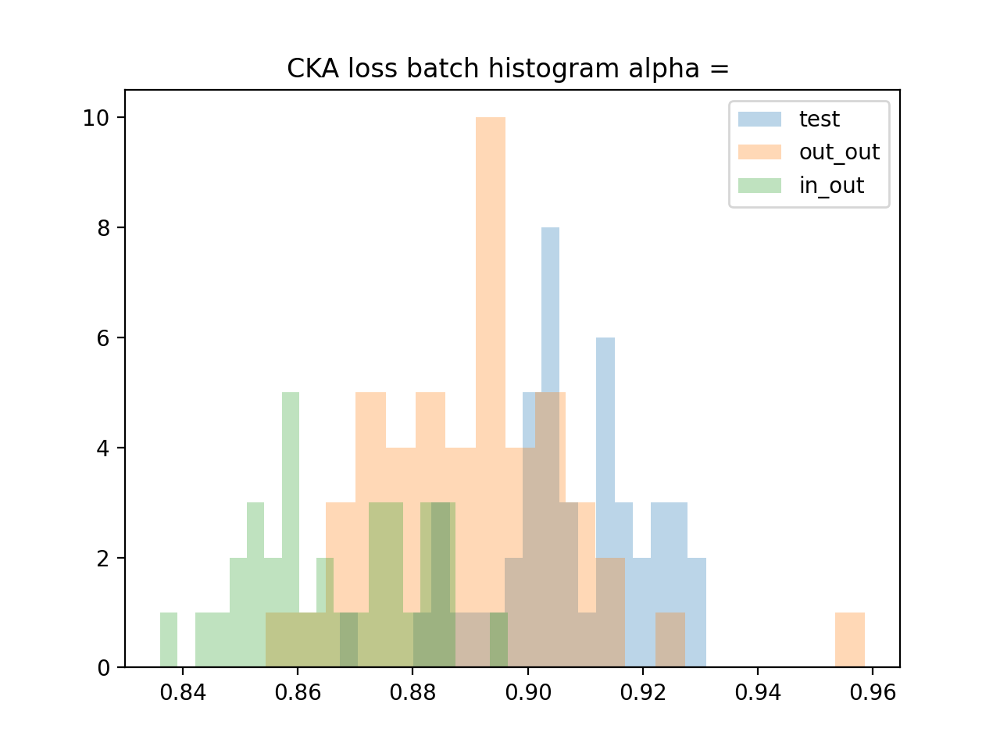

out_reject 0.32653061224489793
in_out_reject 0.8529411764705882
work_space/save/CheXpert/OSCRL/2020-06-08_21:41_cifar_n=2_densenet121_lr=0.0001_m=_a=0.001_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


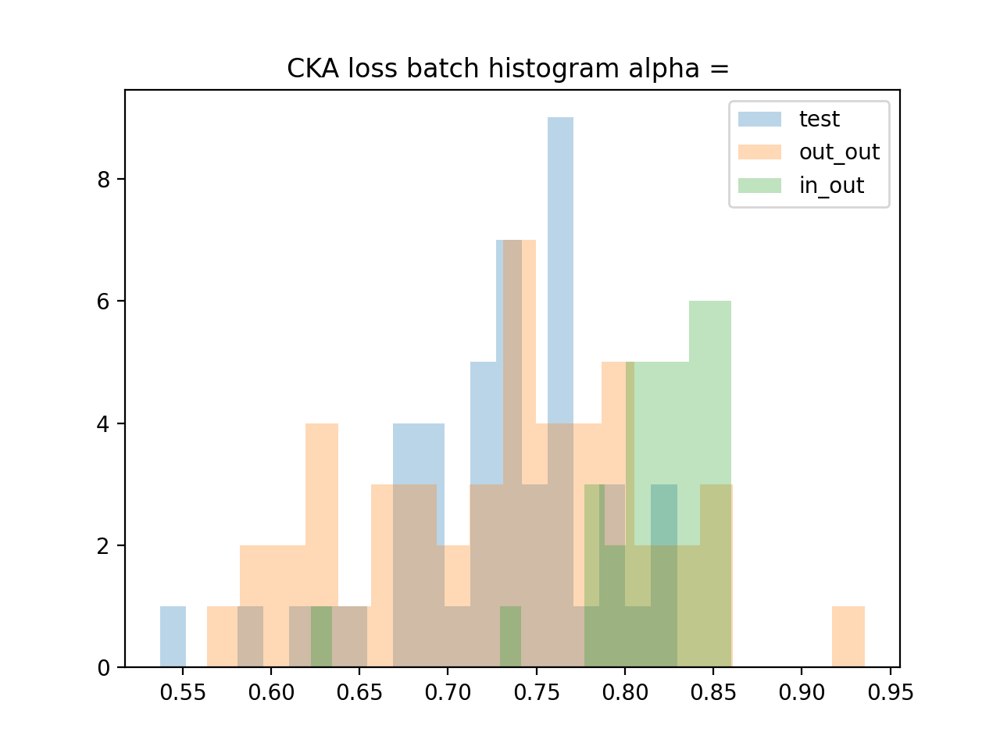

out_reject 0.10204081632653061
in_out_reject 0.0


In [92]:
for model in oscrl_results:
    print(model)
    plot_cka_scores(oscrl_results[model], layer='emb')

In [73]:
diverse_model = model_dir +"/OSCRL/2020-06-08_21:41_cifar_n=2_densenet121_lr=0.0001_m=_a=0.1_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1"
results['OSCRL_0.1'] = get_model_performance(diverse_model)

work_space/save/CheXpert/OSCRL/2020-06-08_21:41_cifar_n=2_densenet121_lr=0.0001_m=_a=0.1_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.794      0.74755556 0.64444444 0.75622222 0.612      0.63311111
 0.65511111]
[0.64958333 0.70916667 0.47708333 0.799375   0.57270833 0.63083333
 0.57729167]
[0.92454545 0.79242424 0.66727273 0.64545455 0.39242424 0.35181818
 0.53818182]
0.07104166666666667
0.03393939393939394


In [74]:
fuser_ood_detect(results['OSCRL_0.1']['out'][0], results['OSCRL_0.1']['out'][1], results['OSCRL_0.1']['calibration'])
fuser_ood_detect(results['OSCRL_0.1']['test'][0], results['OSCRL_0.1']['test'][1], results['OSCRL_0.1']['calibration'])

0.2188095238095238

0.19901587301587298

<IPython.core.display.Javascript object>


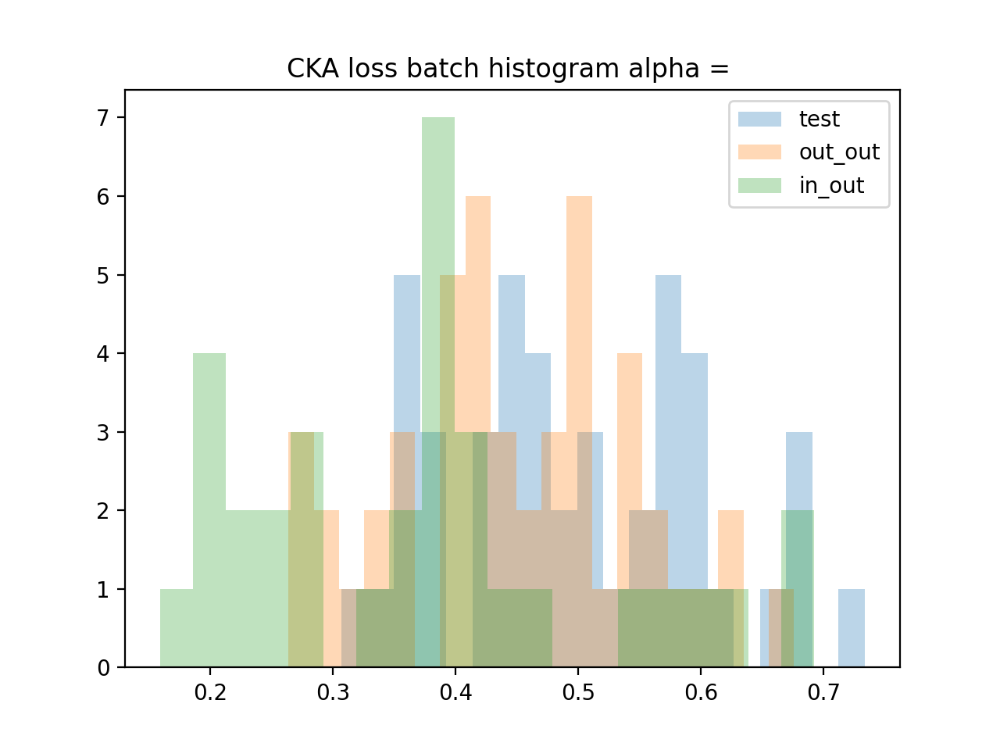

In [75]:
plot_cka_scores(results['OSCRL_0.1'])

In [76]:
diverse_model = model_dir +"/OSCRL/2020-06-08_14:47_cifar_n=2_densenet121_lr=0.0001_m=_a=0.01_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1"
results['OSCRL_0.01'] = get_model_performance(diverse_model)

work_space/save/CheXpert/OSCRL/2020-06-08_14:47_cifar_n=2_densenet121_lr=0.0001_m=_a=0.01_55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.78844444 0.78177778 0.66333333 0.79488889 0.69977778 0.71288889
 0.71911111]
[0.586875   0.81375    0.651875   0.77625    0.68895833 0.82208333
 0.67479167]
[0.89606061 0.87606061 0.60454545 0.66545455 0.52969697 0.64060606
 0.59121212]
0.049791666666666665
0.019393939393939394


In [77]:
fuser_ood_detect(results['OSCRL_0.01']['out'][0], results['OSCRL_0.01']['out'][1], results['OSCRL_0.01']['calibration'])
fuser_ood_detect(results['OSCRL_0.01']['test'][0], results['OSCRL_0.01']['test'][1], results['OSCRL_0.01']['calibration'])

0.15151785714285712

0.12939682539682537

<IPython.core.display.Javascript object>


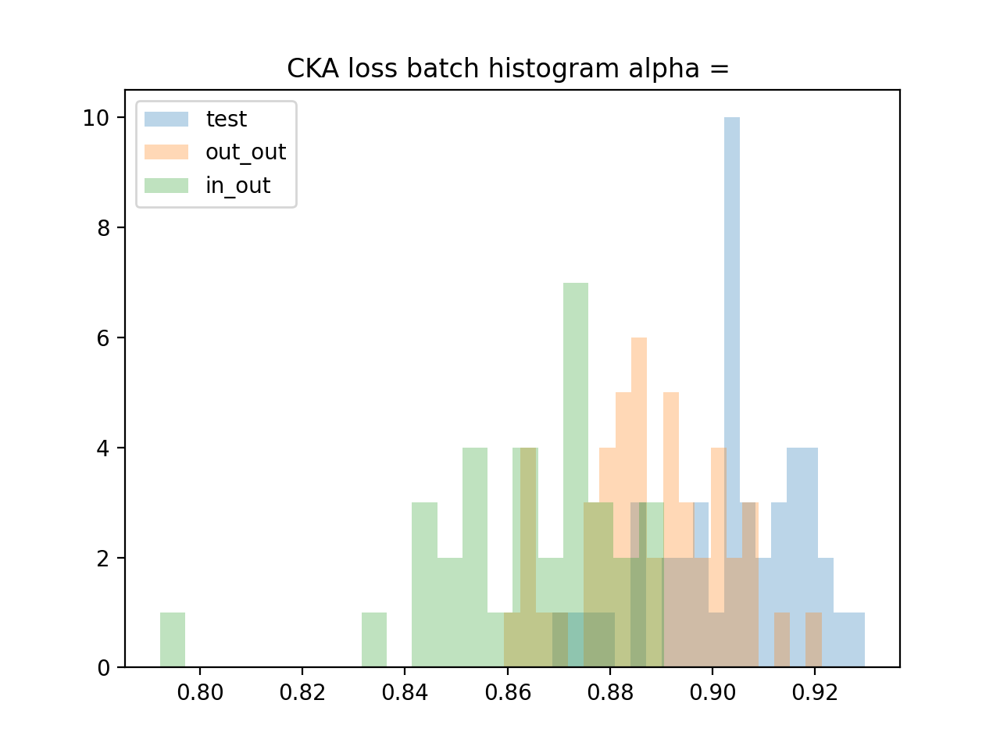

In [78]:
plot_cka_scores(results['OSCRL_0.01'])

## joint

In [25]:
os.listdir(model_dir +"/Joint")

['2020-06-30_11:54_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1',
 '2020-06-30_13:28_n=2_densenet121_lr=0.0001_m=_a=1.0_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1',
 '2020-07-05_15:26_n=2_densenet121_lr=0.0001_m=_a=0.0_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1',
 '2020-07-02_13:02_n=2_densenet121_lr=0.0001_m=_a=0.1_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1',
 '2020-07-01_15:53_n=2_densenet121_lr=0.0001_m=_a=0.25_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1',
 '2020-07-06_15:23_n=3_densenet121_lr=0.0001_m=_a=0.25_32_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1',
 '2020-06-30_13:28_n=2_densenet121_lr=0.0001_m=_a=0.5_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50

In [27]:
joint_model_list = [model_dir+'/Joint/'+d for d in os.listdir(model_dir +'/'+"Joint") if 'n=2' in d]

In [48]:
joint_results = {model:get_model_performance(model) for model in joint_model_list[-3:]}

work_space/save/CheXpert/Joint/2020-07-02_13:02_n=2_densenet121_lr=0.0001_m=_a=0.1_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.7835289  0.92499178 0.63373177 0.78177432 0.77727821 0.79592061
 0.73286545]
[0.72365904 0.97422037 0.79505198 0.85663202 0.89118503 0.94756757
 0.83746362]
[0.9277691  0.94800268 0.50390538 0.67894071 0.68042848 0.82518783
 0.61258648]
0.27180873180873183
0.1720598080785539
work_space/save/CheXpert/Joint/2020-07-01_15:53_n=2_densenet121_lr=0.0001_m=_a=0.25_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.7939467  0.92214059 0.64031144 0.78977958 0.77870381 0.79328874
 0.72672442]
[0.72985447 0.98095634 0.78112266 0.86349272 0.91168399 0.94948025
 0.85488565]
[0.92382653 0.94688686 0.50807112 0.68199063 0.70125716 0.83151082
 0.61913263]
0.2979209979209979
0.1995834263185301
work_space/save/CheXpert/Joint/2020-06-30_13:28_n=2_densenet121_lr=0.0001_m=_a=0.5_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.78023906 0.91994736 0.63811821 0.79570128 0.7801294  0.79526264
 0.72639544]
[0.74711019 0.9837422  0.77596674 0.86519751 0.89617464 0.94178794
 0.84893971]
[0.92531429 0.95030871 0.50212006 0.68533809 0.69634754 0.81581492
 0.61362791]
0.29904365904365904
0.1975749460685859


In [115]:
del joint_results

In [51]:
# pickle.dump(joint_results[joint_model_list[-3]], open('joint_res_w_emb', 'wb'))
# joint_results = pickle.load(open('joint_res_w_emb', 'rb'))

OverflowError: cannot serialize a bytes object larger than 4 GiB

In [80]:
for joint_model in joint_model_list:
    print(joint_model)
    curr_joint_res = joint_results[joint_model]
    print(fuser(curr_joint_res['out'][0], curr_joint_res['out'][1], curr_joint_res['calibration']))
    print(fuser(curr_joint_res['test'][0], curr_joint_res['test'][1], curr_joint_res['calibration']))


work_space/save/CheXpert/Joint/2020-06-30_13:28_n=2_densenet121_lr=0.0001_m=_a=1.0_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1
[0.73600832 0.98349272 0.77555094 0.87995842 0.90686071 0.95114345
 0.83650728]
[0.79186314 0.92619805 0.62243667 0.78484483 0.78725737 0.79953942
 0.73538765]
work_space/save/CheXpert/Joint/2020-07-05_15:26_n=2_densenet121_lr=0.0001_m=_a=0.0_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1
[0.74328482 0.97309771 0.76365904 0.86095634 0.89359667 0.93654886
 0.8233264 ]
[0.7874767  0.91775414 0.63088058 0.78133567 0.77453668 0.79548196
 0.71740322]
work_space/save/CheXpert/Joint/2020-07-02_13:02_n=2_densenet121_lr=0.0001_m=_a=0.1_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1
[0.72914761 0.97891892 0.79031185 0.86553015 0.88544699 0.94386694
 0.84619543]
[0.79252111 0.92060533 0.63186753 0.79032789 0.78330957 0.79515298
 0.74163

(curr_joint_res['test'][0][0].mean(1) - curr_joint_res['test'][0][1].mean(1))

In [73]:
pickle.dump(joint_results, open('joint_res', 'wb'))
# joint_results = pickle.load(open('joint_res', 'rb'))

work_space/save/CheXpert/Joint/2020-06-30_13:28_n=2_densenet121_lr=0.0001_m=_a=1.0_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


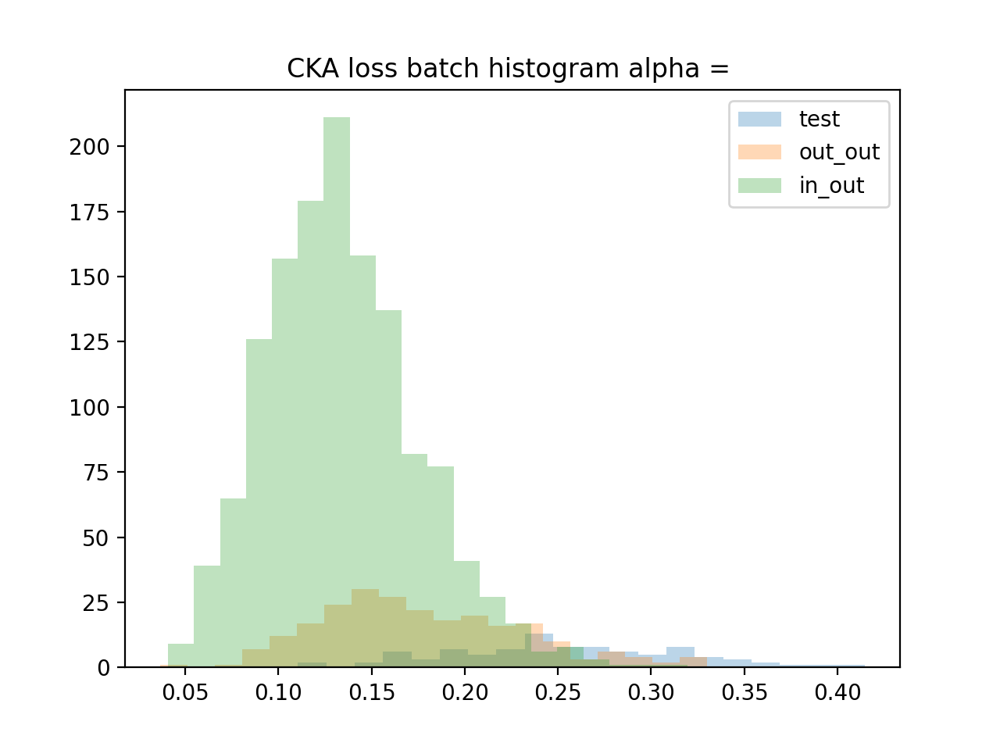

out_reject 0.43983402489626555
in_out_reject 0.7702602230483271
work_space/save/CheXpert/Joint/2020-07-02_13:02_n=2_densenet121_lr=0.0001_m=_a=0.1_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


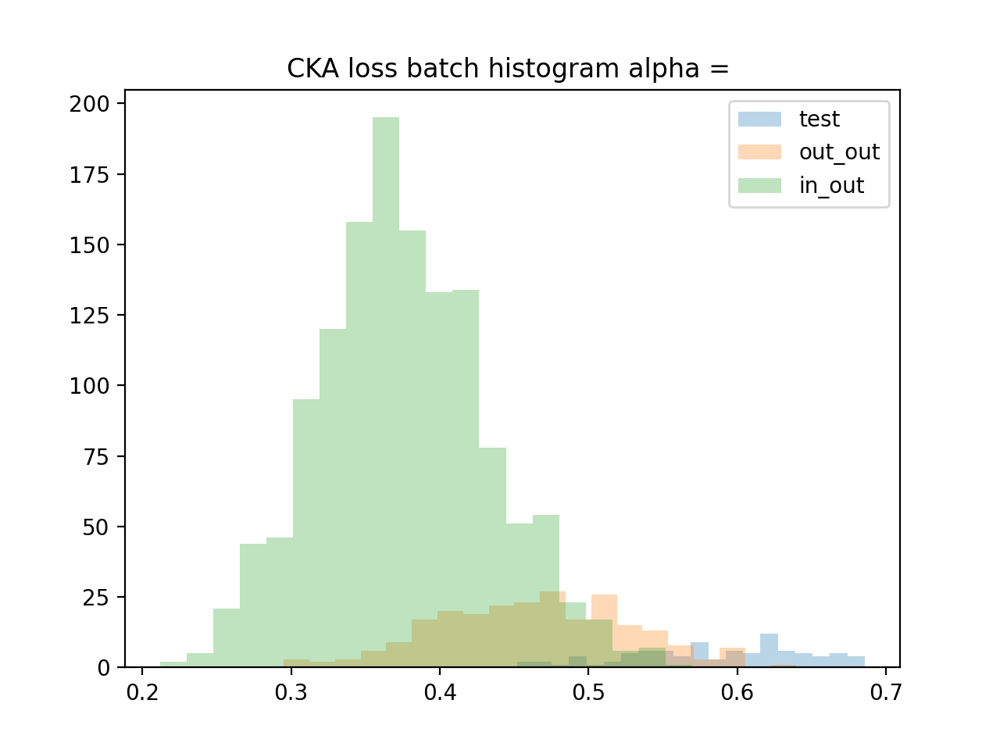

out_reject 0.6265560165975104
in_out_reject 0.9643122676579926
work_space/save/CheXpert/Joint/2020-07-01_15:53_n=2_densenet121_lr=0.0001_m=_a=0.25_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


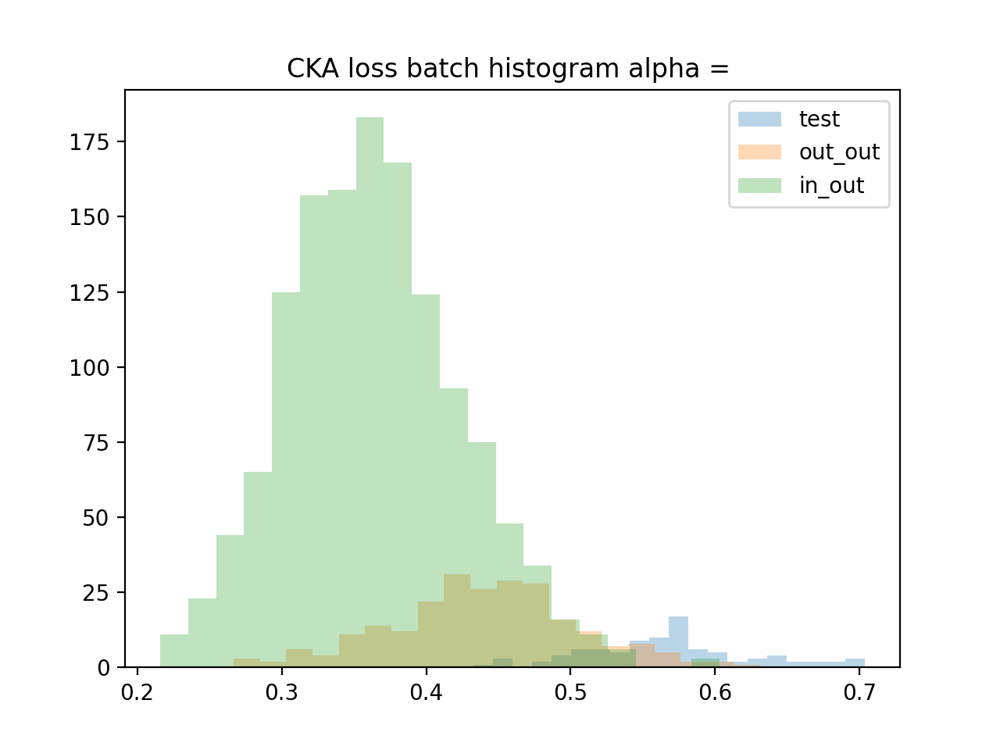

out_reject 0.7676348547717843
in_out_reject 0.9635687732342008
work_space/save/CheXpert/Joint/2020-06-30_13:28_n=2_densenet121_lr=0.0001_m=_a=0.5_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


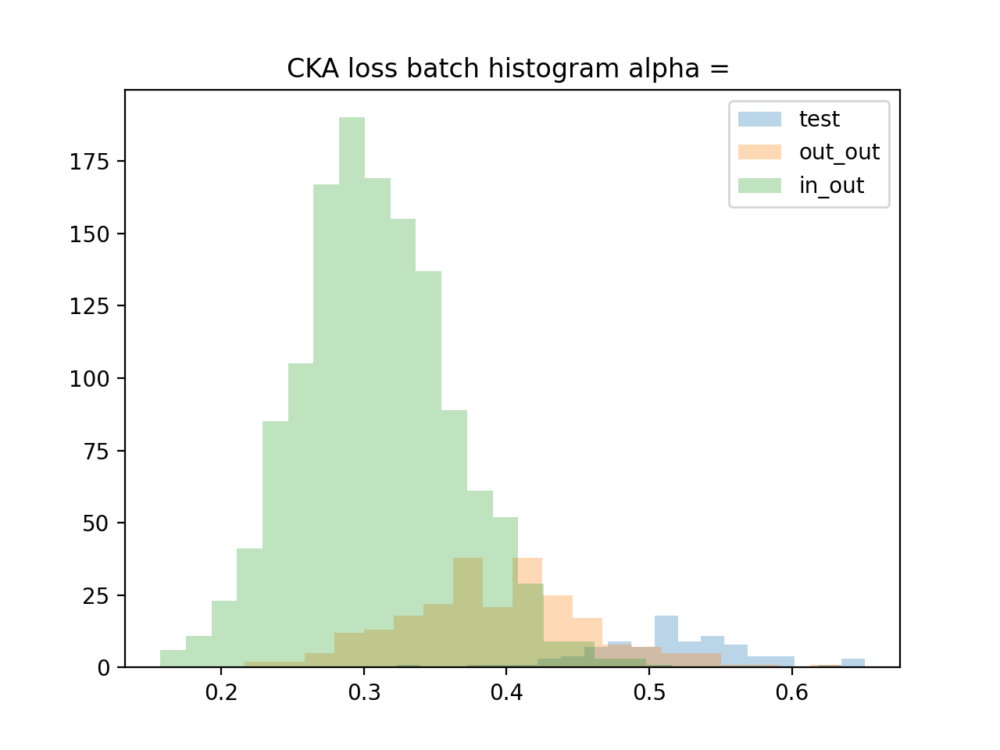

out_reject 0.7261410788381742
in_out_reject 0.9821561338289962


In [32]:
for model in joint_results:
    print(model)
    plot_cka_scores(joint_results[model], layer='class')

work_space/save/CheXpert/Joint/2020-06-30_13:28_n=2_densenet121_lr=0.0001_m=_a=1.0_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


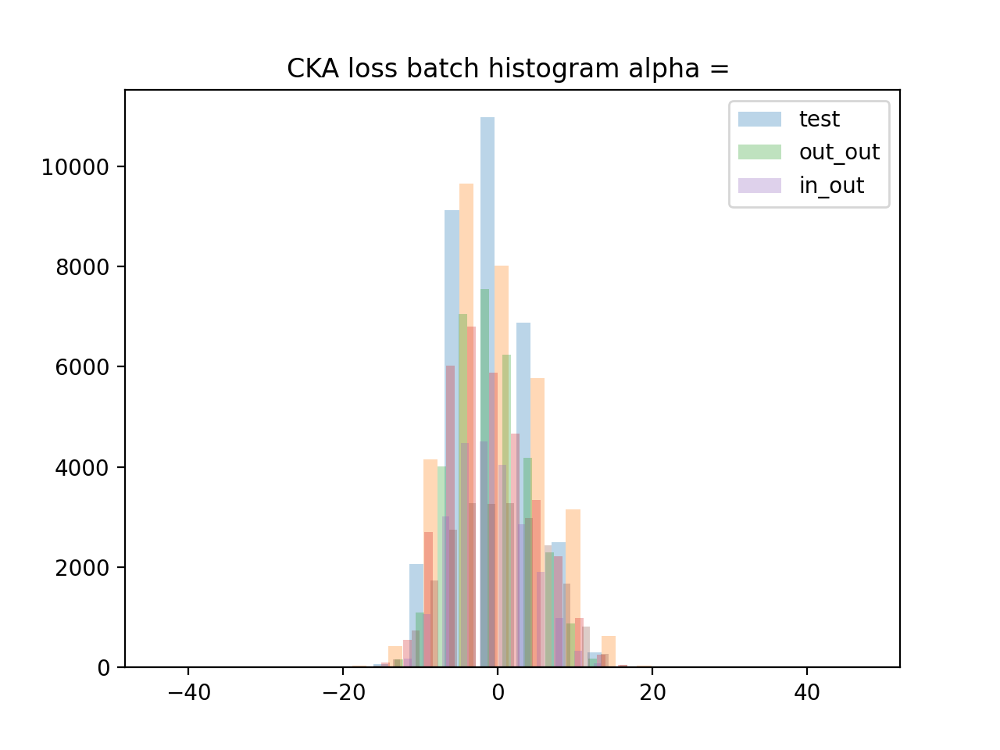

out_reject 0.04542619542619543
in_out_reject 0.043048469387755105
work_space/save/CheXpert/Joint/2020-06-30_13:28_n=2_densenet121_lr=0.0001_m=_a=0.5_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1


<IPython.core.display.Javascript object>


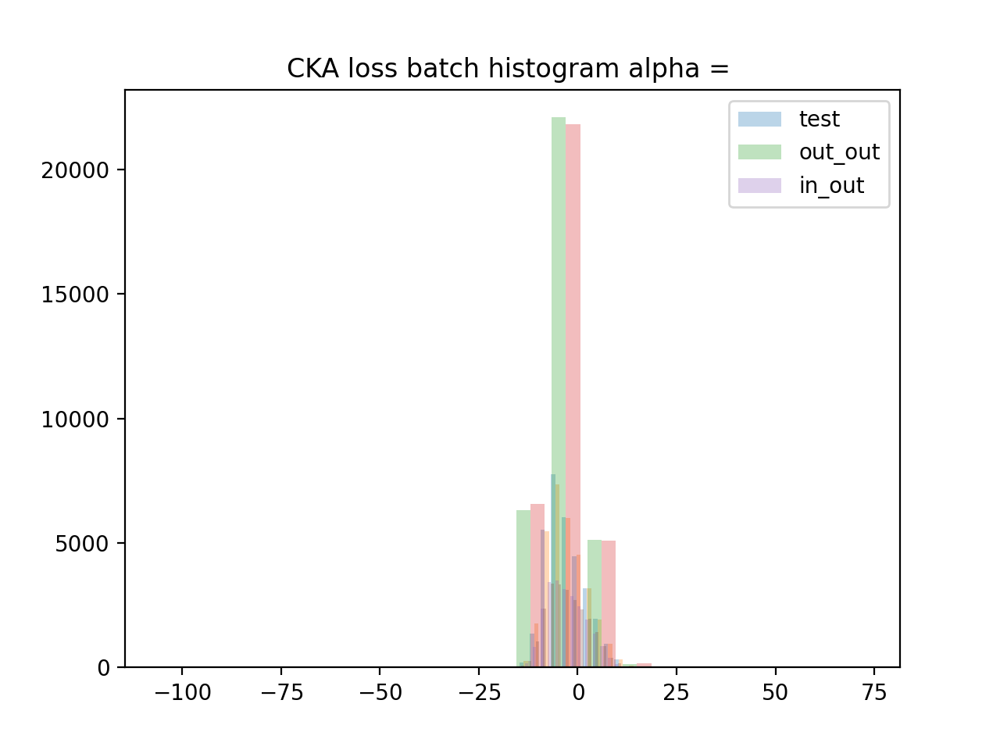

out_reject 0.049569349569349566
in_out_reject 0.04300595238095238


In [123]:
for model in joint_results:
    print(model)
    plot_cka_scores(joint_results[model], layer='emb')

In [488]:
joint_model_list_3 = [model_dir+'/Joint/'+d for d in os.listdir(model_dir +'/'+"Joint") if 'n=3' in d]

In [494]:
joint_results_3 = {model:get_model_performance(model) for model in joint_model_list_3}

work_space/save/CheXpert/Joint/2020-07-06_15:23_n=3_densenet121_lr=0.0001_m=_a=0.25_32_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.78396754 0.87630223 0.63120956 0.77300143 0.73451036 0.75479768
 0.72025441]
[0.70282744 0.91821206 0.73409563 0.8170894  0.79110187 0.86702703
 0.78324324]
[0.91586699 0.91757792 0.54571152 0.68065164 0.60983411 0.73413673
 0.60098192]
0.1718087318087318
0.09246447965483895
work_space/save/CheXpert/Joint/2020-07-06_15:22_n=3_densenet121_lr=0.0001_m=_a=0.0_32_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.78835399 0.89538327 0.65248382 0.78901195 0.768286   0.77607194
 0.72376357]
[0.71172557 0.94274428 0.75239085 0.85176715 0.85301455 0.90935551
 0.81189189]
[0.9202559  0.93104218 0.55396861 0.68169307 0.65565722 0.76656996
 0.60842074]
0.23954261954261954
0.13575838726474745
work_space/save/CheXpert/Joint/2020-07-06_15:24_n=3_densenet121_lr=0.0001_m=_a=0.5_32_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1



[0.77453668 0.87926308 0.63362211 0.78056804 0.74437987 0.76028073
 0.71444237]
[0.72133056 0.92241164 0.73006237 0.8160499  0.79467775 0.86261954
 0.78216216]
[0.91185003 0.91847058 0.54719929 0.66845198 0.60180019 0.74529495
 0.59622108]
0.19954261954261954
0.11492970319125195


### FDL

In [116]:
def get_model_performance_fdl(diverse_model):
    basic_model = model_dir +'/'+"FDL/2020-06-09_09:05_n=1_densenet121_lr=0.0001_m=__55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1"
    print(diverse_model)
    basic_model_path = [os.path.join(basic_model, model_path) for model_path in  
                   os.listdir(basic_model) if 'model' in model_path]
    diverse_model_path = [os.path.join(diverse_model, model_path) for model_path in 
                     os.listdir(diverse_model) if 'model' in model_path]
    fdl_div_model = basic_model_path + diverse_model_path

    fdl_div_train = make_scores_pair(fdl_div_model, train, train=True)
    fdl_div_test_res = make_scores_pair(fdl_div_model, test, train=True)
    fdl_div_in_out_res = make_scores_pair(fdl_div_model, in_out, train=True)
    fdl_div_out_res = make_scores_pair(fdl_div_model, out_out, train=True)
    
    fdl_div_calibration = thresh_calibration(fdl_div_train[0], fdl_div_train[1])
    test_res = fuser(fdl_div_test_res[0], fdl_div_test_res[1], fdl_div_calibration)
    print(test_res)
    out_res = fuser(fdl_div_out_res[0], fdl_div_out_res[1], fdl_div_calibration)
    print(out_res)
    in_out_res = fuser(fdl_div_in_out_res[0], fdl_div_in_out_res[1], fdl_div_calibration)
    print(in_out_res)
    ood_out = fuser_ood(fdl_div_out_res[0], fdl_div_out_res[1], fdl_div_calibration)
    print(ood_out)
    ood_in = fuser_ood(fdl_div_in_out_res[0], fdl_div_in_out_res[1], fdl_div_calibration)
    print(ood_in)
    res = dict({'train':fdl_div_train, 'test':fdl_div_test_res, 'in_out':fdl_div_in_out_res, 'out':fdl_div_out_res,
                'calibration': fdl_div_calibration, 'test_res': test_res, 'in_out_res':in_out_res, 'out_res':out_res,
                'ood_out':ood_out, 'ood_in':ood_in
               })
    return res

In [117]:
fdl_model_list = [model_dir+'/FDL/'+d for d in os.listdir(model_dir +'/'+"FDL") if 'morph' in d and 'zero' not in d]
fdl_model_list = sorted(fdl_model_list, key=lambda x: float(re.findall(r'=([\d\.\d]+)',x)[-1]))

In [119]:
fdl_model_list[2:3]

['work_space/save/CheXpert/FDL/2020-06-22_08:04_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0']

In [120]:
fdl_results = {model:get_model_performance_fdl(model) for model in fdl_model_list[2:3]}

work_space/save/CheXpert/FDL/2020-06-22_08:04_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0



[0.79208247 0.88891326 0.64414958 0.78846365 0.76499616 0.76751837
 0.72694374]
[0.70523909 0.93550936 0.76972973 0.83704782 0.87679834 0.90640333
 0.80648649]
[0.91192442 0.92643011 0.53700811 0.6941159  0.67842    0.75176672
 0.60358551]
0.25351351351351353
0.13739492672766496


In [30]:
# pickle.dump(fdl_results, open('fdl_res', 'wb'))
fdl_results = pickle.load(open('fdl_res', 'rb'))

In [25]:
results_ = {re.findall(r'=([\d\.\d]+)',k)[-1]+('_zero' if 'zero' in k else ''):v for k,v in results.items()}

In [105]:
for model in model_list:
    results[model]['mean_calibration'] = mean_thresh_calibration(results[model]['train'][0], results[model]['train'][1])

In [29]:
for model in model_list:
    calib = results[model]['mean_calibration']
    results[model]['mean_test_res'] = mean_fuser(results[model]['test'][0], results[model]['test'][1], calib)
    results[model]['mean_in_out_res'] = mean_fuser(results[model]['in_out'][0], results[model]['in_out'][1], calib)
    results[model]['mean_out_res'] = mean_fuser(results[model]['out'][0], results[model]['out'][1], calib)

In [67]:
#jaccard_score, label_ranking_loss, average_precision_score,
#coverage_error, label_ranking_average_precision_score, label_ranking_loss
func = partial(jaccard_score, average='macro')
for model in model_list:
    calib = results[model]['mean_calibration']
    results[model]['in_auc'] = mean_theta_score(results[model]['test'][0], results[model]['test'][1], metric=roc_auc_score)
    results[model]['out_acc'] = fuser_ood(results[model]['out'][0], results[model]['out'][1], calib, metric=func)    

1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


In [177]:
#jaccard_score, accuracy_score
func = accuracy_score#partial(accuracy_score, average='weighted')
for model in results_:
    tot_theta = [np.concatenate([results_[model]['test'][0][i], results_[model]['out'][0][i]]) for i in range(2)]
    tot_labels = np.concatenate([results_[model]['test'][1], results_[model]['out'][1][:,:7]])
    results_[model]['test_jacc'] = fuser(results_[model]['test'][0], results_[model]['test'][1], results_[model]['calibration'], metric=func)
    results_[model]['out_jacc'] = fuser(results_[model]['out'][0], results_[model]['out'][1], results_[model]['calibration'], metric=func)
    results_[model]['join_jacc'] = fuser(tot_theta, tot_labels, results_[model]['calibration'], metric=func)
    results_[model]['mean_join_jacc'] = mean_fuser(tot_theta, tot_labels, results_[model]['mean_calibration'], metric=func)

In [178]:
pd.DataFrame.from_dict(results_, orient='index', columns=['test_jacc','out_jacc', 'join_jacc','mean_join_jacc']).applymap(np.mean)

,test_jacc,out_jacc,join_jacc,mean_join_jacc
0.1,0.240440,0.236798,0.238568,0.137821
0.1_zero,0.234725,0.196466,0.215064,0.129274
1,0.247912,0.194595,0.220513,0.128846
1.0_zero,0.240659,0.241372,0.241026,0.139209
10.0_zero,0.216923,0.199168,0.207799,0.107585
10.0,0.229451,0.202495,0.215598,0.100748
10,0.213407,0.310187,0.263141,0.104594
50.0,0.213407,0.254054,0.234295,0.106517
100.0,0.199780,0.274012,0.237927,0.104274
1000.0,0.223297,0.042620,0.130449,0.110256


In [427]:
for model in results_:
    results_[model]['train_xor'] = fuser_ood_xor(results_[model]['train'][0], results_[model]['train'][1], results_[model]['calibration'], data=True)
    
    results_[model]['test_xor'] = fuser_ood_xor(results_[model]['test'][0], results_[model]['test'][1], results_[model]['calibration'], data=True)
    
    #xor_test_res= fuser_ood_xor(results_[model]['test'][0], results_[model]['test'][1], results_[model]['calibration'], data=True)
    results_[model]['out_xor'] = fuser_ood_xor(results_[model]['out'][0], results_[model]['out'][1], results_[model]['calibration'], data=True)
    
    #xor_out_res= fuser_ood_xor(results_[model]['out'][0], results_[model]['out'][1], results_[model]['calibration'], data=True)
    results_[model]['in_out_xor'] = fuser_ood_xor(results_[model]['in_out'][0], results_[model]['in_out'][1], results_[model]['calibration'], data=True)
        

<IPython.core.display.Javascript object>


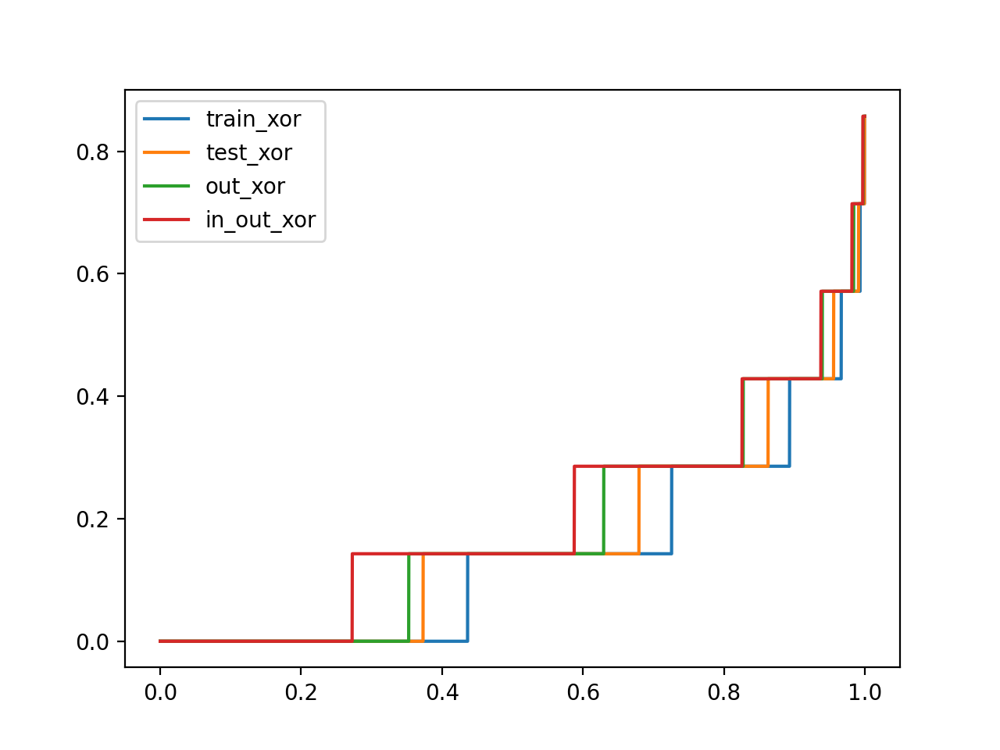

<Figure size 640x480 with 0 Axes>

In [446]:
plt.figure()
for subset in ['train_xor', 'test_xor', 'out_xor', 'in_out_xor']:
    n_samples = len(results_[model][subset])
    plt.plot(np.arange(n_samples)/n_samples, sorted(results_[model][subset]), label=subset)
plt.legend()

In [425]:
pd.DataFrame.from_dict(results_, orient='index', columns=['train_xor', 'test_xor','out_xor', 'in_out_xor'])


,train_xor,test_xor,out_xor,in_out_xor
0.1,0.222087,0.262041,0.280784,0.282781
0.1_zero,0.226679,0.265024,0.283724,0.305527
1,0.229284,0.257645,0.277042,0.287543
1.0_zero,0.218330,0.247504,0.273389,0.286139
10.0_zero,0.350781,0.376138,0.399257,0.386395
10.0,0.237757,0.259278,0.294030,0.288393
10,0.248341,0.284961,0.302465,0.326063
50.0,0.240266,0.276201,0.293347,0.302338
100.0,0.264203,0.276986,0.300802,0.296386
1000.0,0.470647,0.478305,0.516988,0.528274


In [456]:
for model in results_:
    results_[model]['train_norm'] = ood_fuser_norm(results_[model]['train'][0], results_[model]['train'][1], results_[model]['calibration'], data=False)
    
    results_[model]['test_norm'] = ood_fuser_norm(results_[model]['test'][0], results_[model]['test'][1], results_[model]['calibration'], data=False)
    
    #xor_test_res= fuser_ood_xor(results_[model]['test'][0], results_[model]['test'][1], results_[model]['calibration'], data=True)
    results_[model]['out_norm'] = ood_fuser_norm(results_[model]['out'][0], results_[model]['out'][1], results_[model]['calibration'], data=False)
    
    #xor_out_res= fuser_ood_xor(results_[model]['out'][0], results_[model]['out'][1], results_[model]['calibration'], data=True)
    results_[model]['in_out_norm'] = ood_fuser_norm(results_[model]['in_out'][0], results_[model]['in_out'][1], results_[model]['calibration'], data=False)
        

In [457]:
pd.DataFrame.from_dict(results_, orient='index', columns=['train_norm', 'test_norm','out_norm', 'in_out_norm'])


,train_norm,test_norm,out_norm,in_out_norm
0.1,0.008925,0.016703,0.015177,0.005060
0.1_zero,0.013532,0.028132,0.031809,0.015476
1,0.014971,0.025275,0.031809,0.016369
1.0_zero,0.009405,0.013846,0.016632,0.004464
10.0_zero,0.035605,0.053407,0.088565,0.048214
10.0,0.019674,0.025055,0.028067,0.011905
10,0.018522,0.017143,0.018919,0.006548
50.0,0.018522,0.026154,0.035135,0.019940
100.0,0.019290,0.027912,0.025988,0.007738
1000.0,0.081670,0.123297,0.164449,0.095238


In [303]:
# average_precision_score, coverage_error, label_ranking_average_precision_score, label_ranking_loss, roc_auc_score
func = partial(roc_auc_score, average='weighted')
for model in short_list:
    tot_theta = [np.concatenate([results_[model]['test'][0][i], results_[model]['out'][0][i]]) for i in range(2)]
    tot_labels = np.concatenate([results_[model]['test'][1], results_[model]['out'][1][:,:7]])
    results_[model]['test_auc'] = mean_theta_score(results_[model]['test'][0], results_[model]['test'][1], metric=func)
    results_[model]['out_auc'] = mean_theta_score(results_[model]['out'][0], results_[model]['out'][1], metric=func, rev=False)
    results_[model]['in_out_auc'] = mean_theta_score(results_[model]['in_out'][0], results_[model]['in_out'][1], metric=func, rev=False)
    results_[model]['out_test_auc'] = mean_theta_score(tot_theta, tot_labels, metric=func)
    results_[model]['ood_detec'] = ood_detec_per_cond(results_[model]['out'], results_[model]['calibration'])
    

<IPython.core.display.Javascript object>


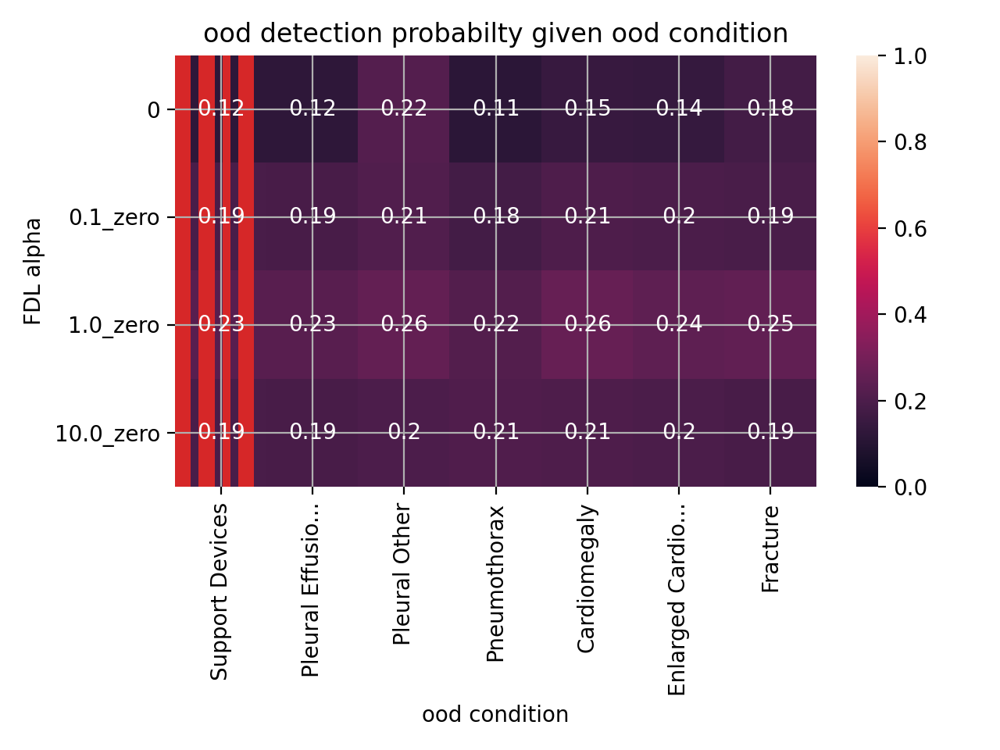

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, 'ood detection probabilty given ood condition')

[Text(0, 0.5, '0'),
 Text(0, 1.5, '0.1_zero'),
 Text(0, 2.5, '1.0_zero'),
 Text(0, 3.5, '10.0_zero')]

Text(0.5, 23.52222222222222, 'ood condition')

Text(50.722222222222214, 0.5, 'FDL alpha')

In [383]:
ood_table = []
zero_list = ['0']+[x for x in results_ if 'zero' in x]
for model in zero_list:
    ood_table.append(ood_detec_per_cond(results_[model]['out'], results_[model]['calibration'], mean=False))
ood_table = pd.DataFrame(ood_table, columns=[x[:15]+('...' if len(x)>15 else '') for x in out_out.dataset.label_names[7:]], index=zero_list)   
plt.figure()
f = sns.heatmap(ood_table, vmin=0, vmax=1, annot=True)
plt.title('ood detection probabilty given ood condition')
f.yaxis.set_ticklabels(f.yaxis.get_ticklabels(), rotation=0)
plt.xlabel('ood condition')
plt.ylabel('FDL alpha')
plt.tight_layout()

<IPython.core.display.Javascript object>


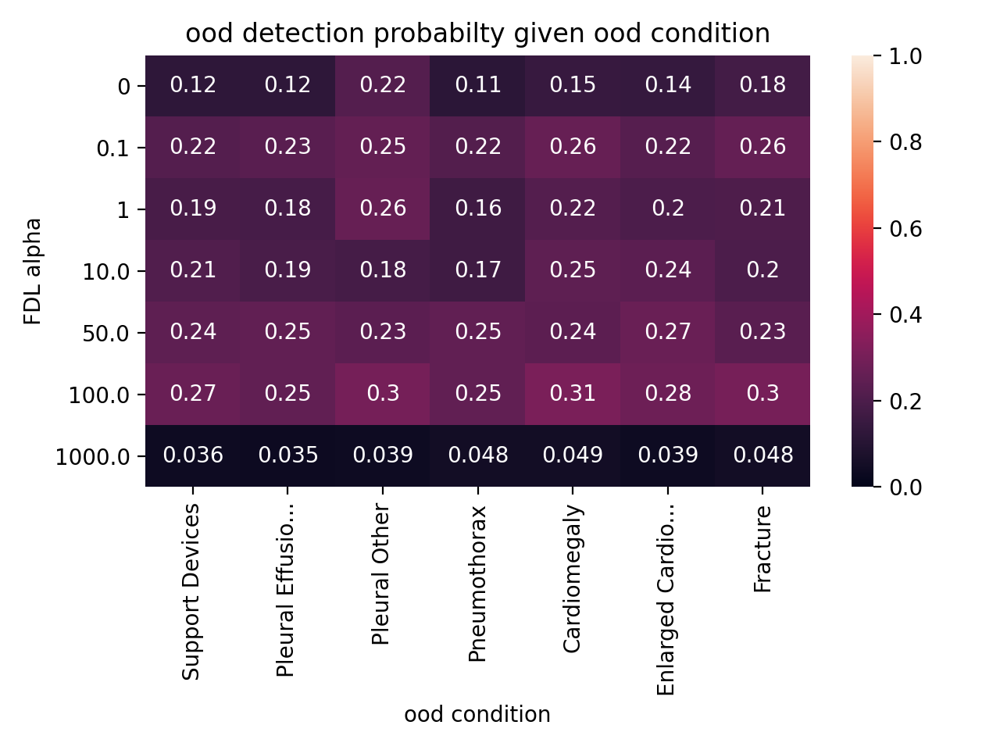

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, 'ood detection probabilty given ood condition')

[Text(0, 0.5, '0'),
 Text(0, 1.5, '0.1'),
 Text(0, 2.5, '1'),
 Text(0, 3.5, '10.0'),
 Text(0, 4.5, '50.0'),
 Text(0, 5.5, '100.0'),
 Text(0, 6.5, '1000.0')]

Text(0.5, 23.52222222222222, 'ood condition')

Text(50.722222222222214, 0.5, 'FDL alpha')

In [299]:
ood_table = []
short_list = ['0', '0.1', '1', '10.0', '50.0', '100.0', '1000.0']
for model in short_list:
    ood_table.append(ood_detec_per_cond(results_[model]['out'], results_[model]['calibration'], mean=False))
ood_table = pd.DataFrame(ood_table, columns=[x[:15]+('...' if len(x)>15 else '') for x in out_out.dataset.label_names[7:]], index=short_list)   
plt.figure()
f = sns.heatmap(ood_table, vmin=0, vmax=1, annot=True)
plt.title('ood detection probabilty given ood condition')
f.yaxis.set_ticklabels(f.yaxis.get_ticklabels(), rotation=0)
plt.xlabel('ood condition')
plt.ylabel('FDL alpha')
plt.tight_layout()

<IPython.core.display.Javascript object>


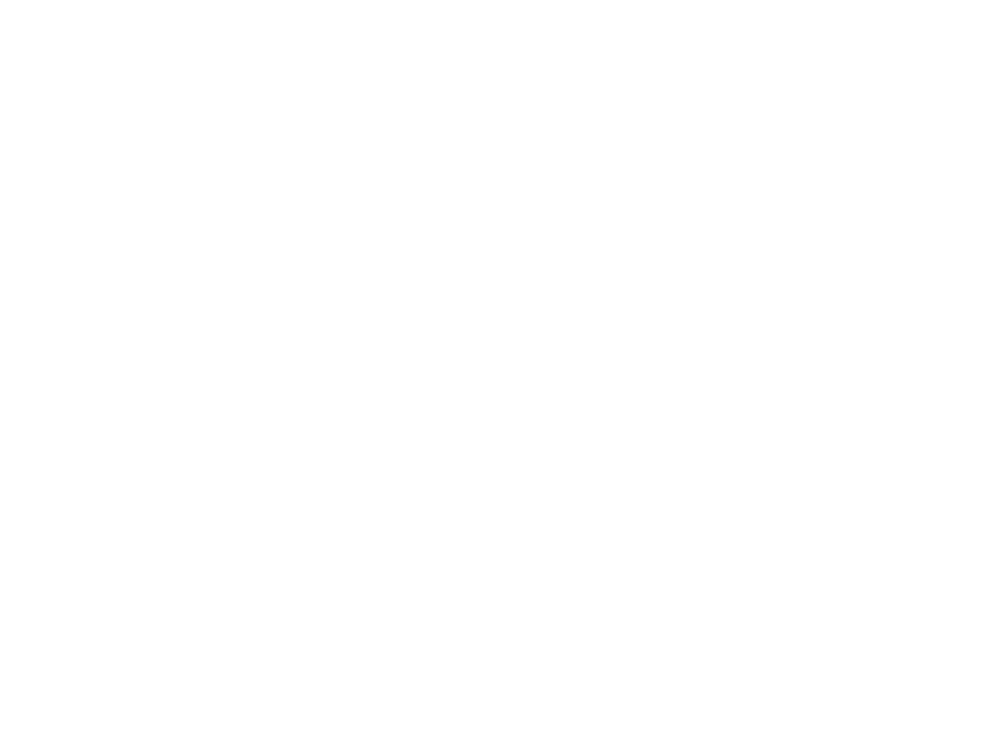

<Figure size 640x480 with 0 Axes>

<IPython.core.display.Javascript object>


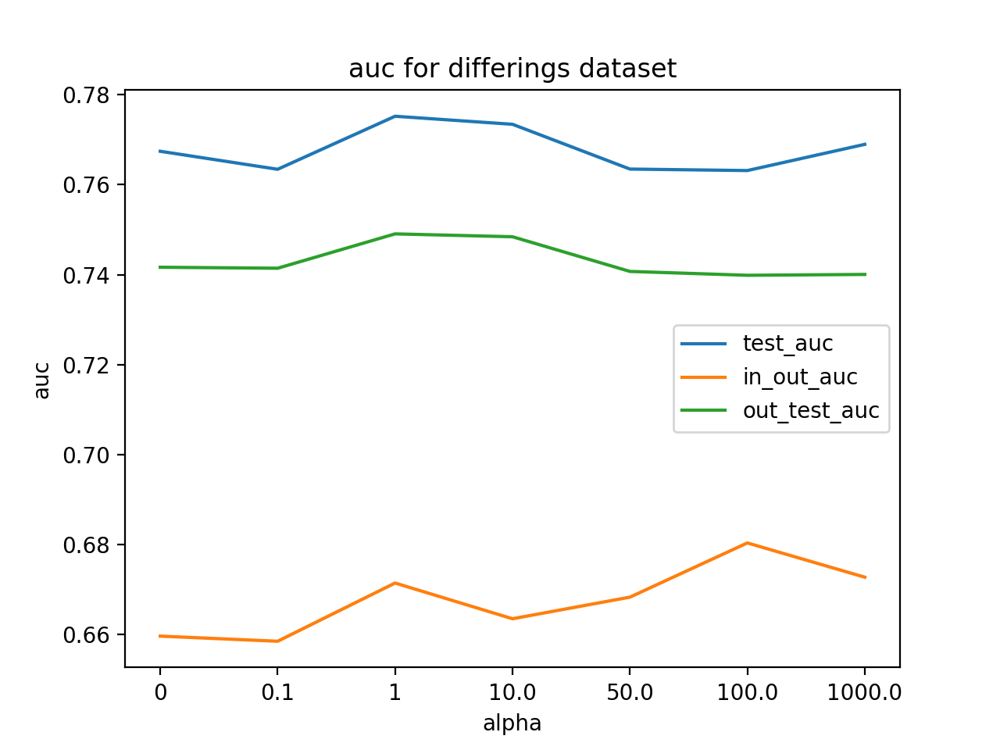

Text(0.5, 1.0, 'auc for differings dataset')

Text(0.5, 0, 'alpha')

Text(0, 0.5, 'auc')

In [378]:
plt.figure()
pd.DataFrame.from_dict(results_, orient='index', columns=['test_auc','in_out_auc','out_test_auc']).loc[short_list].plot()
plt.title('auc for differings dataset')
plt.xlabel('alpha')
plt.ylabel('auc')

In [83]:
table = "0	0.1	1	10	50	100	1000	10000 \n 0.1336798337	0.2	0.1866943867	0.2141372141	0.2361746362	0.2222453222	0.1024948025	0.04823284823 \n 0.06666666667	0.1023809524	0.07886904762	0.09553571429	0.1241071429	0.1154761905	0.04375	0.01785714286"

In [88]:
import pandas as pd
from io import StringIO
pd.read_csv(StringIO(table), sep='\t')

,0,0.1,1,10,50,100,1000,10000
0,0.133680,0.200000,0.186694,0.214137,0.236175,0.222245,0.102495,0.048233
1,0.066667,0.102381,0.078869,0.095536,0.124107,0.115476,0.043750,0.017857


### what images are lost due to FDL

In [374]:
basic_res = ood_detec_per_cond(results_['0']['test'], results_['0']['calibration'], data=True)
fdl_res = ood_detec_per_cond(results_['100.0']['test'], results_['100.0']['calibration'], data=True)
args = np.argwhere(basic_res > fdl_res)
new_rec = results_['0']['test'][-1][args.T[0]].tolist()
new_rec_labels_ = results_['0']['test'][1][args.T[0]]

['Atelectasis']


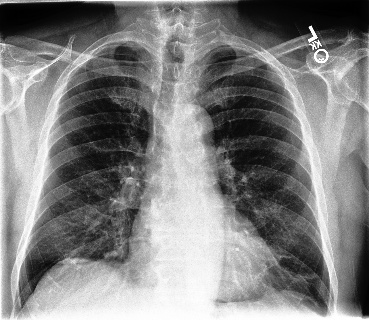

['Lung Opacity']


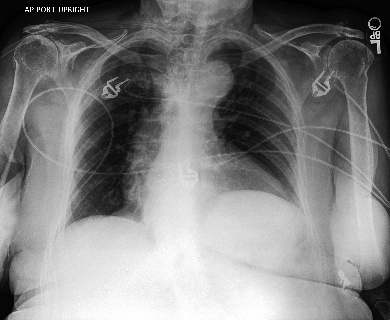

['Lung Opacity' 'Consolidation']


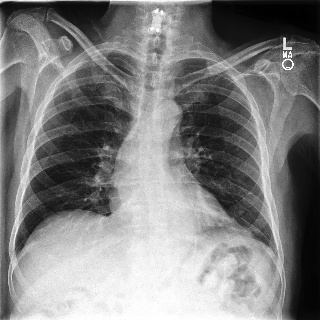

['Edema']


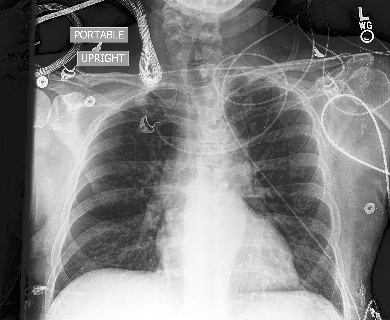

['No Finding']


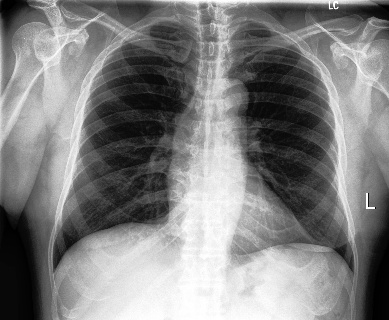

In [375]:
for i in np.random.randint(0, len(new_rec), 5):
    im_path = new_rec[i]
    cond = new_rec_labels_[i]
    print(test.dataset.label_names[np.argwhere(cond).T[0].tolist()])
    Image.open(im_path)

### mahalanomis confidance

In [ ]:
from scipy.spatial.distance import pdist, squareform, mahalanobis

In [462]:
ground_group = 'test'
thresh = 95
count_thresh = 0

In [481]:
pos_cov_mat_per_class = [np.cov(results[model][ground_group][0][0][results[model][ground_group][1][:, i]==1].T) for i in range(7)]
neg_cov_mat_per_class = [np.cov(results[model][ground_group][0][0][results[model][ground_group][1][:, i]==0].T) for i in range(7)]
pos_class_means = [results[model][ground_group][0][0][results[model][ground_group][1][:, i]==1].mean(0) for i in range(7)]
neg_class_means = [results[model][ground_group][0][0][results[model][ground_group][1][:, i]==0].mean(0) for i in range(7)]
pos_matric_family = [(partial(mahalanobis, v=pos_class_means[i], VI=pos_cov_mat_per_class[i])) for i in range(7)]
neg_matric_family = [(partial(mahalanobis, v=neg_class_means[i], VI=pos_cov_mat_per_class[i])) for i in range(7)]

In [482]:
mod = 0
curr_a = [np.apply_along_axis(pos_matric_family[i], 1, results[model][ground_group][0][mod][results[model][ground_group][1][:, i]==1]) for i in range(7)]
pos_a_precentail = np.array([np.percentile(x, thresh) for x in curr_a])
curr_a = [np.apply_along_axis(neg_matric_family[i], 1, results[model][ground_group][0][mod][results[model][ground_group][1][:, i]==0]) for i in range(7)]
neg_a_precentail = np.array([np.percentile(x, thresh) for x in curr_a])

curr_a_pos = np.stack([np.apply_along_axis(pos_matric_family[i], 1, results[model]['test'][0][mod]) for i in range(7)])
curr_a_neg = np.stack([np.apply_along_axis(neg_matric_family[i], 1, results[model]['test'][0][mod]) for i in range(7)])

a_conf = np.maximum(curr_a_pos, curr_a_neg)

curr_b_pos = np.stack([np.apply_along_axis(pos_matric_family[i], 1, results[model]['out'][0][mod]) for i in range(7)])
curr_b_neg = np.stack([np.apply_along_axis(neg_matric_family[i], 1, results[model]['out'][0][mod]) for i in range(7)])

b_conf = np.maximum(curr_b_pos, curr_b_neg)


out_detect_b_pos = (curr_b_pos.T > pos_a_precentail.T).sum(1) > count_thresh
out_detect_a_pos = (curr_a_pos.T > pos_a_precentail.T).sum(1) > count_thresh
out_detect_b_neg = (curr_b_neg.T > neg_a_precentail.T).sum(1) > count_thresh
out_detect_a_neg = (curr_a_neg.T > neg_a_precentail.T).sum(1) > count_thresh

print(((out_detect_b_pos & (out_detect_b_neg)).mean()))
print(((out_detect_a_pos & (out_detect_a_neg)).mean()))

1.0
1.0


In [483]:
a_conf.mean(1), b_conf.mean(1)

(array([0.27987994, 0.21285419, 0.2499002 , 0.22727838, 0.23043789,
        0.22712389, 0.25274275]),
 array([0.25316702, 0.1995282 , 0.23253121, 0.21867922, 0.2247041 ,
        0.21979055, 0.24641577]))

In [484]:
mod = 1
curr_a = [np.apply_along_axis(pos_matric_family[i], 1, results[model][ground_group][0][mod][results[model][ground_group][1][:, i]==1]) for i in range(7)]
pos_a_precentail = np.array([np.percentile(x, thresh) for x in curr_a])
curr_a = [np.apply_along_axis(neg_matric_family[i], 1, results[model][ground_group][0][mod][results[model][ground_group][1][:, i]==0]) for i in range(7)]
neg_a_precentail = np.array([np.percentile(x, thresh) for x in curr_a])

curr_a_pos = np.stack([np.apply_along_axis(pos_matric_family[i], 1, results[model]['test'][0][mod]) for i in range(7)])
curr_a_neg = np.stack([np.apply_along_axis(neg_matric_family[i], 1, results[model]['test'][0][mod]) for i in range(7)])

a_conf = np.maximum(curr_a_pos, curr_a_neg)

curr_b_pos = np.stack([np.apply_along_axis(pos_matric_family[i], 1, results[model]['out'][0][mod]) for i in range(7)])
curr_b_neg = np.stack([np.apply_along_axis(neg_matric_family[i], 1, results[model]['out'][0][mod]) for i in range(7)])

b_conf = np.maximum(curr_b_pos, curr_b_neg)


out_detect_b_pos = (curr_b_pos.T > pos_a_precentail.T).sum(1) > count_thresh
out_detect_a_pos = (curr_a_pos.T > pos_a_precentail.T).sum(1) > count_thresh
out_detect_b_neg = (curr_b_neg.T > neg_a_precentail.T).sum(1) > count_thresh
out_detect_a_neg = (curr_a_neg.T > neg_a_precentail.T).sum(1) > count_thresh

print(((out_detect_b_pos & (out_detect_b_neg)).mean()))
print(((out_detect_a_pos & (out_detect_a_neg)).mean()))

1.0
1.0


In [485]:
a_conf.mean(1), b_conf.mean(1)

(array([0.20150944, 0.08416538, 0.13279974, 0.1368843 , 0.1542921 ,
        0.13420609, 0.159109  ]),
 array([0.19514387, 0.07899188, 0.12610801, 0.1346948 , 0.15118574,
        0.13235532, 0.15592604]))

In [487]:
ground_group = 'test'
thresh = 10

In [488]:
pos_cov_mat_per_class = [np.cov(results[model][ground_group][0][1][results[model][ground_group][1][:, i]==1].T) for i in range(7)]
neg_cov_mat_per_class = [np.cov(results[model][ground_group][0][1][results[model][ground_group][1][:, i]==0].T) for i in range(7)]
pos_class_means = [results[model][ground_group][0][1][results[model][ground_group][1][:, i]==1].mean(0) for i in range(7)]
neg_class_means = [results[model][ground_group][0][1][results[model][ground_group][1][:, i]==0].mean(0) for i in range(7)]
pos_matric_family = [(partial(mahalanobis, v=pos_class_means[i], VI=pos_cov_mat_per_class[i])) for i in range(7)]
neg_matric_family = [(partial(mahalanobis, v=neg_class_means[i], VI=pos_cov_mat_per_class[i])) for i in range(7)]

In [489]:
mod = 0
curr_a = [np.apply_along_axis(pos_matric_family[i], 1, results[model][ground_group][0][mod][results[model][ground_group][1][:, i]==1]) for i in range(7)]
pos_a_precentail = np.array([np.percentile(x, thresh) for x in curr_a])
curr_a = [np.apply_along_axis(neg_matric_family[i], 1, results[model][ground_group][0][mod][results[model][ground_group][1][:, i]==0]) for i in range(7)]
neg_a_precentail = np.array([np.percentile(x, thresh) for x in curr_a])

curr_a_pos = np.stack([np.apply_along_axis(pos_matric_family[i], 1, results[model]['test'][0][mod]) for i in range(7)])
curr_a_neg = np.stack([np.apply_along_axis(neg_matric_family[i], 1, results[model]['test'][0][mod]) for i in range(7)])

a_conf = np.maximum(curr_a_pos, curr_a_neg)

curr_b_pos = np.stack([np.apply_along_axis(pos_matric_family[i], 1, results[model]['out'][0][mod]) for i in range(7)])
curr_b_neg = np.stack([np.apply_along_axis(neg_matric_family[i], 1, results[model]['out'][0][mod]) for i in range(7)])

b_conf = np.maximum(curr_b_pos, curr_b_neg)


out_detect_b_pos = (curr_b_pos.T > pos_a_precentail.T).sum(1) > count_thresh
out_detect_a_pos = (curr_a_pos.T > pos_a_precentail.T).sum(1) > count_thresh
out_detect_b_neg = (curr_b_neg.T > neg_a_precentail.T).sum(1) > count_thresh
out_detect_a_neg = (curr_a_neg.T > neg_a_precentail.T).sum(1) > count_thresh

print(((out_detect_b_pos & (out_detect_b_neg)).mean()))
print(((out_detect_a_pos & (out_detect_a_neg)).mean()))

0.9656964656964657
0.9582417582417583


In [490]:
a_conf.mean(1), b_conf.mean(1)

(array([0.04485557, 0.050791  , 0.06444765, 0.07507592, 0.06534123,
        0.07377185, 0.05287787]),
 array([0.04192821, 0.04663029, 0.06009813, 0.07159139, 0.06158745,
        0.07008011, 0.04925441]))

In [491]:
mod = 1
curr_a = [np.apply_along_axis(pos_matric_family[i], 1, results[model][ground_group][0][mod][results[model][ground_group][1][:, i]==1]) for i in range(7)]
pos_a_precentail = np.array([np.percentile(x, thresh) for x in curr_a])
curr_a = [np.apply_along_axis(neg_matric_family[i], 1, results[model][ground_group][0][mod][results[model][ground_group][1][:, i]==0]) for i in range(7)]
neg_a_precentail = np.array([np.percentile(x, thresh) for x in curr_a])

curr_a_pos = np.stack([np.apply_along_axis(pos_matric_family[i], 1, results[model]['test'][0][mod]) for i in range(7)])
curr_a_neg = np.stack([np.apply_along_axis(neg_matric_family[i], 1, results[model]['test'][0][mod]) for i in range(7)])

a_conf = np.maximum(curr_a_pos, curr_a_neg)

curr_b_pos = np.stack([np.apply_along_axis(pos_matric_family[i], 1, results[model]['out'][0][mod]) for i in range(7)])
curr_b_neg = np.stack([np.apply_along_axis(neg_matric_family[i], 1, results[model]['out'][0][mod]) for i in range(7)])

b_conf = np.maximum(curr_b_pos, curr_b_neg)


out_detect_b_pos = (curr_b_pos.T > pos_a_precentail.T).sum(1) > count_thresh
out_detect_a_pos = (curr_a_pos.T > pos_a_precentail.T).sum(1) > count_thresh
out_detect_b_neg = (curr_b_neg.T > neg_a_precentail.T).sum(1) > count_thresh
out_detect_a_neg = (curr_a_neg.T > neg_a_precentail.T).sum(1) > count_thresh

print(((out_detect_b_pos & (out_detect_b_neg)).mean()))
print(((out_detect_a_pos & (out_detect_a_neg)).mean()))

1.0
1.0


### FDL CKA

work_space/save/CheXpert/FDL/2020-06-21_14:41_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=0.1


<IPython.core.display.Javascript object>


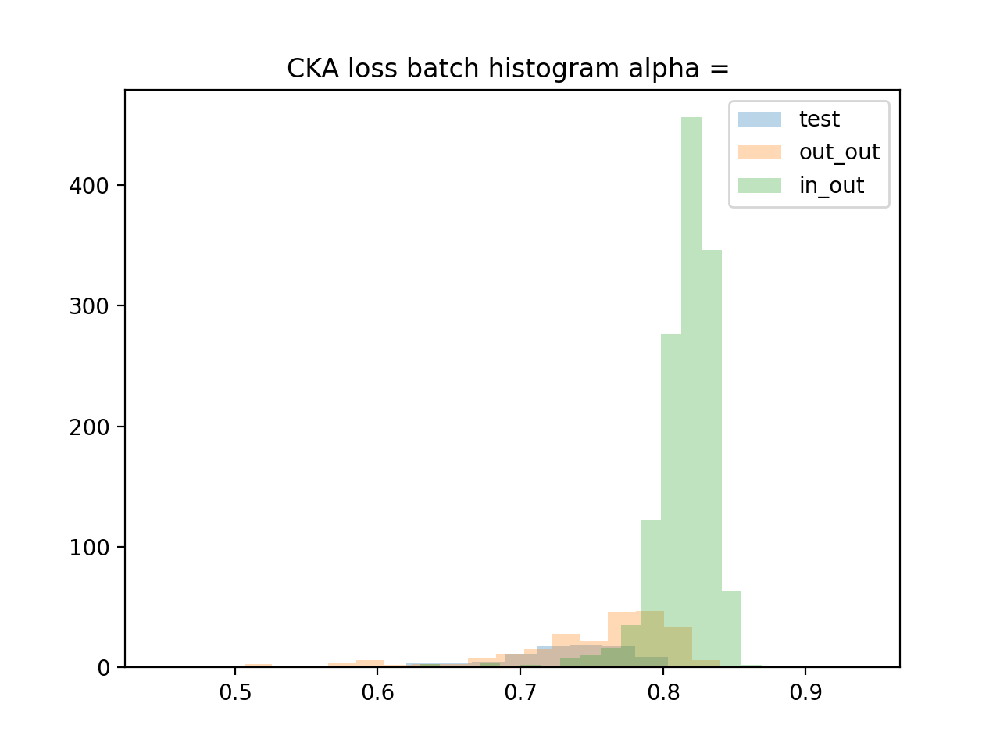

out_reject 0.17842323651452283
in_out_reject 0.8743494423791821
work_space/save/CheXpert/FDL/2020-06-21_14:40_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=1


<IPython.core.display.Javascript object>


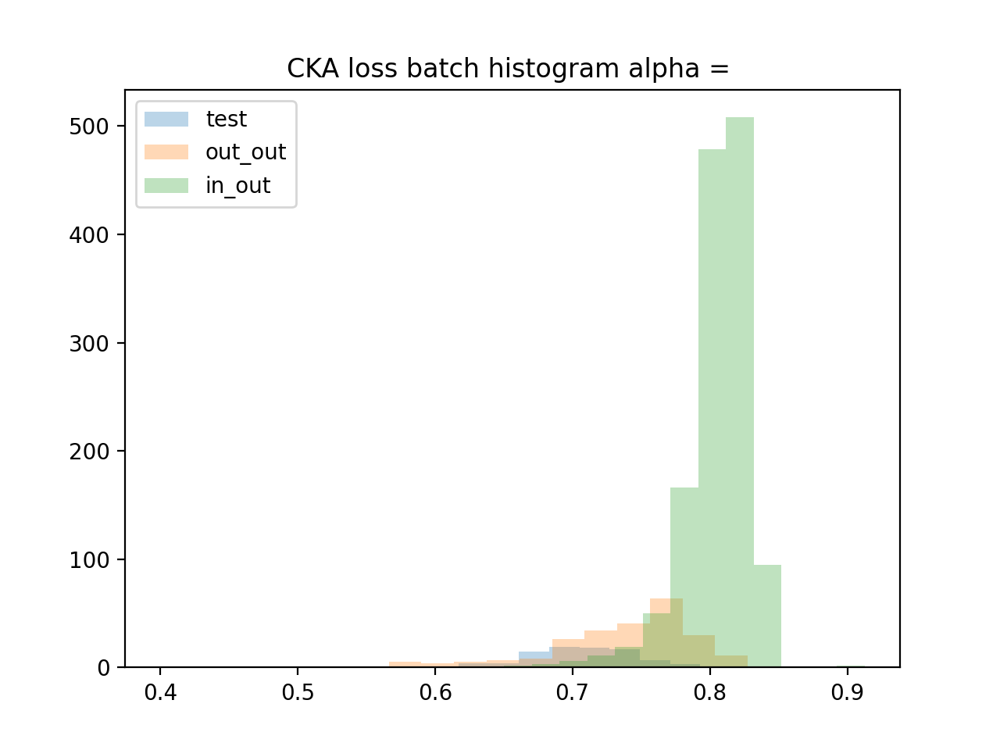

out_reject 0.3817427385892116
in_out_reject 0.9576208178438662
work_space/save/CheXpert/FDL/2020-06-22_08:04_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0


<IPython.core.display.Javascript object>


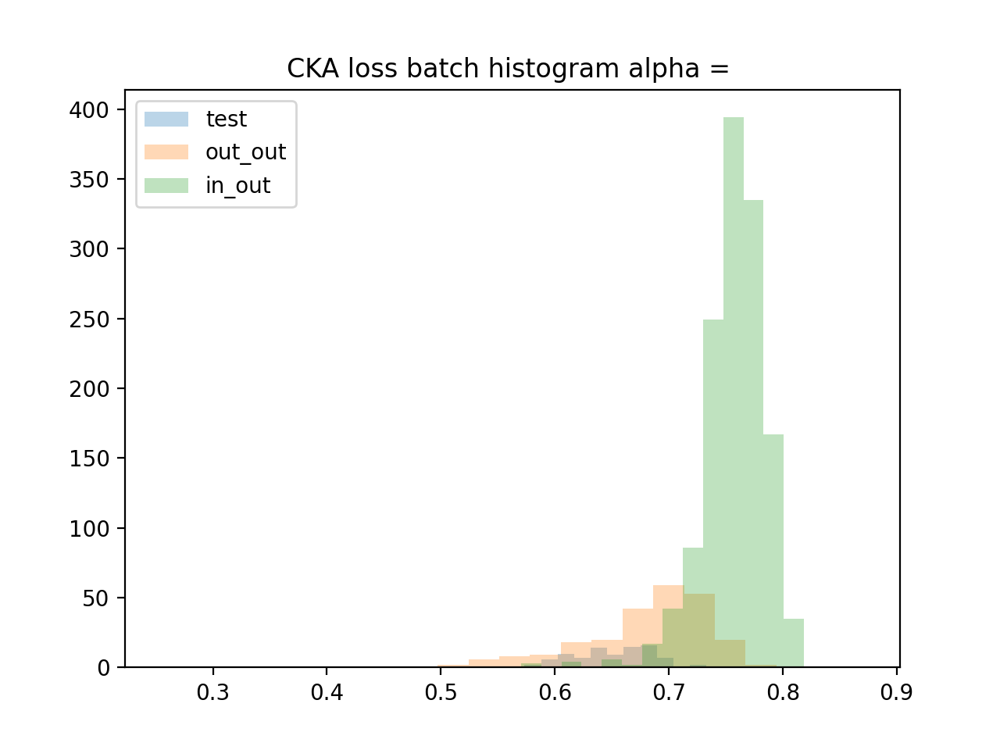

out_reject 0.43983402489626555
in_out_reject 0.966542750929368
work_space/save/CheXpert/FDL/2020-06-14_13:18_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10


<IPython.core.display.Javascript object>


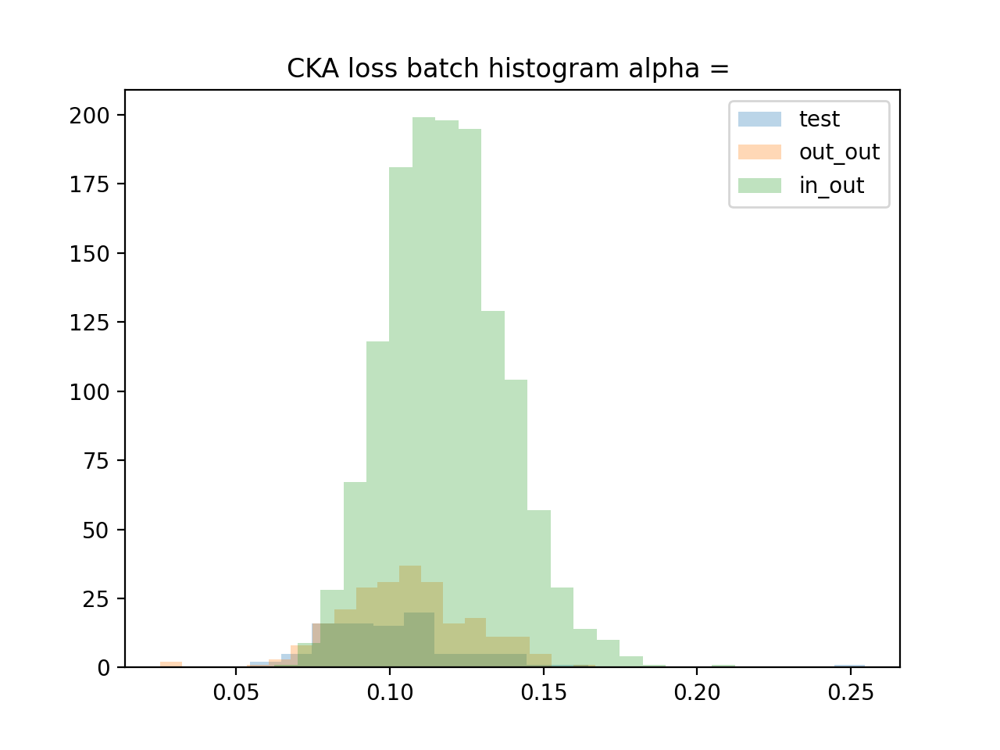

out_reject 0.07053941908713693
in_out_reject 0.15018587360594796
work_space/save/CheXpert/FDL/2020-06-21_19:10_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=50.0


<IPython.core.display.Javascript object>


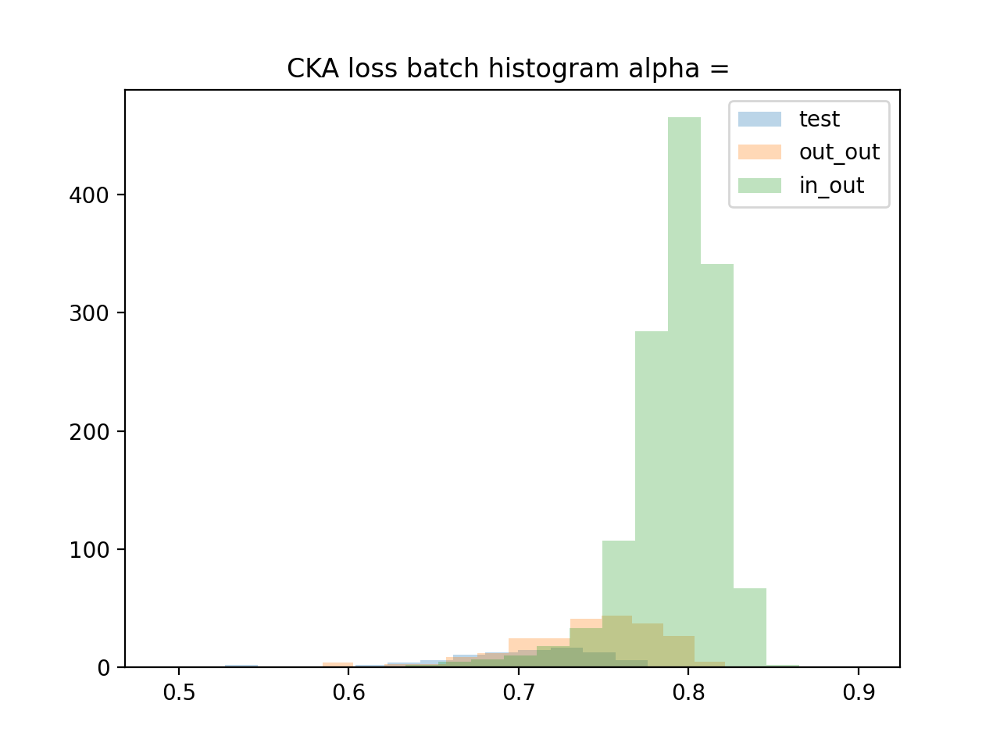

out_reject 0.3775933609958506
in_out_reject 0.9137546468401487
work_space/save/CheXpert/FDL/2020-06-22_08:05_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=100.0


<IPython.core.display.Javascript object>


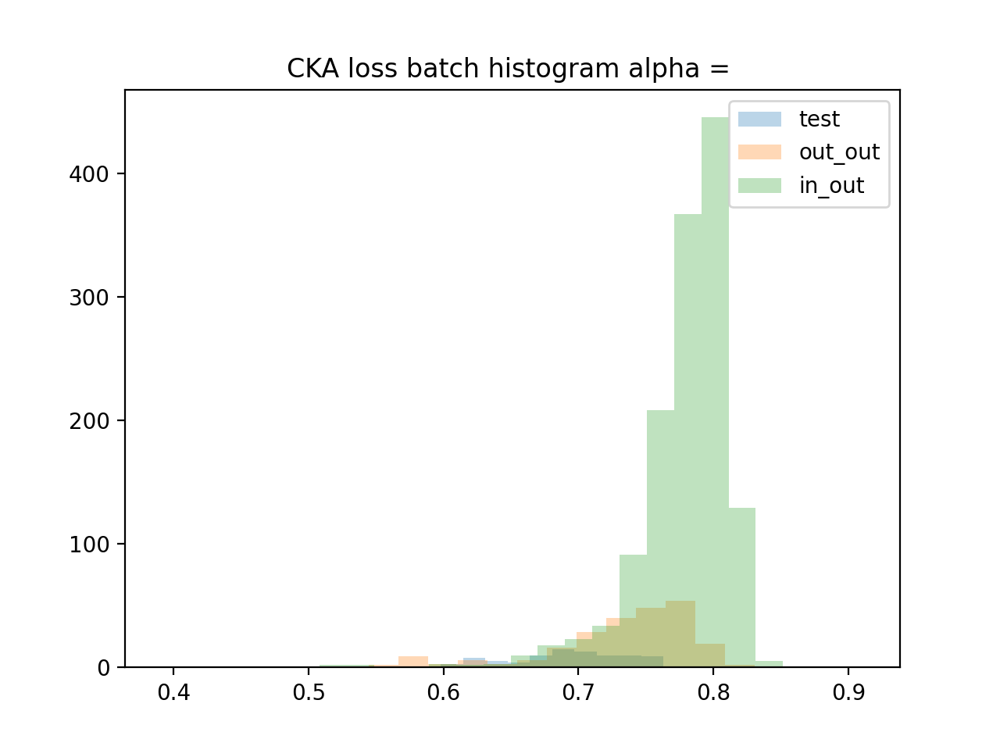

out_reject 0.4107883817427386
in_out_reject 0.8304832713754647
work_space/save/CheXpert/FDL/2020-06-22_16:11_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=1000.0


<IPython.core.display.Javascript object>


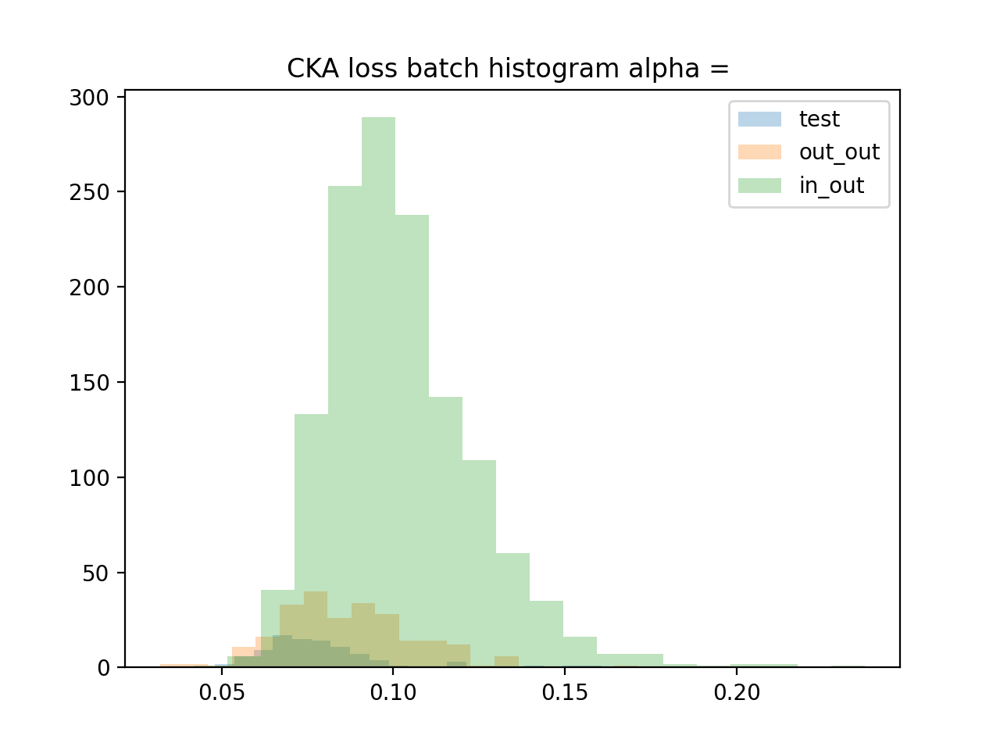

out_reject 0.07883817427385892
in_out_reject 0.2245353159851301
work_space/save/CheXpert/FDL/2020-06-22_16:12_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10000.0


<IPython.core.display.Javascript object>


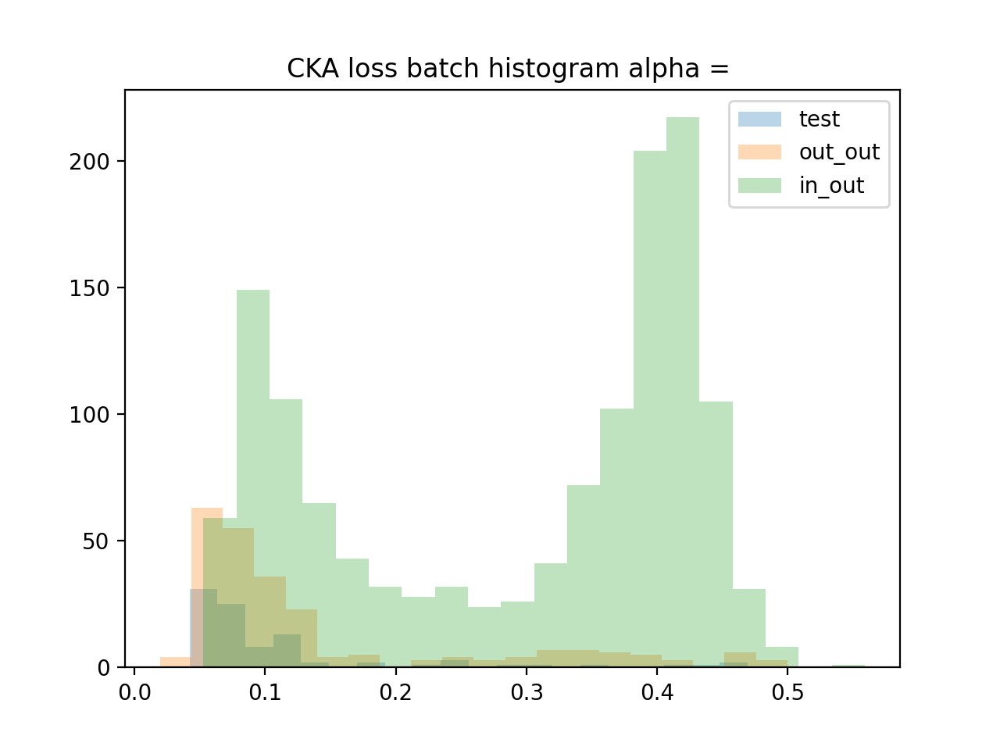

out_reject 0.12033195020746888
in_out_reject 0.5412639405204461


In [41]:
for model in fdl_results:
    print(model)
    plot_cka_scores(fdl_results[model], layer='emb', upper=True)

work_space/save/CheXpert/FDL/2020-06-21_14:41_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=0.1


<IPython.core.display.Javascript object>


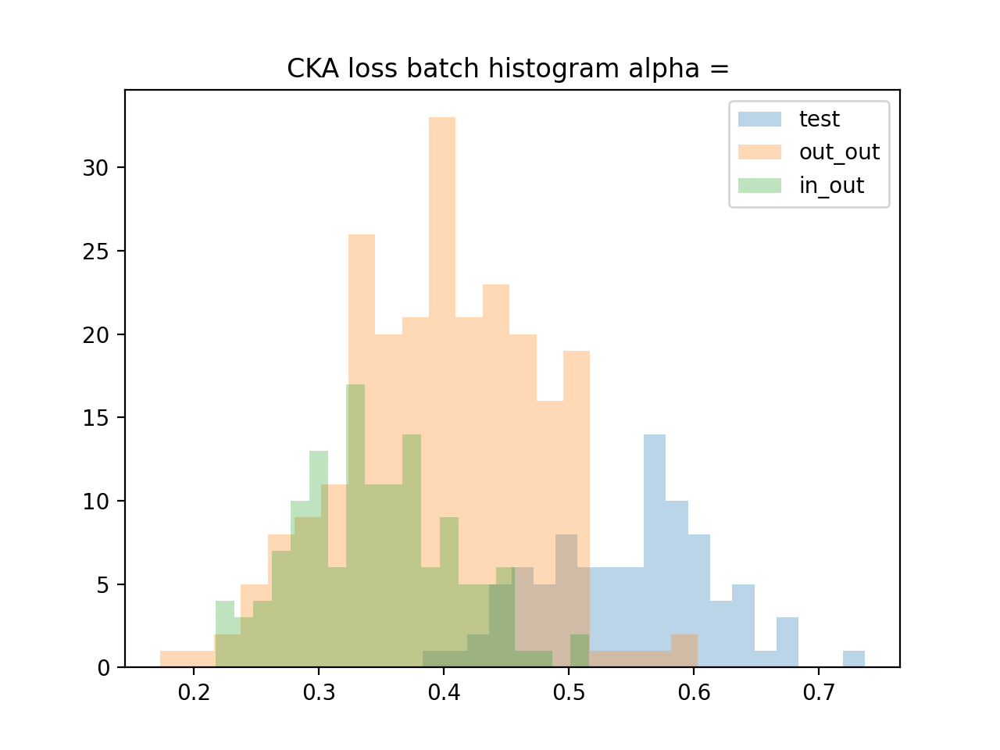

out_reject 0.7095435684647303
in_out_reject 0.9259259259259259
work_space/save/CheXpert/FDL/2020-06-21_14:40_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=1


<IPython.core.display.Javascript object>


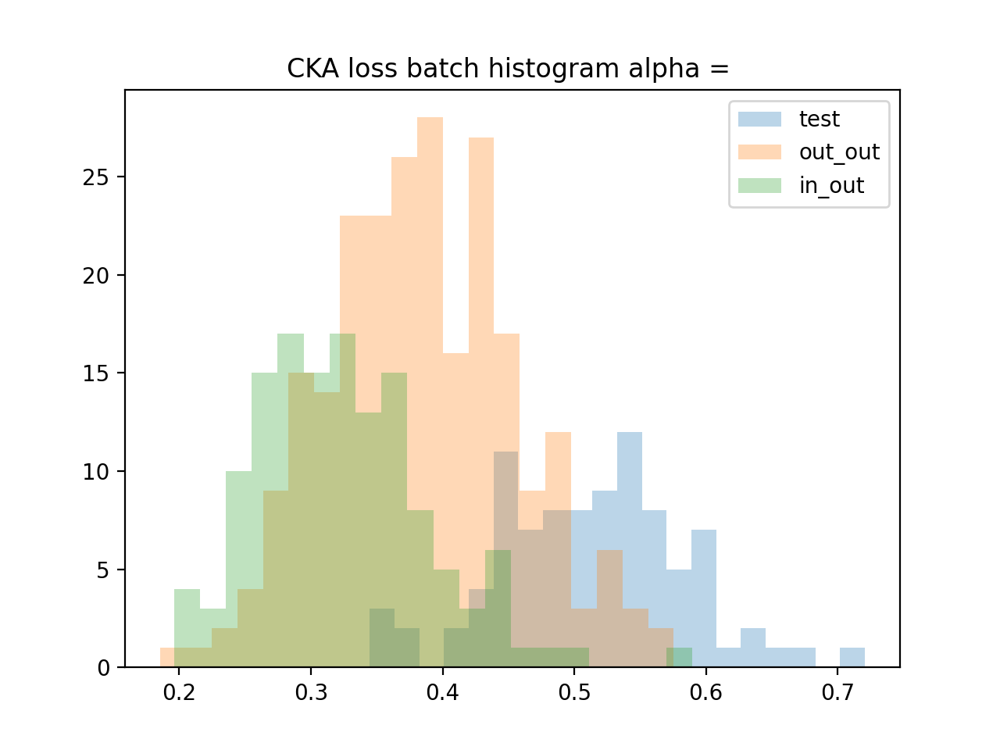

out_reject 0.5643153526970954
in_out_reject 0.8666666666666667
work_space/save/CheXpert/FDL/2020-06-22_08:04_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0


<IPython.core.display.Javascript object>


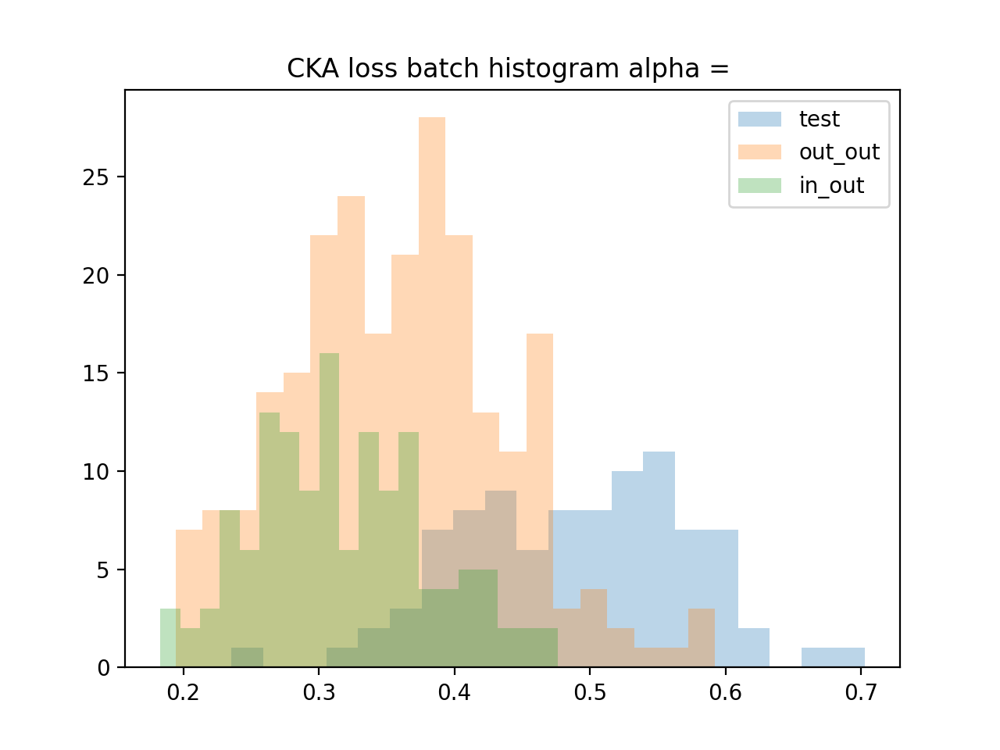

out_reject 0.5020746887966805
in_out_reject 0.7185185185185186
work_space/save/CheXpert/FDL/2020-06-14_13:18_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10


<IPython.core.display.Javascript object>


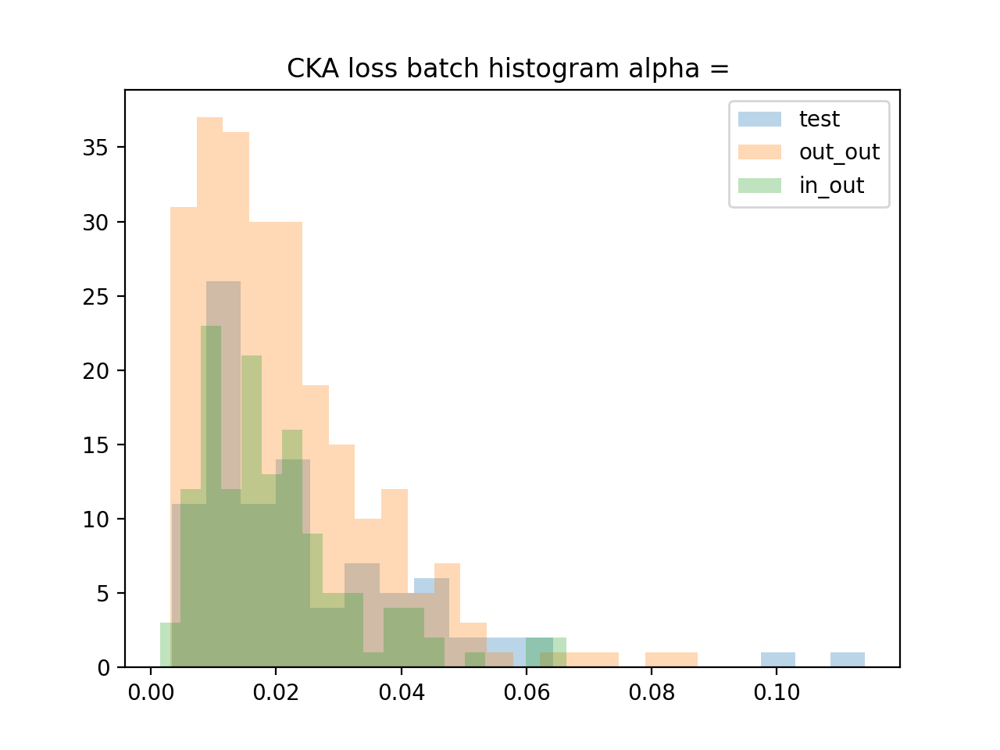

out_reject 0.08298755186721991
in_out_reject 0.044444444444444446
work_space/save/CheXpert/FDL/2020-06-21_19:10_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=50.0


<IPython.core.display.Javascript object>


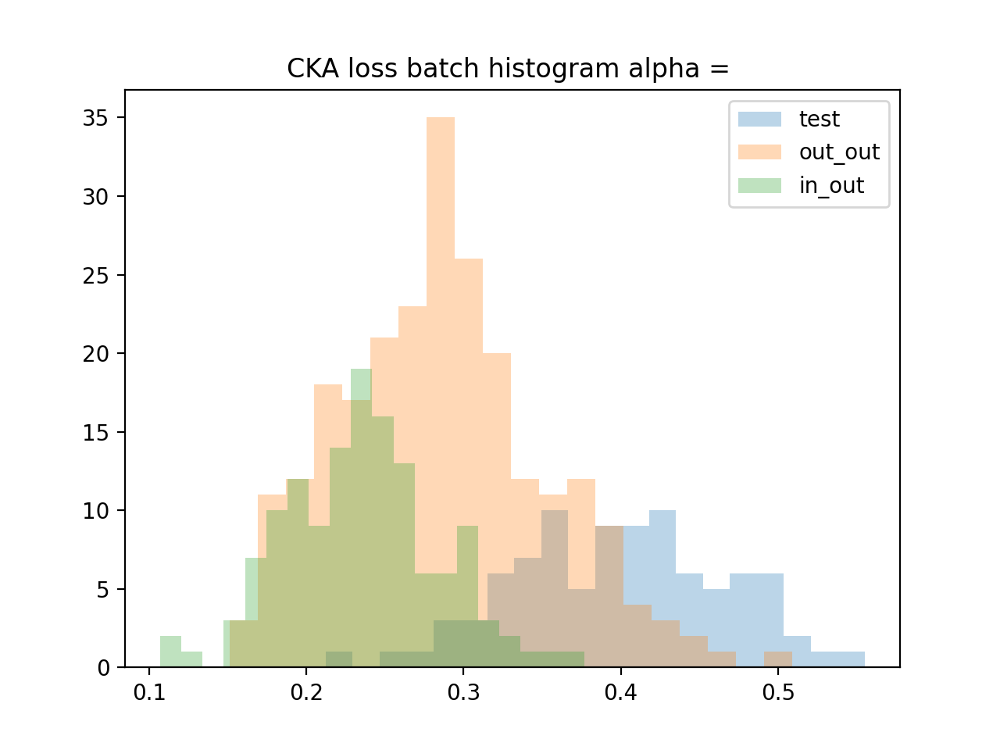

out_reject 0.45643153526970953
in_out_reject 0.8296296296296296
work_space/save/CheXpert/FDL/2020-06-22_08:05_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=100.0


<IPython.core.display.Javascript object>


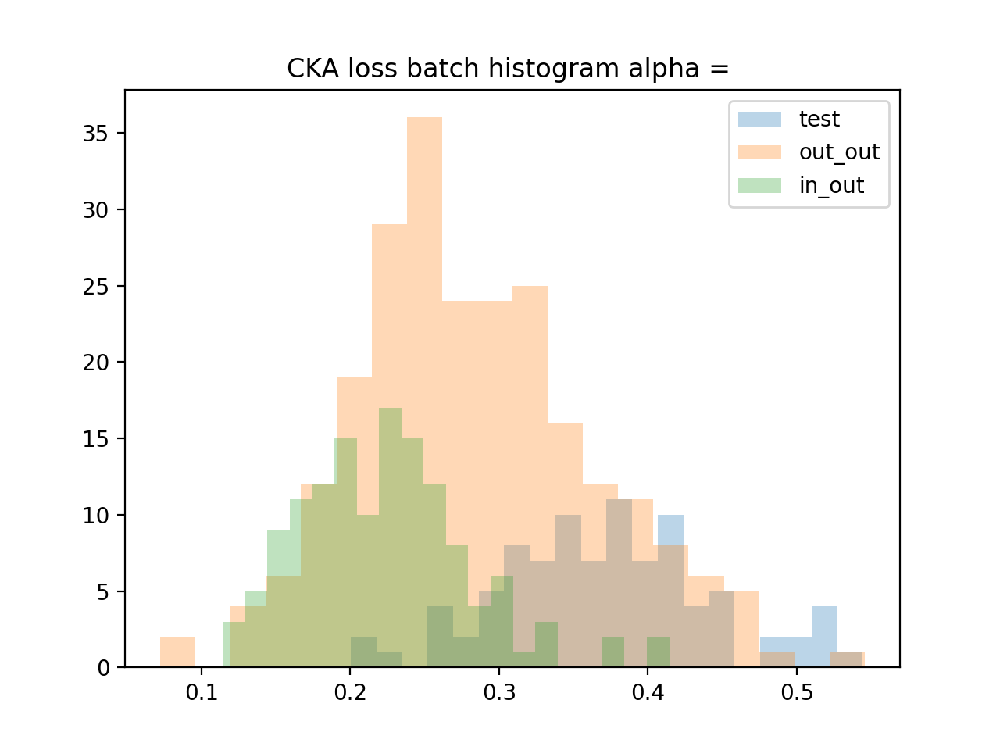

out_reject 0.43568464730290457
in_out_reject 0.7925925925925926
work_space/save/CheXpert/FDL/2020-06-22_16:11_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=1000.0


<IPython.core.display.Javascript object>


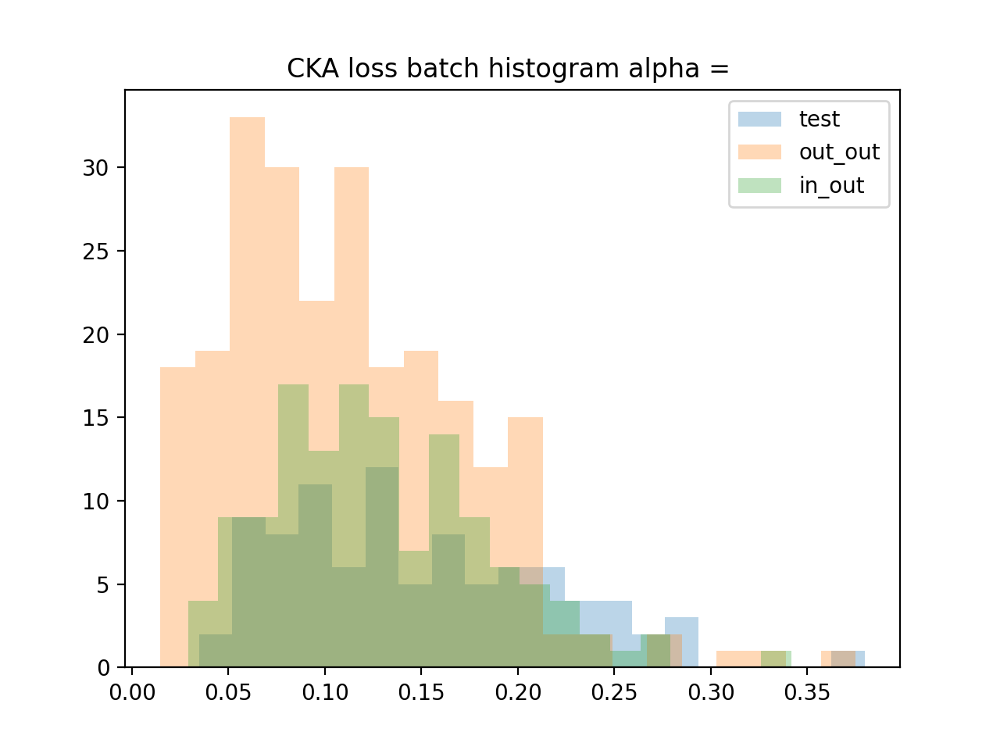

out_reject 0.21161825726141079
in_out_reject 0.08888888888888889
work_space/save/CheXpert/FDL/2020-06-22_16:12_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10000.0


<IPython.core.display.Javascript object>


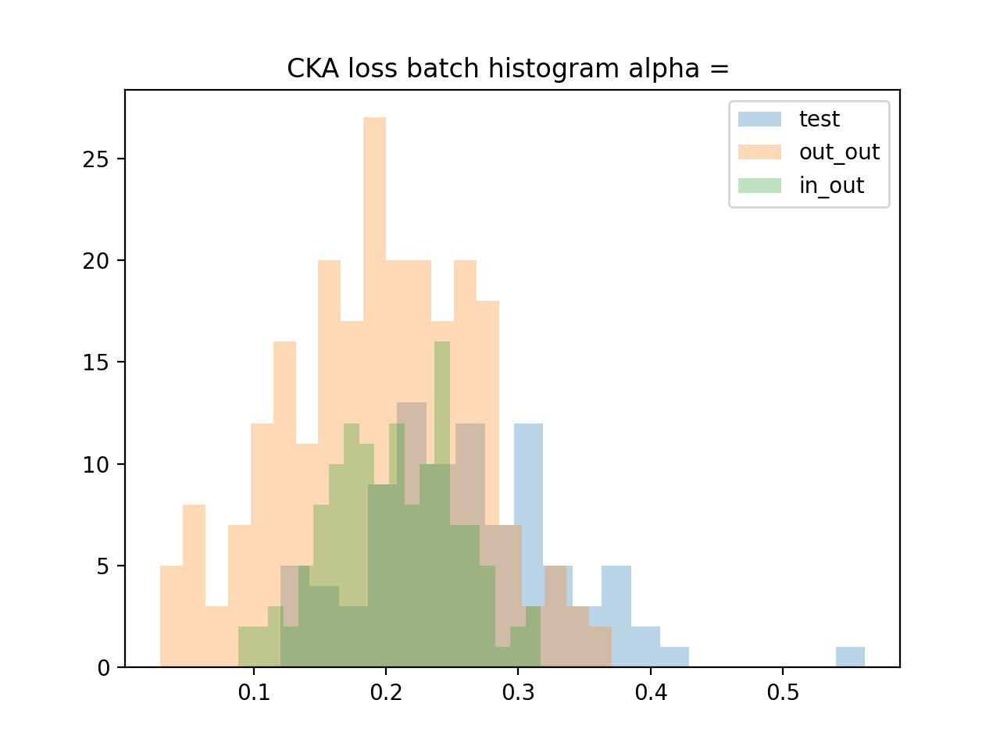

out_reject 0.23651452282157676
in_out_reject 0.08148148148148149


In [243]:
for model in fdl_results:
    print(model)
    plot_cka_scores(fdl_results[model], layer='class')

### what ood are we identifying

In [338]:
basic_res = ood_detec_per_cond(results_['0']['out'], results_['0']['calibration'], data=True)
fdl_res = ood_detec_per_cond(results_['100.0']['out'], results_['100.0']['calibration'], data=True)
args = np.argwhere(basic_res < fdl_res)
new_rec = results_['0']['out'][-1][args.T[0]].tolist()
new_rec_labels_ = results_['0']['out'][1][args.T[0]]

['Support Devices' 'Pneumothorax']


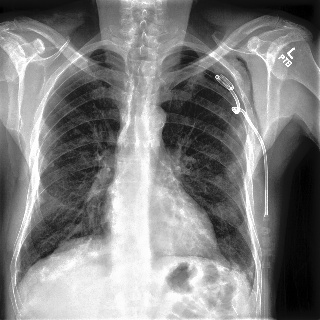

['Enlarged Cardiomediastinum']


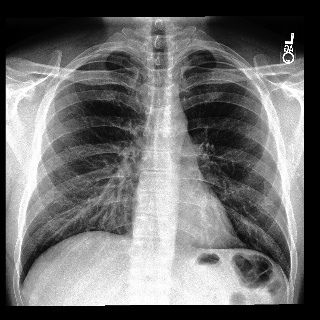

['Support Devices' 'Pneumothorax']


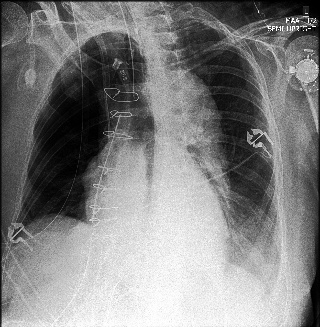

['Support Devices']


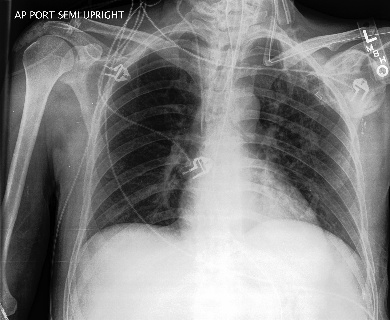

['Enlarged Cardiomediastinum' 'Fracture']


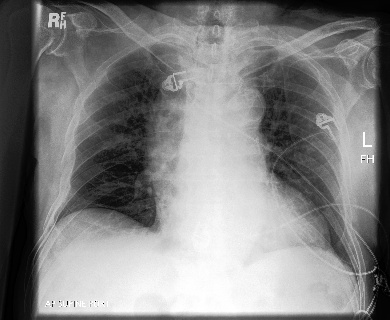

In [373]:
for i in np.random.randint(0, len(new_rec), 5):
    im_path = new_rec[i]
    cond = new_rec_labels_[i]
    print(out_out.dataset.label_names[7:][np.argwhere(cond[7:]).T[0].tolist()])
    Image.open(im_path)
    # add grad cam for 'why is this not "nothing"'

## FDL v2

In [65]:
def get_model_performance(diverse_model):
    basic_model = model_dir +'/'+"FDL/2020-06-09_09:05_n=1_densenet121_lr=0.0001_m=__55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1"
    print(diverse_model)
    basic_model_path = [os.path.join(basic_model, model_path) for model_path in  
                   os.listdir(basic_model) if 'model' in model_path]
    diverse_model_path = [os.path.join(diverse_model, model_path) for model_path in 
                     os.listdir(diverse_model) if 'model' in model_path]
    fdl_div_model = basic_model_path + diverse_model_path

    fdl_div_train = make_scores_pair(fdl_div_model, train, train=True)
    fdl_div_test_res = make_scores_pair(fdl_div_model, test, train=True)
    fdl_div_in_out_res = make_scores_pair(fdl_div_model, in_out, train=True)
    fdl_div_out_res = make_scores_pair(fdl_div_model, out_out, train=True)
    
    fdl_div_calibration = thresh_calibration(fdl_div_train[0], fdl_div_train[1])
    test_res = fuser(fdl_div_test_res[0], fdl_div_test_res[1], fdl_div_calibration)
    print(test_res)
    out_res = fuser(fdl_div_out_res[0], fdl_div_out_res[1], fdl_div_calibration)
    print(out_res)
    in_out_res = fuser(fdl_div_in_out_res[0], fdl_div_in_out_res[1], fdl_div_calibration)
    print(in_out_res)
    ood_out = fuser_ood(fdl_div_out_res[0], fdl_div_out_res[1], fdl_div_calibration)
    print(ood_out)
    ood_in = fuser_ood(fdl_div_in_out_res[0], fdl_div_in_out_res[1], fdl_div_calibration)
    print(ood_in)
    res = dict({'train':fdl_div_train, 'test':fdl_div_test_res, 'in_out':fdl_div_in_out_res, 'out':fdl_div_out_res,
                'calibration': fdl_div_calibration, 'test_res': test_res, 'in_out_res':in_out_res, 'out_res':out_res,
                'ood_out':ood_out, 'ood_in':ood_in
               })
    return res

In [240]:
zero_model_list = [model_dir+'/FDL/'+d for d in os.listdir(model_dir +'/'+"FDL") if '2020-06-30' in d or '2020-07-01' in d]

In [241]:
zero_model_list

['work_space/save/CheXpert/FDL/2020-06-30_16:30_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=1.0_morph_func=zero',
 'work_space/save/CheXpert/FDL/2020-07-01_16:15_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=1000.0_morph_func=zero',
 'work_space/save/CheXpert/FDL/2020-07-01_16:15_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=100.0_morph_func=zero',
 'work_space/save/CheXpert/FDL/2020-06-30_16:30_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0_morph_func=zero']

In [242]:
zero_results = {model:get_model_performance(model) for model in zero_model_list}

work_space/save/CheXpert/FDL/2020-06-30_16:30_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=1.0_morph_func=zero



[0.78504058 0.89800395 0.65101996 0.786576   0.76749287 0.77385392
 0.73108138]
[0.66507277 0.95051975 0.77068607 0.84698545 0.86798337 0.93908524
 0.80727651]
[0.90238095 0.93809524 0.53333333 0.68214286 0.65833333 0.81815476
 0.61339286]
0.22120582120582122
0.14732142857142858
work_space/save/CheXpert/FDL/2020-07-01_16:15_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=1000.0_morph_func=zero



[0.77166045 0.86926958 0.64860715 0.79074358 0.71835929 0.74402281
 0.72011406]
[0.70686071 0.9037422  0.72037422 0.81808732 0.71226611 0.86444906
 0.74261954]
[0.92678571 0.92946429 0.56547619 0.68839286 0.52619048 0.69970238
 0.60982143]
0.18607068607068608
0.06964285714285715
work_space/save/CheXpert/FDL/2020-07-01_16:15_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=100.0_morph_func=zero



[0.78833077 0.88966879 0.64487826 0.77100241 0.74840974 0.77648607
 0.72208818]
[0.71455301 0.94074844 0.75301455 0.85363825 0.85301455 0.90540541
 0.83056133]
[0.91815476 0.93005952 0.5639881  0.67946429 0.66696429 0.75029762
 0.61577381]
0.2471933471933472
0.1523809523809524
work_space/save/CheXpert/FDL/2020-06-30_16:30_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0_morph_func=zero



[0.78789208 0.88791402 0.6365431  0.80412371 0.76924764 0.78043431
 0.74204869]
[0.72141372 0.93264033 0.74864865 0.83617464 0.86923077 0.91309771
 0.82640333]
[0.92410714 0.92113095 0.5610119  0.68511905 0.66964286 0.77857143
 0.62589286]
0.2505197505197505
0.14047619047619048


work_space/save/CheXpert/FDL/2020-06-30_16:30_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=1.0_morph_func=zero


/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


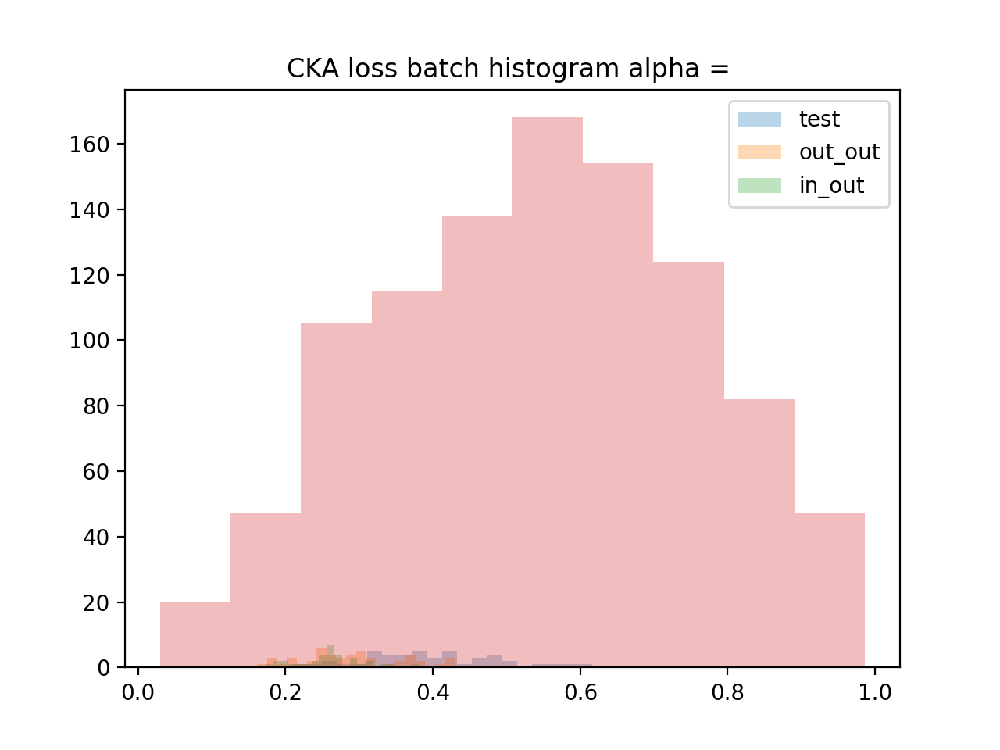

ValueError: too many values to unpack (expected 2)

In [243]:
for model in zero_results:
    print(model)
    plot_cka_scores(zero_results[model], layer='class')

work_space/save/CheXpert/FDL/2020-06-30_16:30_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=1.0_morph_func=zero


<IPython.core.display.Javascript object>


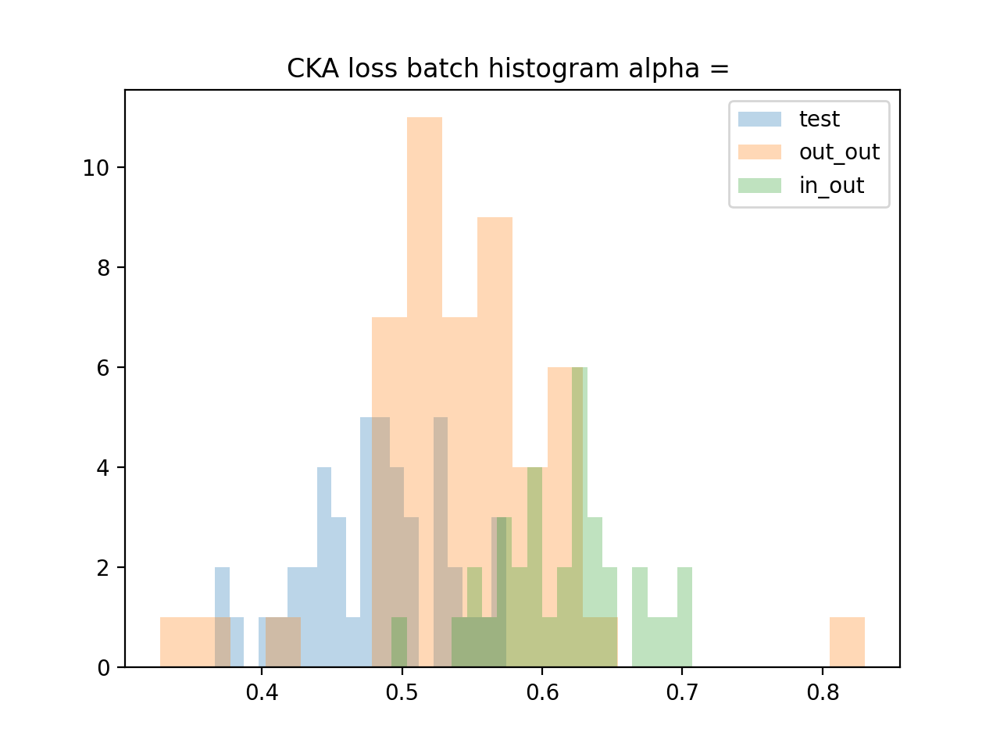

out_reject 0.04081632653061224
in_out_reject 0.0
work_space/save/CheXpert/FDL/2020-06-30_16:30_n=1_densenet121_lr=0.0001_m=__52_p=False_mean=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0_morph_func=zero


<IPython.core.display.Javascript object>


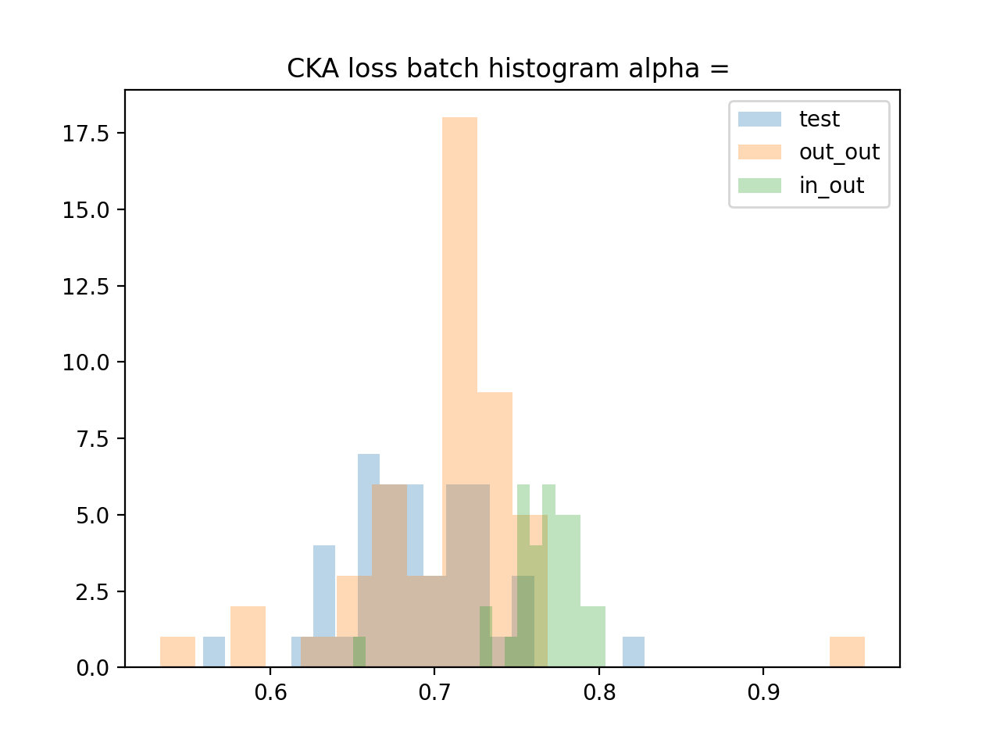

out_reject 0.061224489795918366
in_out_reject 0.0


In [94]:
for model in zero_results:
    print(model)
    plot_cka_scores(zero_results[model], layer='emb')

## cka_table

In [495]:
def collect_table(thresh):
    cka_table = dict()
    #for model in oscrl_results:
        #print(model)
    #    cka_table[model] = cka_rejection_scores(oscrl_results[model], layer='class', thresh=thresh)
    for model in joint_results_3:
        #print(model)
        cka_table[model] = cka_rejection_scores(joint_results_3[model], layer='class', thresh=thresh)
    for model in joint_results:
        #print(model)
        cka_table[model] = cka_rejection_scores(joint_results[model], layer='class', thresh=thresh)
    for model in fdl_results:
        #print(model)
        cka_table[model] = cka_rejection_scores(fdl_results[model], layer='class', thresh=thresh)
    #for model in zero_results:
        #print(model)
    #    cka_table[model] = cka_rejection_scores(zero_results[model], layer='class', thresh=thresh)
    
    cka_frame = pd.DataFrame.from_dict(cka_table, orient='index', columns=['out', 'in_out', 'test_auc']).sort_values('out', ascending=False)
    cka_frame.index = (cka_frame.index.str.extract('CheXpert/(.*)/') +' '+ 
                       cka_frame.index.str.extract('a=([\d\.\d]+)') +
                       cka_frame.index.str.extract('(n=[\d]+)') +
                       cka_frame.index.str.extract('(zero)').fillna('') + 
                       cka_frame.index.str.extract('(emb)').fillna('')).values.T[0]
    cka_frame.index.name = 'test_ood_fn_'+str(thresh)
    return cka_frame

<IPython.core.display.Javascript object>


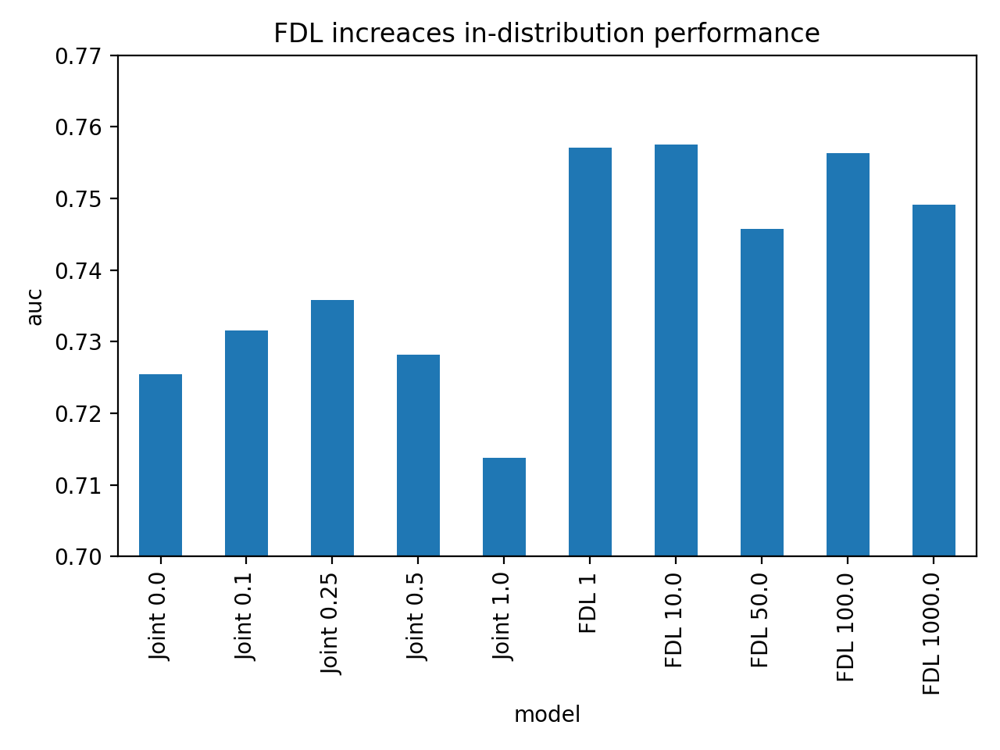

<IPython.core.display.Javascript object>


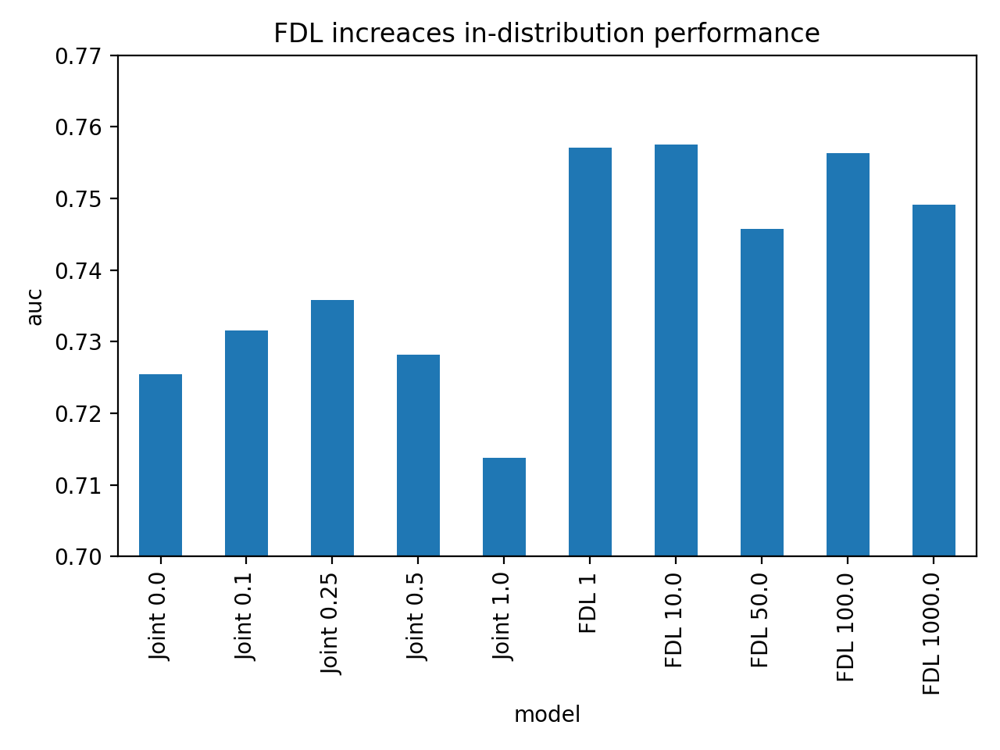

(0.7, 0.77)

Text(0.5, 1.0, 'FDL increaces in-distribution performance')

Text(0, 0.5, 'auc')

Text(0.5, 0, 'model')

In [485]:
plt.figure()
table_test_auc.loc[short_list].plot.bar()
plt.ylim(0.7, 0.77)
plt.title('FDL increaces in-distribution performance')
plt.ylabel('auc')
plt.xlabel('model')
plt.tight_layout()

## cka experimets

In [31]:
from CKA_torch import linear_CKA

In [32]:
def multidimensional_shifting(num_elements, sample_size, num_samples, seed=None):
    #setup
    elements = np.arange(num_elements)
    probabilities = np.ones(num_elements)
    probabilities /= np.sum(probabilities)
    
    # replicate probabilities as many times as `num_samples`
    replicated_probabilities = np.tile(probabilities, (num_samples, 1))
    
    if seed is not None:
        np.random.seed(seed)
    # get random shifting numbers & scale them correctly
    random_shifts = np.random.random(replicated_probabilities.shape, )
    random_shifts /= random_shifts.sum(axis=1)[:, np.newaxis]
    
    # shift by numbers & find largest (by finding the smallest of the negative)
    shifted_probabilities = random_shifts - replicated_probabilities
    return np.argpartition(shifted_probabilities, sample_size, axis=1)[:, :sample_size]

In [ ]:
def shuffle_along_axis(a, axis):
    idx = np.random.rand(*a.shape).argsort(axis=axis)
    return np.take_along_axis(a,idx,axis=axis)

In [ ]:
def get_cka_(thetas, batch=2, n_samples=1000):
    thetas = torch.Tensor(thetas)
    thetas = shuffle_along_axis(thetas)
    hist = [linear_CKA(chunk[0], chunk[1]).item() for chunk in np.nditer(thetas)]
    return np.array(hist)

In [695]:
from Pearson import pearsonr1d
def get_pearson(thetas, batch=2, n_samples=2000):
    thetas = torch.Tensor(thetas)
    inds = multidimensional_shifting(len(thetas[0]), batch, n_samples)
    hist = [np.mean([pearsonr1d(thetas[i][ind].view(-1), thetas[j][ind].view(-1)) for i,j in combinations(range(len(thetas)), 2)]) 
            for ind in inds]
    return np.array(hist)

In [692]:
def pearson_rejection(res, thresh=5, batch=2, with_dist=False, return_means=False):
    test_dist = get_pearson(res['test'][0], batch=batch)
    out_dist = get_pearson(res['out'][0], batch=batch)
    in_out_dist = get_pearson(res['in_out'][0], batch=batch)
    
    if return_means:
        return (out_dist.mean(), in_out_dist.mean(), test_dist.mean(), out_dist.std(), in_out_dist.std(), test_dist.std())
    
    percentile = np.percentile(test_dist, thresh)
    out_reject = (out_dist < percentile).mean()
    percentile = np.percentile(test_dist, 100-thresh)
    in_out_reject = (in_out_dist > percentile).mean()
    test_auc = mean_theta_score(res['test'][0], res['test'][1], metric=roc_auc_score)
    if with_dist:
        return out_reject, in_out_reject, test_auc, (test_dist, out_dist, in_out_dist)
    else:
        return out_reject, in_out_reject, test_auc

In [702]:
def plot_pearson_scores_new(res, name='', batch=2, thresh=1, density=False):
    out_reject, in_out_reject, test_auc, (test_dist, out_dist, in_out_dist) = pearson_rejection(res, batch=batch, with_dist=True)
    plt.figure()
    
    pd.Series(out_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(out_dist)) / len(out_dist), label='out_dist', density=density)
    pd.Series(in_out_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(in_out_dist)) / len(in_out_dist), label='mix', density=density)
    pd.Series(test_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(test_dist)) / len(test_dist), label='in_dist', density=density)
    
    plt.legend()
    plt.title(name)
    plt.xlabel('batch sim score')
    plt.ylabel('% of batches')
    plt.xlim((0,1))
    
    print("out_reject", out_reject)
    print("in_out_reject", in_out_reject)

In [513]:
from itertools import combinations
def get_cka(thetas, batch=2, n_samples=2000):
    thetas = torch.Tensor(thetas)
    inds = multidimensional_shifting(len(thetas[0]), batch, n_samples)
    hist = [np.mean([linear_CKA(thetas[i][ind], thetas[j][ind]).item() for i,j in combinations(range(len(thetas)), 2)]) 
            for ind in inds]
    return np.array(hist)

In [394]:
def cka_rejection(res, thresh=5, batch=2, with_dist=False, return_means=False):
    test_dist = get_cka(res['test'][0], batch=batch)
    out_dist = get_cka(res['out'][0], batch=batch)
    in_out_dist = get_cka(res['in_out'][0], batch=batch)
    
    if return_means:
        return (out_dist.mean(), in_out_dist.mean(), test_dist.mean(), out_dist.std(), in_out_dist.std(), test_dist.std())
    
    percentile = np.percentile(test_dist, thresh)
    out_reject = (out_dist < percentile).mean()
    in_out_reject = (in_out_dist < percentile).mean()
    test_auc = mean_theta_score(res['test'][0], res['test'][1], metric=roc_auc_score)
    if with_dist:
        return out_reject, in_out_reject, test_auc, (test_dist, out_dist, in_out_dist)
    else:
        return out_reject, in_out_reject, test_auc

In [822]:
def plot_scores_new(res, name='', batch=2, thresh=1, density=False, scoring_func=cka_rejection):
    out_reject, in_out_reject, test_auc, (test_dist, out_dist, in_out_dist) = scoring_func(res, batch=batch, with_dist=True)
    plt.figure()
    
    pd.Series(out_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(out_dist)) / len(out_dist), label='out_dist', density=density, color='c')
    pd.Series(in_out_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(in_out_dist)) / len(in_out_dist), label='mix', density=density, color='orange')
    pd.Series(test_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(test_dist)) / len(test_dist), label='in_dist', density=density, color='g')
    
    plt.legend()
    plt.title(name)
    plt.xlabel('batch sim score')
    plt.ylabel('% of batches')
    plt.xlim((0,1))
    
    print("out_reject", out_reject)
    print("in_out_reject", in_out_reject)

In [823]:
def collect_table(thresh=5, means=False, scoring_func=cka_rejection):
    sizes = [10, 50, 100]
    res = []
    keys = []
    for results_collection in [fdl_results, joint_results]:
        keys += list(results_collection.keys())
        for model in tqdm(results_collection,total=len(results_collection)):
            batch_res = [scoring_func(results_collection[model], batch=batch_size, thresh=thresh, return_means=means)
                         for batch_size in sizes]  
            res.append(np.array(batch_res))
    
    res = np.concatenate(res)
    keys = pd.Series(keys)
    keys = (keys.str.extract('CheXpert/(.*)/') +' '+ 
           keys.str.extract('a=([\d\.\d]+)') + 
           keys.str.extract('(n=[\d]+)') + 
           keys.str.extract('(zero)').fillna('') + 
           keys.str.extract('(emb)').fillna('')).values.T[0].tolist()
    
    mult_ind = pd.MultiIndex.from_tuples(zip(np.repeat(keys, len(sizes)), np.tile(sizes, len(keys))), names=['model','batch_size'])
    if means:
        cka_frame = pd.DataFrame(res, index = mult_ind, columns=['out_mean', 'mix_mean', 'test_mean', 'out_std', 'mix_std', 'test_std'])
    else:
        cka_frame = pd.DataFrame(res, index = mult_ind, columns=['out_detec_acc', 'mix_detec_acc', 'test_auc'])
    return cka_frame

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


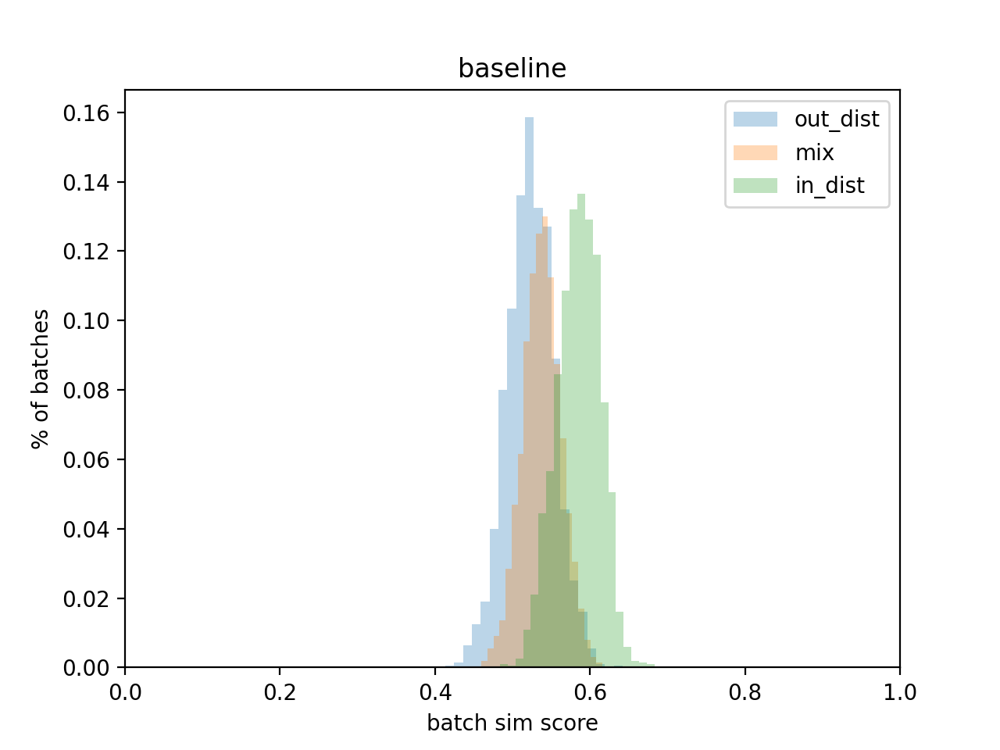

out_reject 0.6795
in_out_reject 0.0


In [708]:
model ='work_space/save/CheXpert/Joint/2020-07-05_15:26_n=2_densenet121_lr=0.0001_m=_a=0.0_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1'
plot_pearson_scores_new(joint_results[model], batch=200, thresh=1, name='baseline', density=False)

<IPython.core.display.Javascript object>


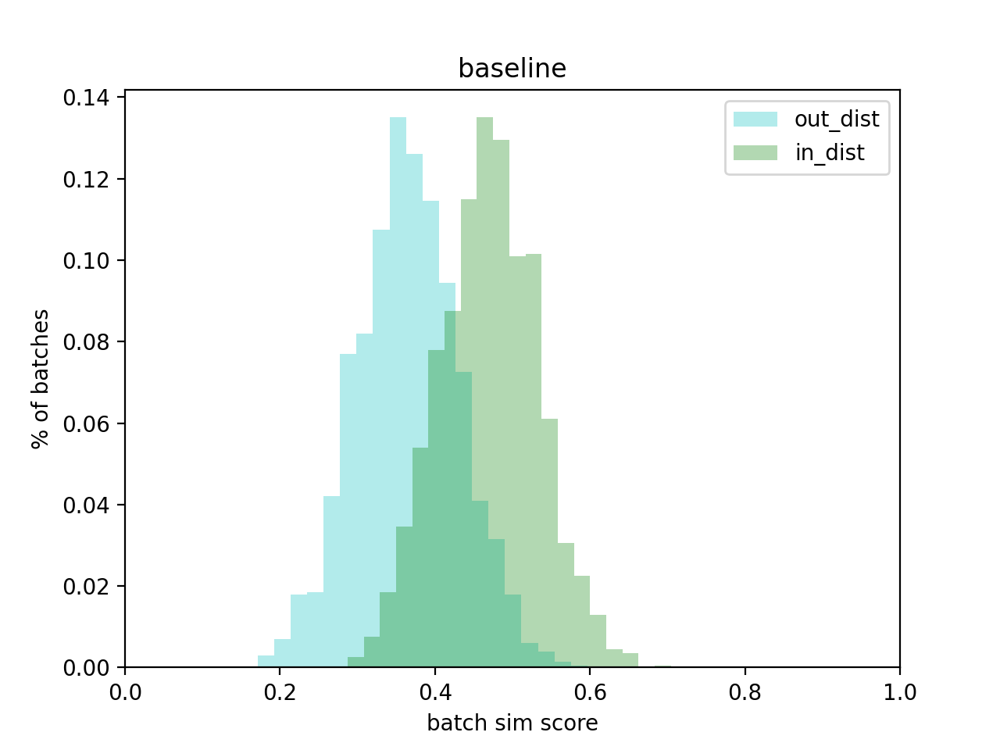

out_reject 0.5025
in_out_reject 0.98


In [531]:
model ='work_space/save/CheXpert/Joint/2020-07-05_15:26_n=2_densenet121_lr=0.0001_m=_a=0.0_52_p=False_mean=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1'
plot_cka_scores_new(joint_results[model], batch=100, thresh=1, name='baseline', density=False)

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


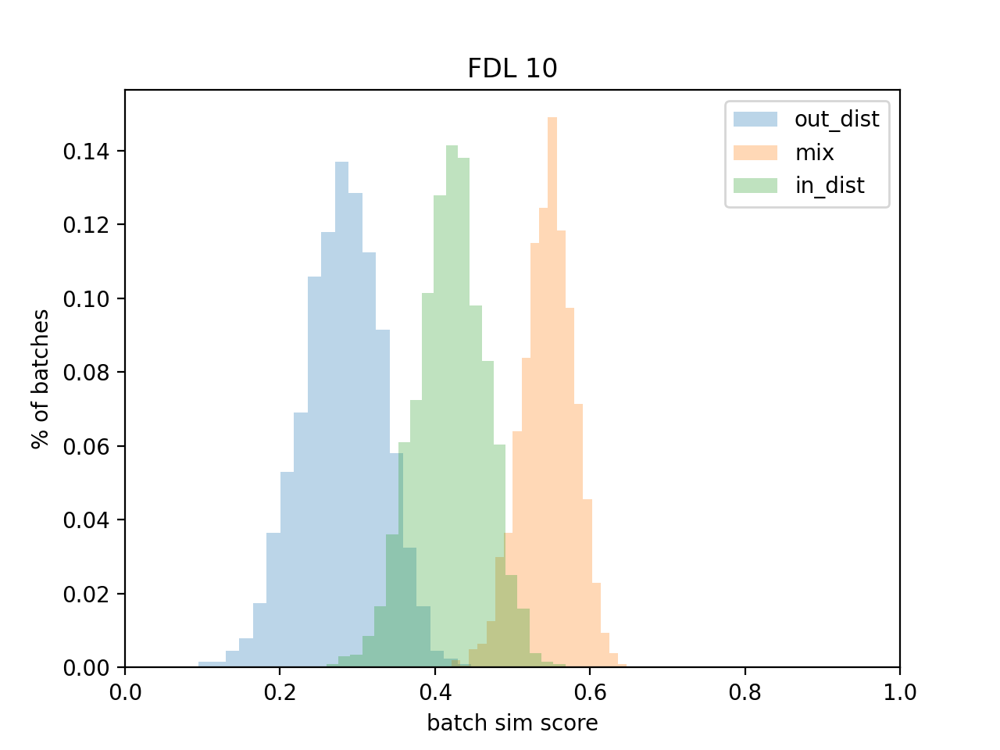

out_reject 0.8985
in_out_reject 0.942


In [710]:
model = 'work_space/save/CheXpert/FDL/2020-06-22_08:04_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0'
plot_pearson_scores_new(fdl_results[model], batch=100, thresh=1, name='FDL 10')

<IPython.core.display.Javascript object>


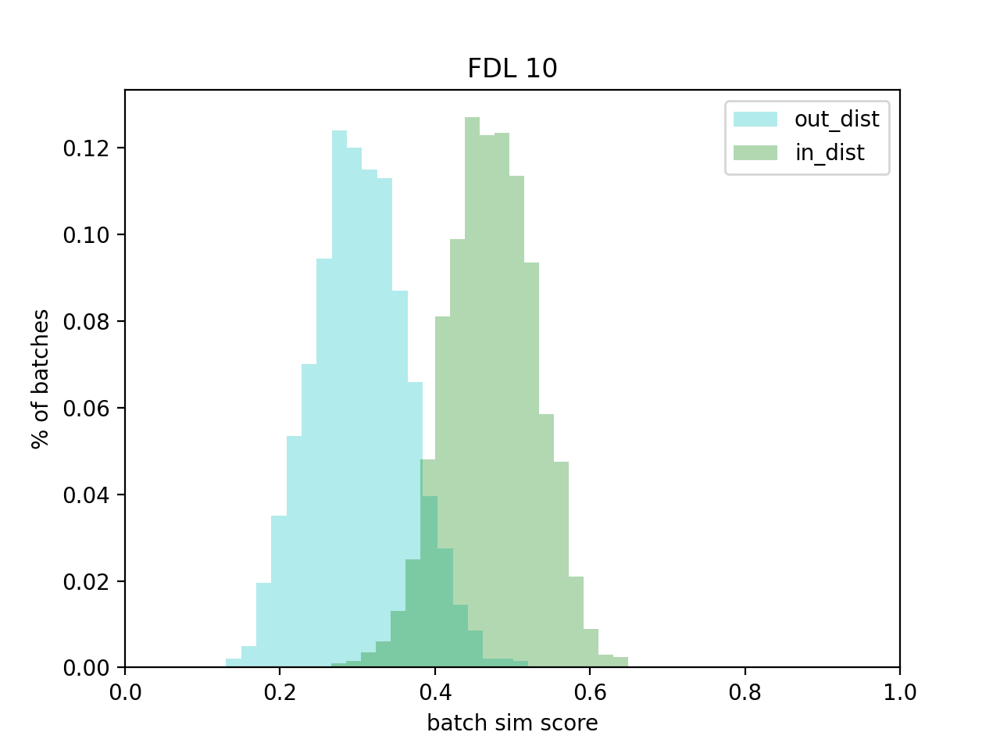

out_reject 0.8975
in_out_reject 0.966


In [532]:
model = 'work_space/save/CheXpert/FDL/2020-06-22_08:04_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0'
plot_cka_scores_new(fdl_results[model], batch=100, thresh=1, name='FDL 10')

In [714]:
pearson_table = collect_table(thresh=1, scoring_func=pearson_rejection)

In [715]:
pearson_table

out_detec_acc  mix_detec_acc  test_auc
model          batch_size                                        
FDL 0.1n=1     10                 0.0570         0.0005  0.755369
               50                 0.2250         0.0000  0.755369
               100                0.4085         0.0000  0.755369
FDL 1n=1       10                 0.0475         0.0045  0.757102
               50                 0.2265         0.0010  0.757102
               100                0.4640         0.0010  0.757102
FDL 10.0n=1    10                 0.0790         0.0640  0.757548
               50                 0.4015         0.4575  0.757548
               100                0.7795         0.8035  0.757548
FDL 10n=1      10                 0.0400         0.0035  0.740890
               50                 0.2055         0.0030  0.740890
               100                0.3505         0.0055  0.740890
FDL 50.0n=1    10                 0.0615         0.0065  0.745747
               50                 0.2680         0.0125  0.745747
               100                0.5110         0.0315  0.745747
FDL 100.0n=1   10                 0.0635         0.0570  0.756302
               50                 0.5390         0.3390  0.756302
               100                0.8600         0.6835  0.756302
FDL 1000.0n=1  10                 0.0200         0.0365  0.749156
               50                 0.0310         0.0945  0.749156
               100                0.0390         0.1590  0.749156
FDL 10000.0n=1 10                 0.0415         0.0335  0.749709
               50                 0.3295         0.0920  0.749709
               100                0.7785         0.2255  0.749709
Joint 1.0n=2   10                 0.0115         0.0195  0.713776
               50                 0.0460         0.0375  0.713776
               100                0.0685         0.0475  0.713776
Joint 0.0n=2   10                 0.0420         0.0010  0.725405
               50                 0.1625         0.0000  0.725405
               100                0.2805         0.0000  0.725405
Joint 0.1n=2   10                 0.0665         0.0005  0.731597
               50                 0.2250         0.0005  0.731597
               100                0.3690         0.0000  0.731597
Joint 0.25n=2  10                 0.0495         0.0010  0.735826
               50                 0.1350         0.0000  0.735826
               100                0.2545         0.0000  0.735826
Joint 0.5n=2   10                 0.0475         0.0010  0.728208
               50                 0.1980         0.0000  0.728208
               100                0.3530         0.0000  0.728208

In [525]:
join_3_frame = collect_cka_table_(1)


In [517]:
res_frame_mean_3 = collect_cka_table_(means=True)

In [526]:
join_3_frame

out_detec_acc  mix_detec_acc  test_auc
model         batch_size                                        
Joint 0.25n=3 10                 0.0475         0.0265  0.740593
              50                 0.1525         0.2920  0.740593
              100                0.3520         0.7445  0.740593
Joint 0.0n=3  10                 0.0875         0.0695  0.750446
              50                 0.2795         0.6615  0.750446
              100                0.6140         0.9655  0.750446
Joint 0.5n=3  10                 0.0755         0.0315  0.745960
              50                 0.2660         0.4820  0.745960
              100                0.5575         0.8710  0.745960

In [504]:
res_frame = collect_cka_table(5)

out_detec_acc  mix_detec_acc  test_auc
model       batch_size                                        
Joint 1.0   10                  0.075          0.045  0.713776
            50                  0.285          0.353  0.713776
            100                 0.442          0.680  0.713776
Joint 0.0   10                  0.147          0.143  0.725405
            50                  0.310          0.777  0.725405
            100                 0.476          0.985  0.725405
Joint 0.1   10                  0.171          0.129  0.731597
            50                  0.405          0.792  0.731597
            100                 0.707          0.978  0.731597
Joint 0.25  10                  0.157          0.162  0.735826
            50                  0.370          0.750  0.735826
            100                 0.632          0.973  0.735826
Joint 0.5   10                  0.162          0.103  0.728208
            50                  0.305          0.693  0.728208
            100                 0.581          0.954  0.728208
FDL 0.1     10                  0.181          0.191  0.755369
            50                  0.554          0.881  0.755369
            100                 0.860          0.998  0.755369
FDL 1       10                  0.191          0.150  0.757102
            50                  0.451          0.645  0.757102
            100                 0.733          0.954  0.757102
FDL 10.0    10                  0.206          0.152  0.757548
            50                  0.599          0.719  0.757548
            100                 0.887          0.957  0.757548
FDL 10      10                  0.086          0.086  0.740890
            50                  0.224          0.539  0.740890
            100                 0.256          0.853  0.740890
FDL 50.0    10                  0.151          0.131  0.745747
            50                  0.354          0.628  0.745747
            100                 0.596          0.921  0.745747
FDL 100.0   10                  0.177          0.140  0.756302
            50                  0.478          0.667  0.756302
            100                 0.699          0.917  0.756302
FDL 1000.0  10                  0.076          0.039  0.749156
            50                  0.148          0.093  0.749156
            100                 0.190          0.137  0.749156
FDL 10000.0 10                  0.126          0.130  0.749709
            50                  0.384          0.443  0.749709
            100                 0.612          0.682  0.749709

In [165]:
res_frame_1 = collect_cka_table(1)

In [273]:
res_frame_2 = collect_cka_table(.5)

In [541]:
short_list = sorted(set(res_frame.reset_index()['model'].values.tolist()), key=lambda x: (0 if 'J' in x else 1, float(re.findall(r'([\d\.\d]+)',x)[-1])))
short_list.remove('FDL 10')
short_list.remove('FDL 0.1')
short_list.remove('FDL 10000.0')
short_list[0] = 'Baseline'

In [395]:
res_frame_mean = collect_cka_table(means=True)

In [544]:
res_frame_mean = res_frame_mean.rename({'Joint 0.0':'Baseline', 'baseline':'Baseline'})

In [576]:
mean_res.set_index('model').loc[short_list[:5]].sort_values(by='variable')

,batch_size,variable,value,err
model,,,,
Baseline,100,mix_mean,0.260147,0.049324
Joint 0.1,100,mix_mean,0.276798,0.049603
Joint 0.25,100,mix_mean,0.270836,0.049109
Joint 0.5,100,mix_mean,0.238760,0.047560
Joint 1.0,100,mix_mean,0.120752,0.034299
Baseline,100,out_mean,0.363804,0.064733
Joint 0.1,100,out_mean,0.361246,0.065942
Joint 0.25,100,out_mean,0.361556,0.067055
Joint 0.5,100,out_mean,0.314801,0.064492


/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/pandas/core/computation/expressions.py:178: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


<IPython.core.display.Javascript object>


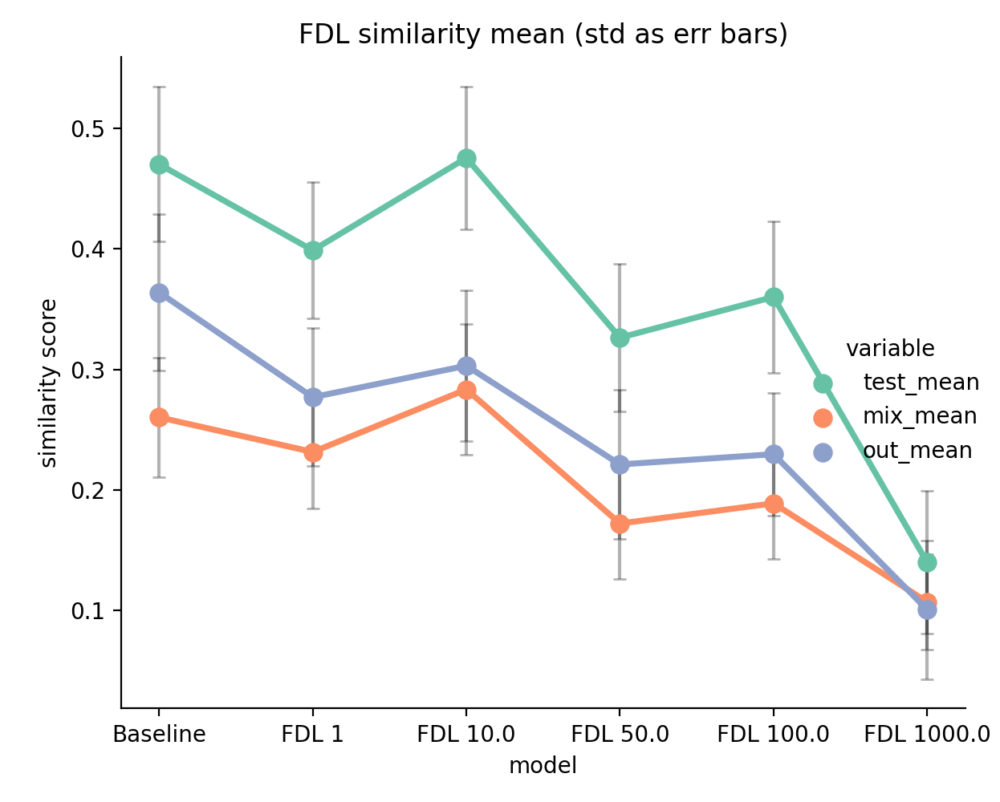

Text(0.5, 1.0, 'FDL similarity mean (std as err bars)')

Text(47.51833333333333, 0.5, 'similarity score')

<ErrorbarContainer object of 3 artists>

In [604]:
mean_res = res_frame_mean[['test_mean','mix_mean','out_mean']].reset_index().melt(['model', 'batch_size'])
std_res = res_frame_mean[['test_std','mix_std','out_std']].reset_index().melt(['model', 'batch_size'])

mean_res['err'] = std_res['value']
mean_res = mean_res[mean_res['model'].isin(short_list) & (mean_res['model'].str.contains('FDL') + (mean_res['model']=='Baseline')) & (mean_res['batch_size']==100)]
f = sns.catplot(data=mean_res, x='model', y="value", ci='err', hue="variable", kind="point", errwidth=5, palette="Set2")    
plt.title('FDL similarity mean (std as err bars)')
plt.tight_layout()
plt.ylabel('similarity score')

x_coords = []
y_coords = []
for point_pair in f.ax.collections:
    for x, y in point_pair.get_offsets():
        x_coords.append(x)
        y_coords.append(y)

# Calculate the type of error to plot as the error bars
# Make sure the order is the same as the points were looped over
mean_res['variable_srt'] = mean_res['variable'].map({'mix_mean':1,'out_mean':2,'test_mean':0})
f.ax.errorbar(x_coords, y_coords, yerr=mean_res.sort_values(['variable_srt', 'model'])['err'],
    ecolor='black', fmt=' ', zorder=-1, alpha=.3, capsize=3)

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/pandas/core/computation/expressions.py:178: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


<IPython.core.display.Javascript object>


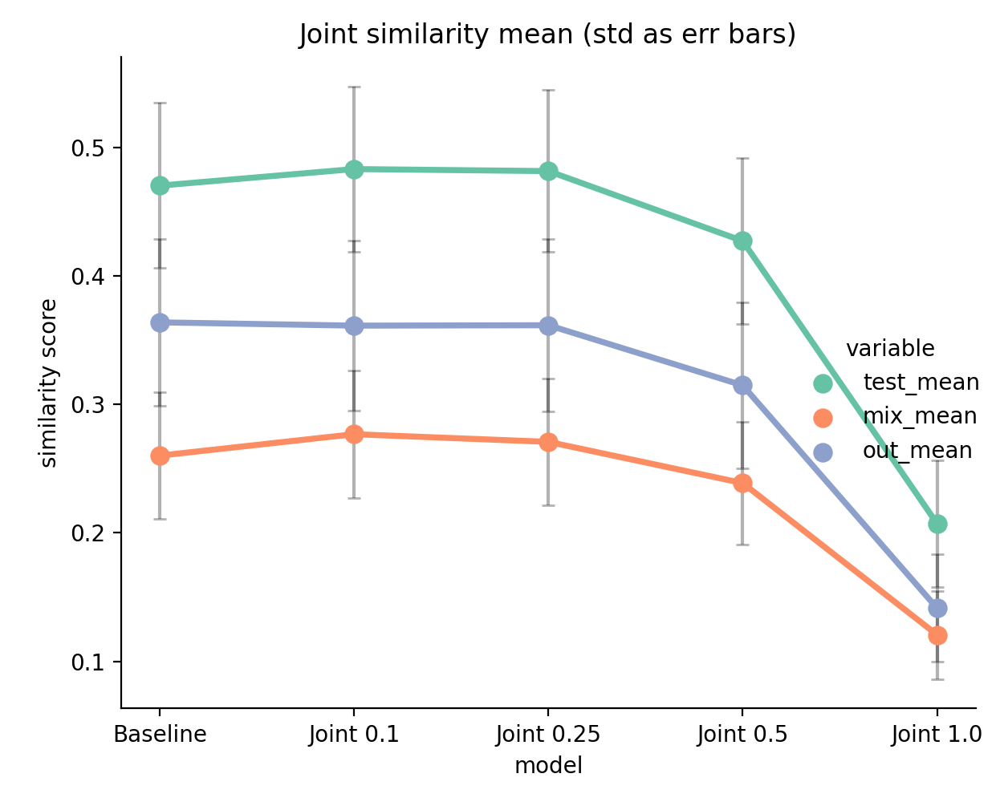

Text(0.5, 1.0, 'Joint similarity mean (std as err bars)')

Text(47.51833333333333, 0.5, 'similarity score')

<ErrorbarContainer object of 3 artists>

In [605]:
mean_res = res_frame_mean[['test_mean','mix_mean','out_mean']].reset_index().melt(['model', 'batch_size'])
std_res = res_frame_mean[['test_std','mix_std','out_std']].reset_index().melt(['model', 'batch_size'])
mean_res['err'] = std_res['value']
mean_res = mean_res[mean_res['model'].isin(short_list) & (mean_res['model'].str.contains('Joint') + (mean_res['model']=='Baseline')) & (mean_res['batch_size']==100)]
f = sns.catplot(data=mean_res, x='model', y="value", yerr='err', hue="variable", kind="point", order=short_list[:5], palette="Set2")    
plt.title('Joint similarity mean (std as err bars)')
plt.tight_layout()
plt.ylabel('similarity score')

x_coords = []
y_coords = []
for point_pair in f.ax.collections:
    for x, y in point_pair.get_offsets():
        x_coords.append(x)
        y_coords.append(y)

# Calculate the type of error to plot as the error bars
# Make sure the order is the same as the points were looped over
mean_res['variable_srt'] = mean_res['variable'].map({'mix_mean':1,'out_mean':2,'test_mean':0})
f.ax.errorbar(x_coords, y_coords, yerr=mean_res.sort_values(['variable_srt', 'model'])['err'],
    ecolor='black', fmt=' ', zorder=-1, alpha=.3, capsize=3)

<IPython.core.display.Javascript object>


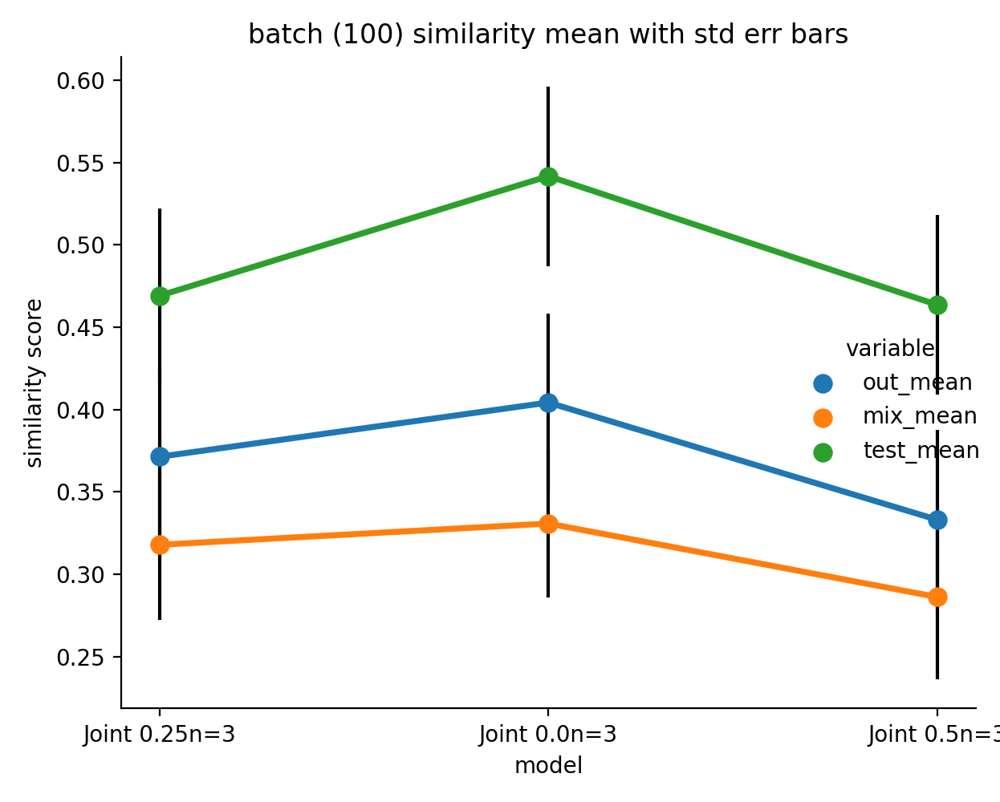

Text(0.5, 1.0, 'batch (100) similarity mean with std err bars')

Text(47.51833333333333, 0.5, 'similarity score')

<ErrorbarContainer object of 3 artists>

In [522]:
mean_res = res_frame_mean_3[[col for col in res_frame_mean_3.columns if 'mean' in col]].reset_index().melt(['model', 'batch_size'])
std_res = res_frame_mean_3[[col for col in res_frame_mean_3.columns if 'std' in col]].reset_index().melt(['model', 'batch_size'])
mean_res['err'] = std_res['value']
mean_res = mean_res[mean_res['model'].str.contains('Joint') & (mean_res['batch_size']==100)]
f = sns.catplot(data=mean_res, x='model', y="value", yerr='err', hue="variable", kind="point")    
plt.title('batch (100) similarity mean with std err bars')
plt.tight_layout()
plt.ylabel('similarity score')

x_coords = []
y_coords = []
for point_pair in f.ax.collections:
    for x, y in point_pair.get_offsets():
        x_coords.append(x)
        y_coords.append(y)

# Calculate the type of error to plot as the error bars
# Make sure the order is the same as the points were looped over
f.ax.errorbar(x_coords, y_coords, yerr=mean_res.set_index('model')['err'],
    ecolor='black', fmt=' ', zorder=-1)

In [607]:
res_frame = res_frame.rename({'Joint 0.0':'Baseline'})

In [610]:
res_frame_1 = res_frame_1.rename({'Joint 0.0':'Baseline'})

<IPython.core.display.Javascript object>


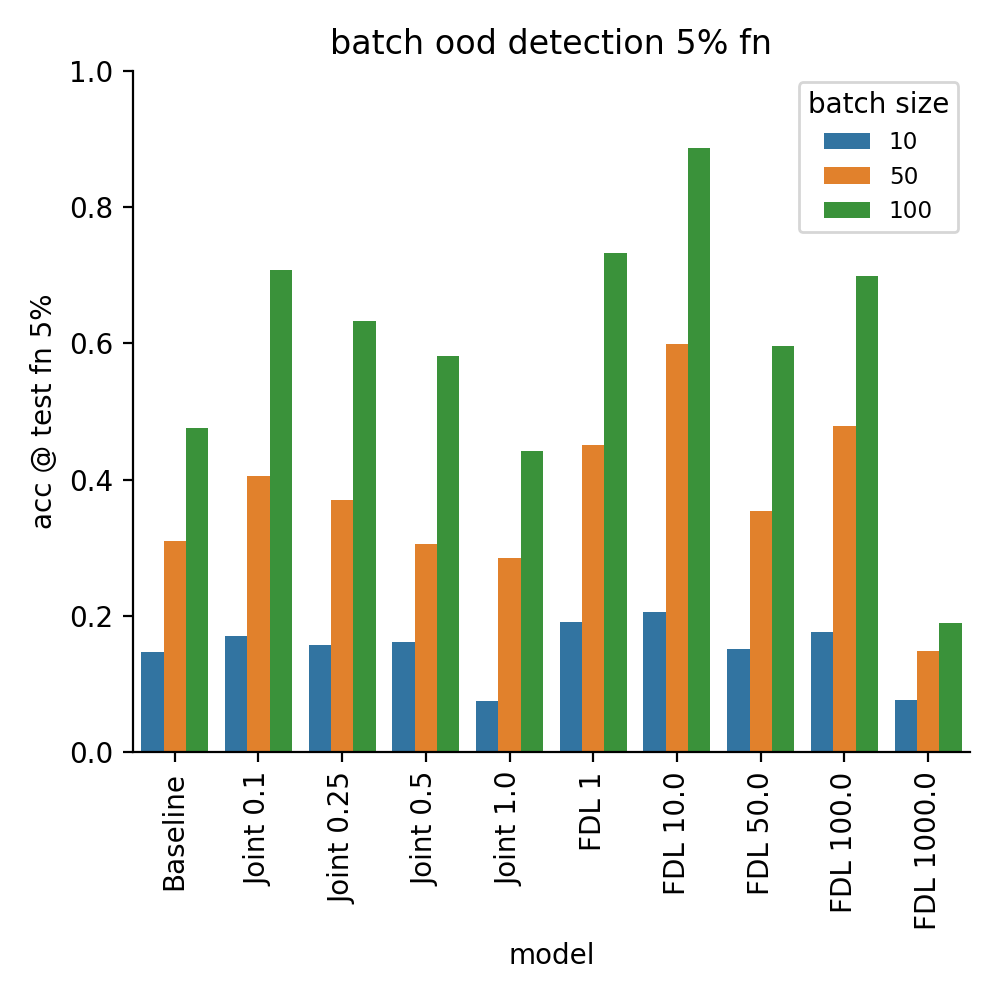

[Text(0, 0, 'Baseline'),
 Text(1, 0, 'Joint 0.1'),
 Text(2, 0, 'Joint 0.25'),
 Text(3, 0, 'Joint 0.5'),
 Text(4, 0, 'Joint 1.0'),
 Text(5, 0, 'FDL 1'),
 Text(6, 0, 'FDL 10.0'),
 Text(7, 0, 'FDL 50.0'),
 Text(8, 0, 'FDL 100.0'),
 Text(9, 0, 'FDL 1000.0')]

Text(9.444444444444445, 0.5, 'acc @ test fn 5%')

(0.0, 1.0)

Text(0.5, 1.0, 'batch ood detection 5% fn')

In [613]:
used_frame = res_frame.reset_index().set_index('model').loc[short_list].reset_index()

f = sns.factorplot(x='model', y='out_detec_acc', hue='batch_size', data=used_frame, kind='bar', legend=False)
f.axes[0][0].xaxis.set_ticklabels(f.axes[0][0].xaxis.get_ticklabels(), rotation=90)
f.axes[0][0].set_ylabel('acc @ test fn 5%')
f.axes[0][0].set_ylim(0,1)
plt.title('batch ood detection 5% fn')
plt.tight_layout()
handles, labels = f.axes[0][0].get_legend_handles_labels()
f.axes[0][0].legend(handles, labels, title='batch size', loc='upper right', ncol=1, fontsize='small')                

<IPython.core.display.Javascript object>


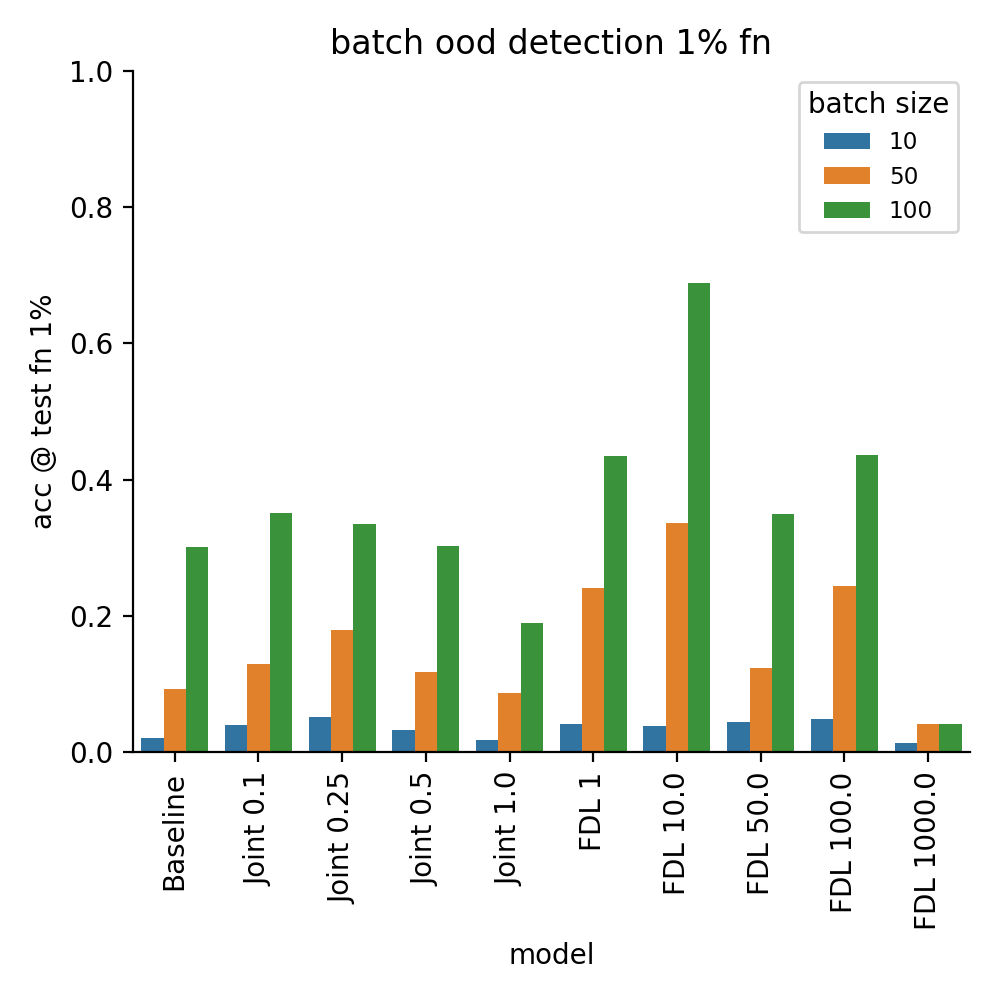

[Text(0, 0, 'Baseline'),
 Text(1, 0, 'Joint 0.1'),
 Text(2, 0, 'Joint 0.25'),
 Text(3, 0, 'Joint 0.5'),
 Text(4, 0, 'Joint 1.0'),
 Text(5, 0, 'FDL 1'),
 Text(6, 0, 'FDL 10.0'),
 Text(7, 0, 'FDL 50.0'),
 Text(8, 0, 'FDL 100.0'),
 Text(9, 0, 'FDL 1000.0')]

Text(9.444444444444445, 0.5, 'acc @ test fn 1%')

(0.0, 1.0)

Text(0.5, 1.0, 'batch ood detection 1% fn')

In [612]:
used_frame = res_frame_1.reset_index().set_index('model').loc[short_list].reset_index()

f = sns.factorplot(x='model', y='out_detec_acc', hue='batch_size', data=used_frame, kind='bar', legend=False)
f.axes[0][0].xaxis.set_ticklabels(f.axes[0][0].xaxis.get_ticklabels(), rotation=90)
f.axes[0][0].set_ylabel('acc @ test fn 1%')
f.axes[0][0].set_ylim(0,1)
plt.title('batch ood detection 1% fn')
plt.tight_layout()
handles, labels = f.axes[0][0].get_legend_handles_labels()
f.axes[0][0].legend(handles, labels, title='batch size', loc='upper right', ncol=1, fontsize='small')                

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/seaborn/categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


<IPython.core.display.Javascript object>


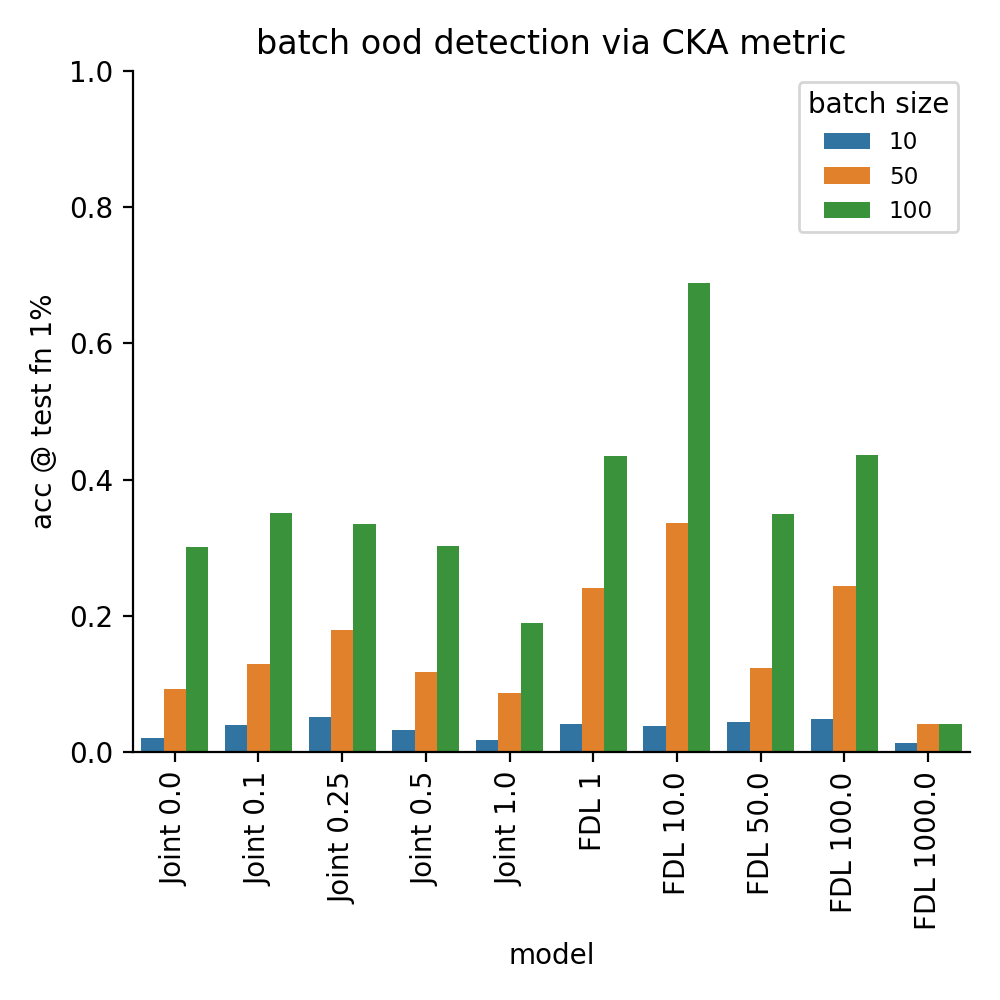

[Text(0, 0, 'Joint 0.0'),
 Text(1, 0, 'Joint 0.1'),
 Text(2, 0, 'Joint 0.25'),
 Text(3, 0, 'Joint 0.5'),
 Text(4, 0, 'Joint 1.0'),
 Text(5, 0, 'FDL 1'),
 Text(6, 0, 'FDL 10.0'),
 Text(7, 0, 'FDL 50.0'),
 Text(8, 0, 'FDL 100.0'),
 Text(9, 0, 'FDL 1000.0')]

Text(9.444444444444445, 0.5, 'acc @ test fn 1%')

(0.0, 1.0)

Text(0.5, 1.0, 'batch ood detection via CKA metric')

In [308]:
used_frame = res_frame_1.reset_index().set_index('model').loc[short_list].reset_index()

f = sns.factorplot(x='model', y='out_detec_acc', hue='batch_size', data=used_frame, kind='bar', legend=False)
f.axes[0][0].xaxis.set_ticklabels(f.axes[0][0].xaxis.get_ticklabels(), rotation=90)
f.axes[0][0].set_ylabel('acc @ test fn 1%')
f.axes[0][0].set_ylim(0,1)
plt.title('batch ood detection via CKA metric')
plt.tight_layout()
handles, labels = f.axes[0][0].get_legend_handles_labels()
f.axes[0][0].legend(handles, labels, title='batch size', loc='upper right', ncol=1, fontsize='small')                

<IPython.core.display.Javascript object>


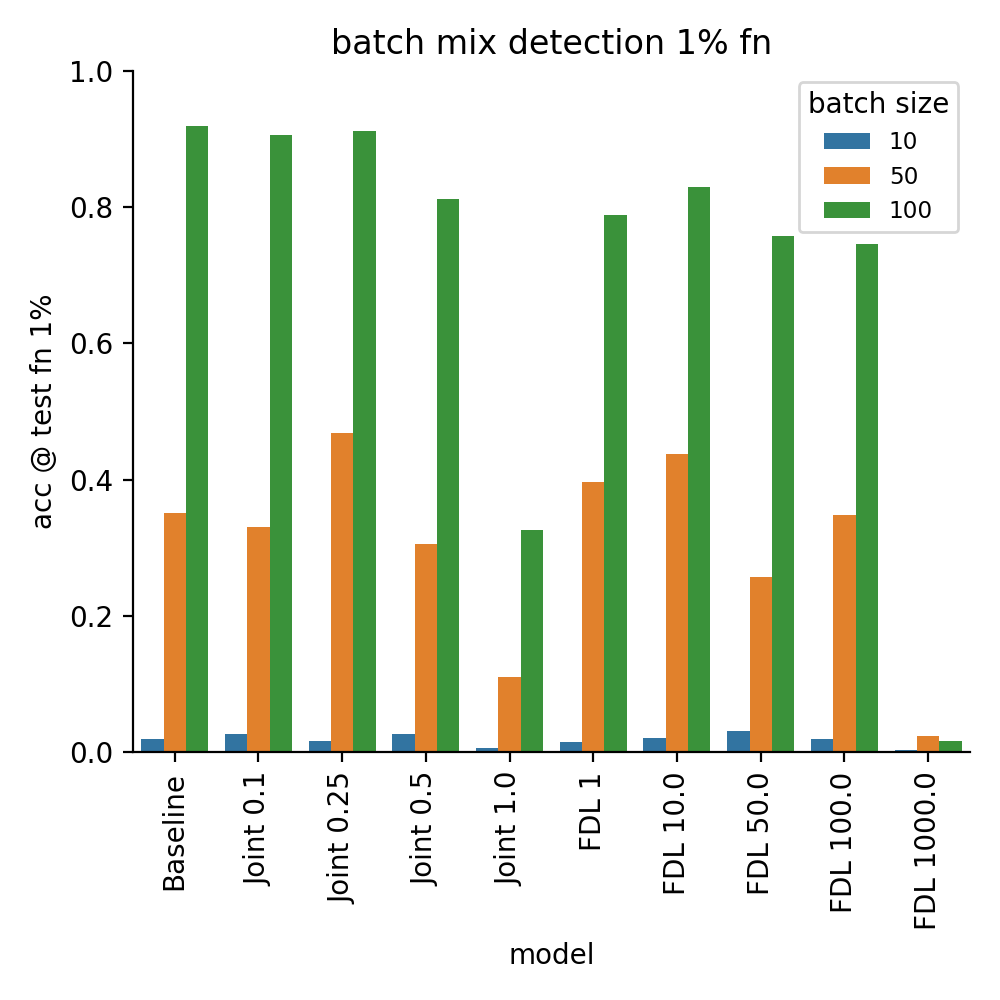

[Text(0, 0, 'Baseline'),
 Text(1, 0, 'Joint 0.1'),
 Text(2, 0, 'Joint 0.25'),
 Text(3, 0, 'Joint 0.5'),
 Text(4, 0, 'Joint 1.0'),
 Text(5, 0, 'FDL 1'),
 Text(6, 0, 'FDL 10.0'),
 Text(7, 0, 'FDL 50.0'),
 Text(8, 0, 'FDL 100.0'),
 Text(9, 0, 'FDL 1000.0')]

Text(9.444444444444445, 0.5, 'acc @ test fn 1%')

(0.0, 1.0)

Text(0.5, 1.0, 'batch mix detection 1% fn')

In [615]:
used_frame = res_frame_1.reset_index().set_index('model').loc[short_list].reset_index()


f = sns.factorplot(x='model', y='mix_detec_acc', hue='batch_size', data=used_frame, kind='bar', legend=False)
f.axes[0][0].xaxis.set_ticklabels(f.axes[0][0].xaxis.get_ticklabels(), rotation=90)
f.axes[0][0].set_ylabel('acc @ test fn 1%')
f.axes[0][0].set_ylim(0,1)
plt.title('batch mix detection 1% fn')
plt.tight_layout()
handles, labels = f.axes[0][0].get_legend_handles_labels()
f.axes[0][0].legend(handles, labels, title='batch size', loc='upper right', ncol=1, fontsize='small')

                    

<IPython.core.display.Javascript object>


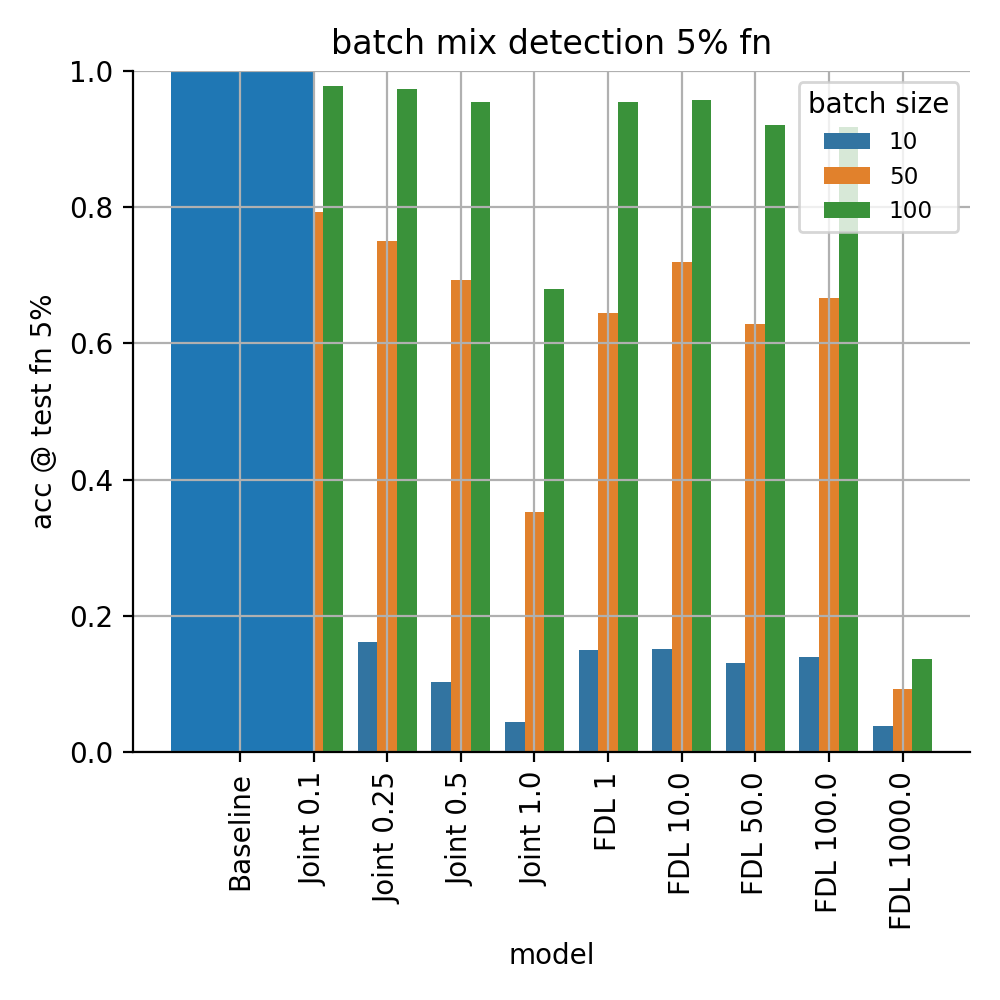

[Text(0, 0, 'Baseline'),
 Text(1, 0, 'Joint 0.1'),
 Text(2, 0, 'Joint 0.25'),
 Text(3, 0, 'Joint 0.5'),
 Text(4, 0, 'Joint 1.0'),
 Text(5, 0, 'FDL 1'),
 Text(6, 0, 'FDL 10.0'),
 Text(7, 0, 'FDL 50.0'),
 Text(8, 0, 'FDL 100.0'),
 Text(9, 0, 'FDL 1000.0')]

Text(9.444444444444445, 0.5, 'acc @ test fn 5%')

(0.0, 1.0)

Text(0.5, 1.0, 'batch mix detection 5% fn')

In [617]:
used_frame = res_frame.reset_index().set_index('model').loc[short_list].reset_index()


f = sns.factorplot(x='model', y='mix_detec_acc', hue='batch_size', data=used_frame, kind='bar', legend=False)
f.axes[0][0].xaxis.set_ticklabels(f.axes[0][0].xaxis.get_ticklabels(), rotation=90)
f.axes[0][0].set_ylabel('acc @ test fn 5%')
f.axes[0][0].set_ylim(0,1)
plt.title('batch mix detection 5% fn')
plt.tight_layout()
handles, labels = f.axes[0][0].get_legend_handles_labels()
f.axes[0][0].legend(handles, labels, title='batch size', loc='upper right', ncol=1, fontsize='small')

                    

<IPython.core.display.Javascript object>


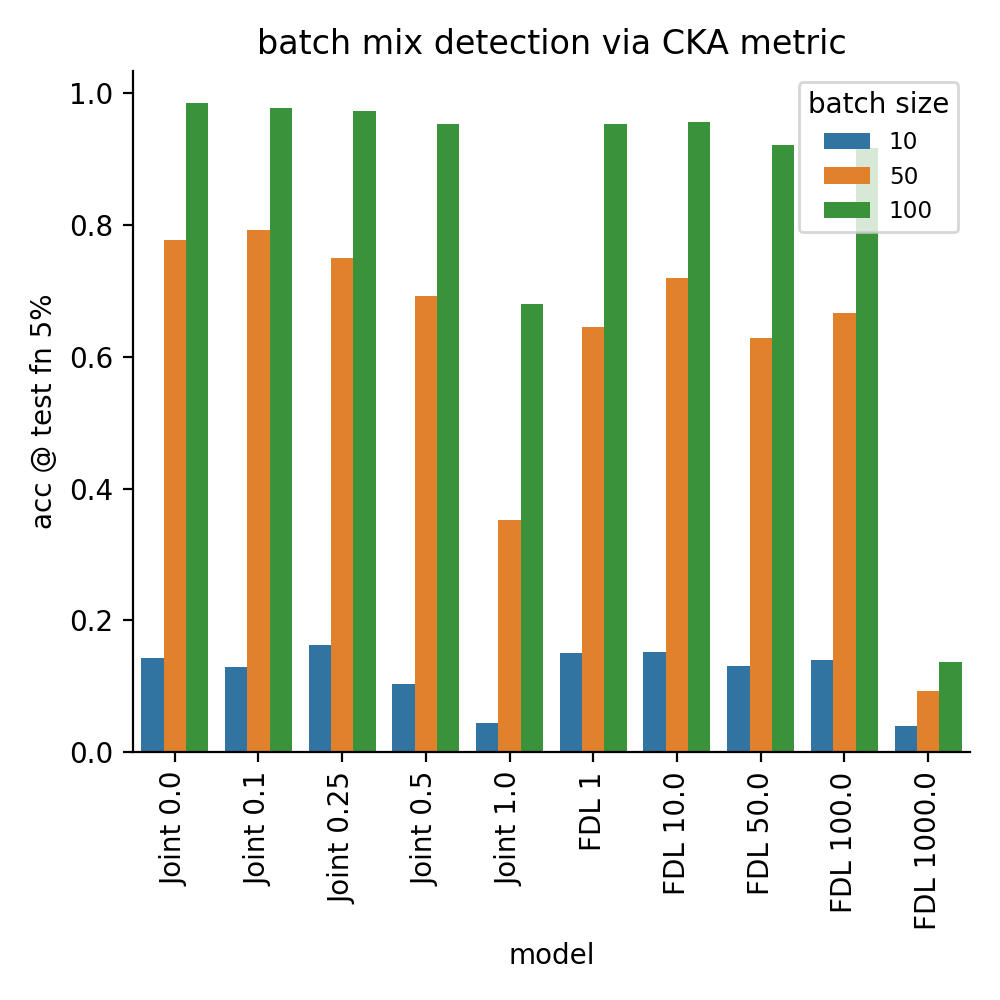

[Text(0, 0, 'Joint 0.0'),
 Text(1, 0, 'Joint 0.1'),
 Text(2, 0, 'Joint 0.25'),
 Text(3, 0, 'Joint 0.5'),
 Text(4, 0, 'Joint 1.0'),
 Text(5, 0, 'FDL 1'),
 Text(6, 0, 'FDL 10.0'),
 Text(7, 0, 'FDL 50.0'),
 Text(8, 0, 'FDL 100.0'),
 Text(9, 0, 'FDL 1000.0')]

Text(9.444444444444445, 0.5, 'acc @ test fn 5%')

Text(0.5, 1.0, 'batch mix detection via CKA metric')

In [241]:
used_frame = res_frame.reset_index().set_index('model').loc[short_list].reset_index()

f = sns.factorplot(x='model', y='mix_detec_acc', hue='batch_size', data=used_frame, kind='bar', legend=False)
f.axes[0][0].xaxis.set_ticklabels(f.axes[0][0].xaxis.get_ticklabels(), rotation=90)
f.axes[0][0].set_ylabel('acc @ test fn 5%')
f.axes[0][0].set_ylim(0,1)
plt.title('batch mix detection via CKA metric')
plt.tight_layout()
handles, labels = f.axes[0][0].get_legend_handles_labels()
f.axes[0][0].legend(handles, labels, title='batch size', loc='upper right', ncol=1, fontsize='small')

                    

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


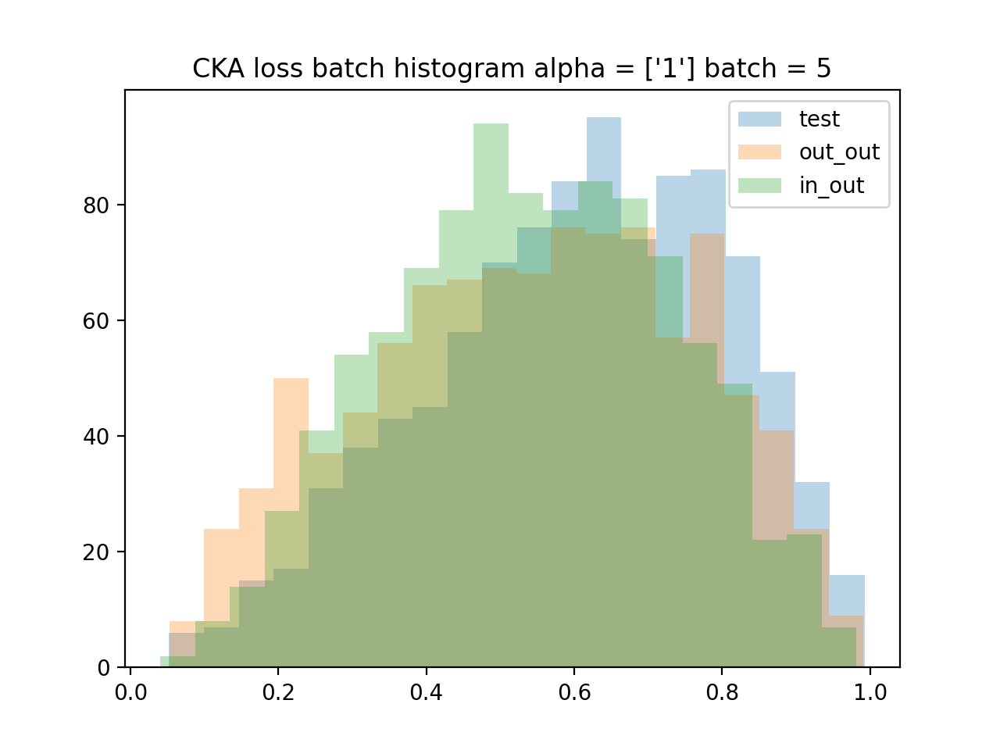

out_reject 0.128
in_out_reject 0.07


In [315]:
plot_cka_scores_new(zero_results[model], name=str(re.findall(r'a=(\d+)', model)), batch=5)

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


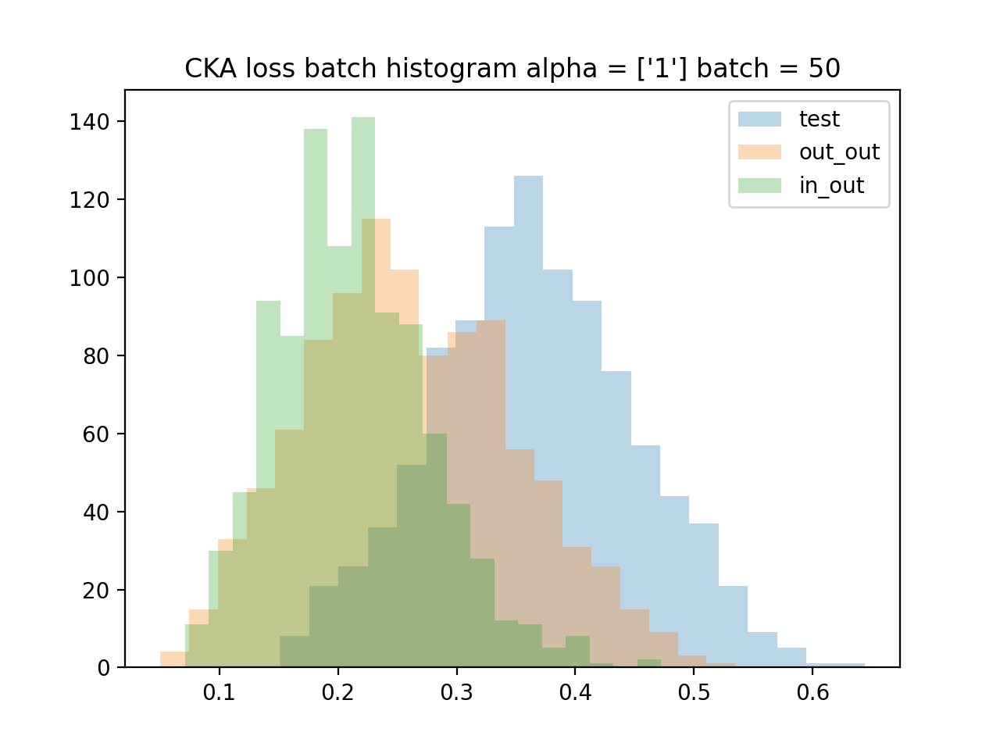

out_reject 0.351
in_out_reject 0.597


In [316]:
plot_cka_scores_new(zero_results[model], name=str(re.findall(r'a=(\d+)', model)), batch=50)

### checking label integrity

In [758]:
def small_corr(mat):
    corr = np.round(np.corrcoef(mat), 6)
    np.fill_diagonal(corr, 0)
    return np.mean(squareform(corr))

def get_corr(mat, batch=2, n_samples=2000):
    inds = multidimensional_shifting(mat.shape[0], batch, n_samples)
    hist = [small_corr(mat[ind]) for ind in inds]
    return np.array(hist)

In [767]:
def plot_label_scores_new(name='', batch=2, density=False):
    in_out_dist = get_corr(in_out.dataset.labels, batch=batch)
    test_dist = get_corr(test.dataset.labels, batch=batch)
    out_dist = get_corr(out_out.dataset.labels, batch=batch)
    
    plt.figure()
    
    pd.Series(out_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(out_dist)) / len(out_dist), label='out_dist', density=density)
    pd.Series(in_out_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(in_out_dist)) / len(in_out_dist), label='mix', density=density)
    pd.Series(test_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(test_dist)) / len(test_dist), label='in_dist', density=density)
    
    plt.legend()
    plt.title(name)
    plt.xlabel('batch sim score')
    plt.ylabel('% of batches')
    plt.xlim((0,1))
    plt.title('mean pairwise label correlation within batch')

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


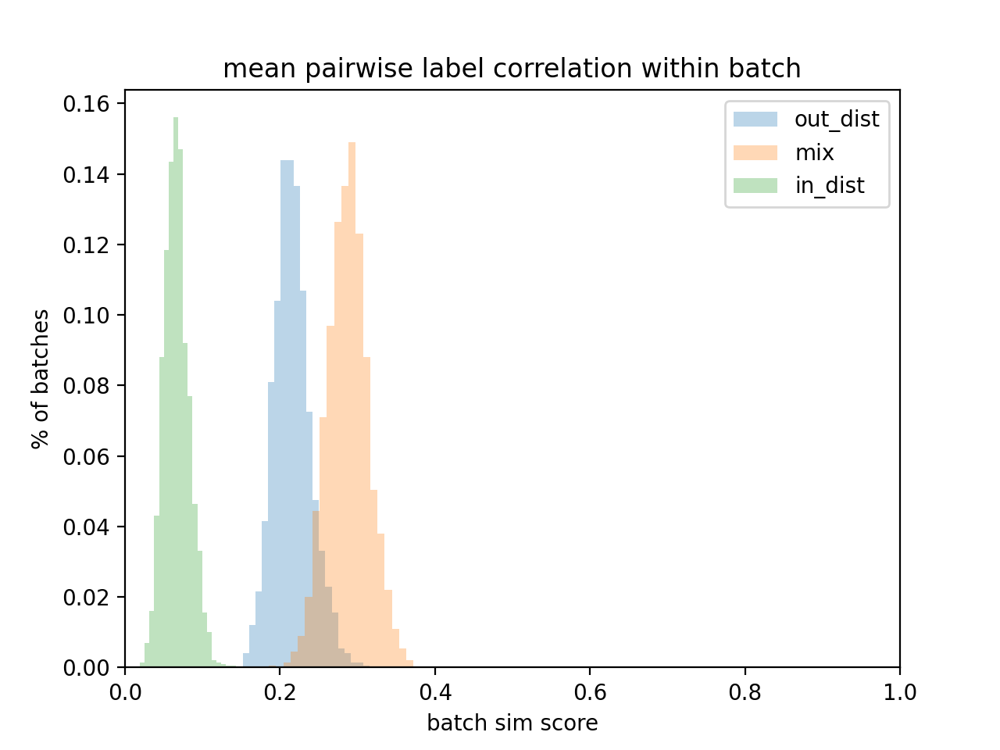

TypeError: unsupported operand type(s) for /: 'NoneType' and 'int'

In [818]:
plot_label_scores_new(batch=100)

In [821]:
print(small_corr(test.dataset.labels))
print(small_corr(out_out.dataset.labels))
print(small_corr(in_out.dataset.labels))

0.06678647617020453
0.2154168791305536


MemoryError: Unable to allocate 135. GiB for an array with shape (134438, 134438) and data type float64

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


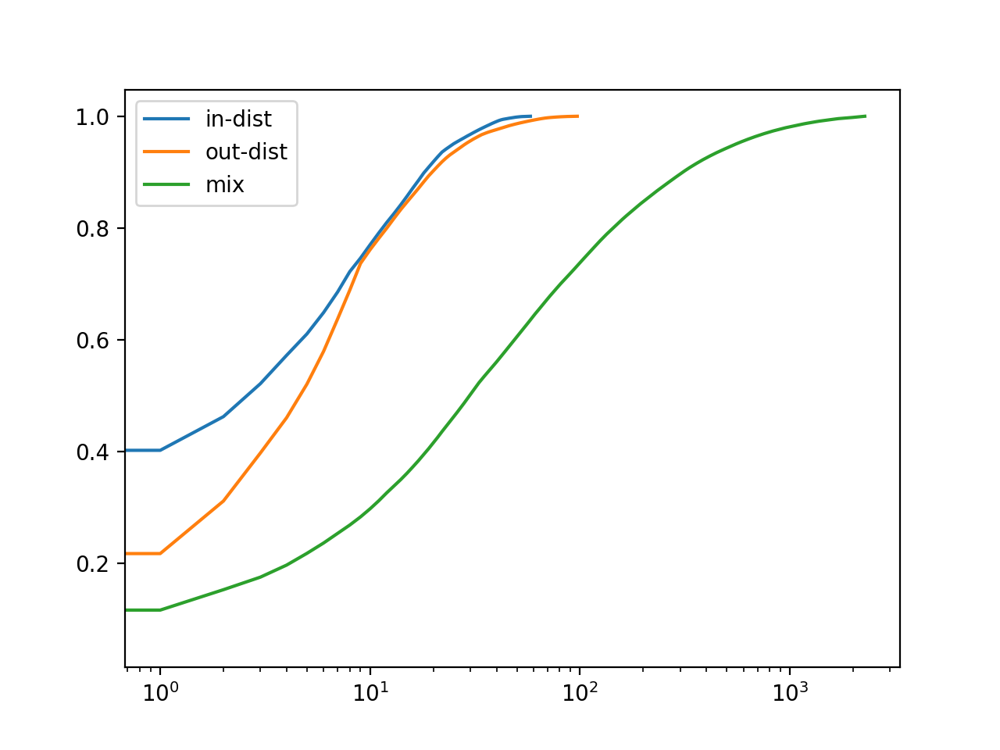

<IPython.core.display.Javascript object>


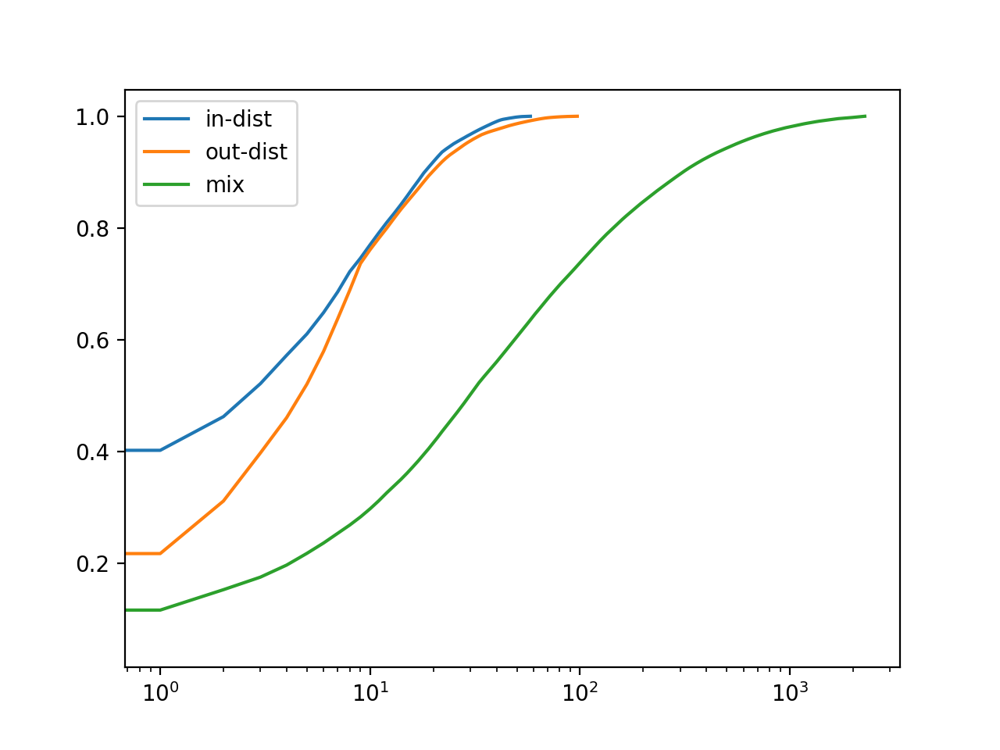

In [812]:
plt.figure()
curr = pd.Series((test.dataset.labels * 
                    np.power(2, np.arange(test.dataset.labels.shape[1]))).sum(1).numpy()).value_counts().values
plt.plot(np.cumsum(curr/np.sum(curr)), label='in-dist')
curr = pd.Series((out_out.dataset.labels * 
                    np.power(2, np.arange(out_out.dataset.labels.shape[1]))).sum(1).numpy()).value_counts().values
plt.plot(np.cumsum(curr/np.sum(curr)), label='out-dist')
curr = pd.Series((in_out.dataset.labels * 
                    np.power(2, np.arange(in_out.dataset.labels.shape[1]))).sum(1).numpy()).value_counts().values
plt.plot(np.cumsum(curr/np.sum(curr)), label='mix')
plt.xscale('log')
plt.legend()

In [663]:
def plot_pearson(res, name='', factor=2):
    plt.figure()
    bins=50
    
    batches = res['out'][0][0].shape[0]//factor
    samples = batches * factor
    gourp_len = res['out'][0][0].shape[1]*factor
    pd.Series(pearsonr2d(torch.Tensor(res['out'][0][0][:samples].reshape(batches, gourp_len)), 
                         torch.Tensor(res['out'][0][1][:samples].reshape(batches, gourp_len))
                                     )).hist(bins=bins, alpha=0.3, grid=False, label='out')
    
    batches = res['in_out'][0][0].shape[0]//factor
    samples = batches * factor
    gourp_len = res['in_out'][0][0].shape[1]*factor
    pd.Series(pearsonr2d(torch.Tensor(res['in_out'][0][0][:samples].reshape(batches, gourp_len)), 
                         torch.Tensor(res['in_out'][0][1][:samples].reshape(batches, gourp_len))
                                     )).hist(bins=bins, alpha=0.3, grid=False, label='mix')
    
    batches = res['test'][0][0].shape[0]//factor
    samples = batches * factor
    gourp_len = res['test'][0][0].shape[1]*factor
    pd.Series(pearsonr2d(torch.Tensor(res['test'][0][0][:samples].reshape(batches, gourp_len)), 
                         torch.Tensor(res['test'][0][1][:samples].reshape(batches, gourp_len))
                                     )).hist(bins=bins, alpha=0.3, grid=False, label='test')
    plt.legend()
    plt.title(name)

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


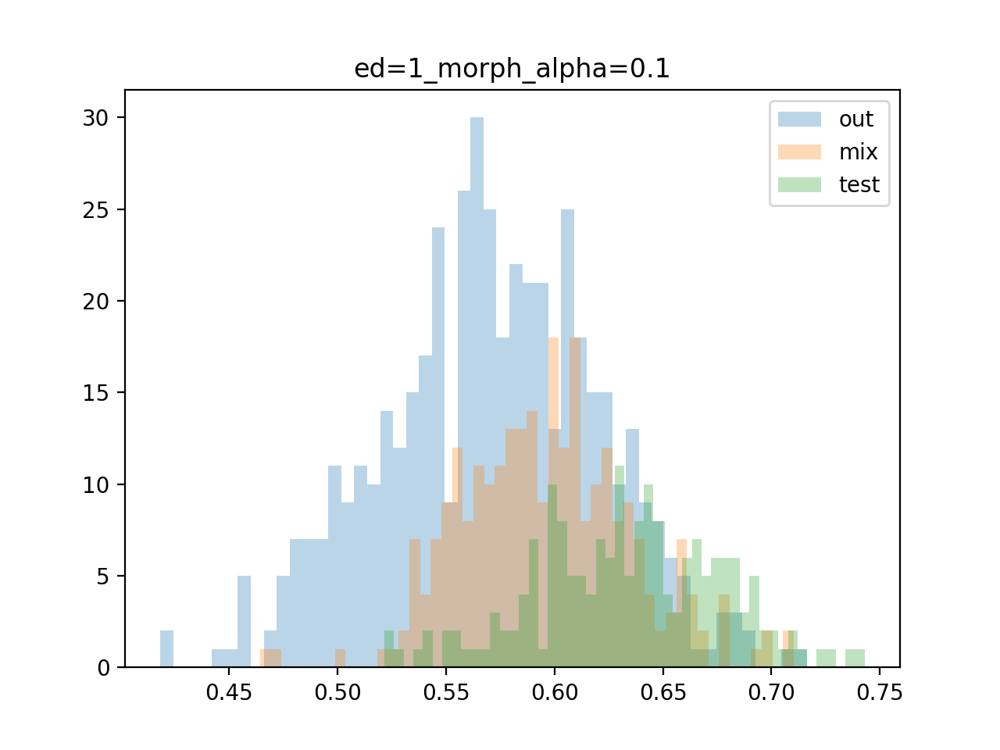

<IPython.core.display.Javascript object>


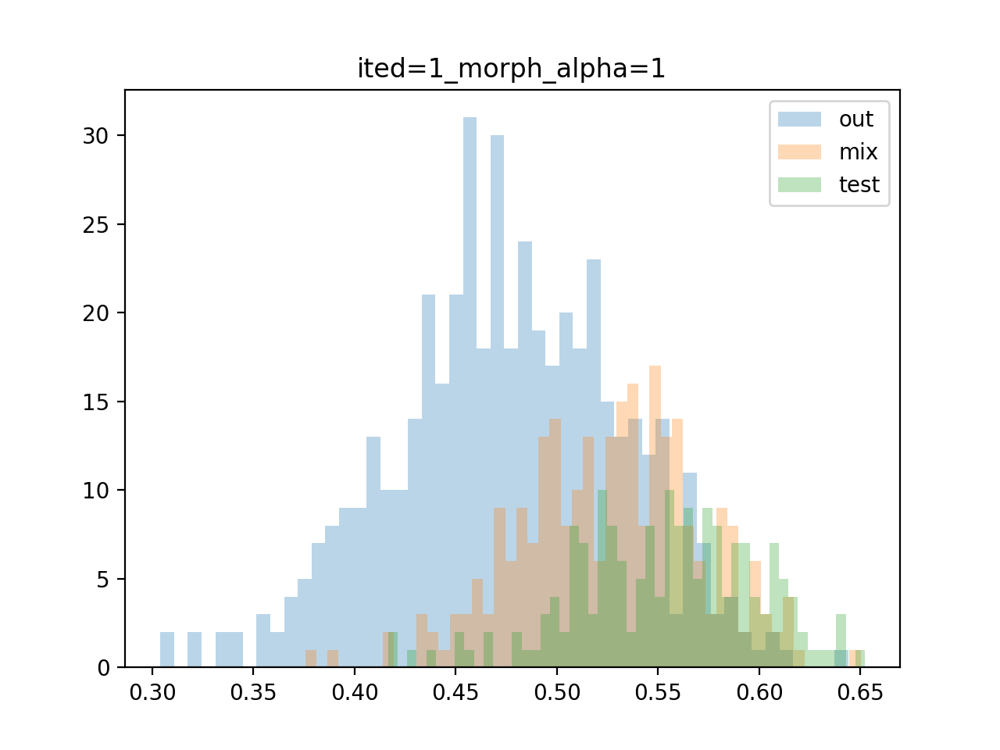

<IPython.core.display.Javascript object>


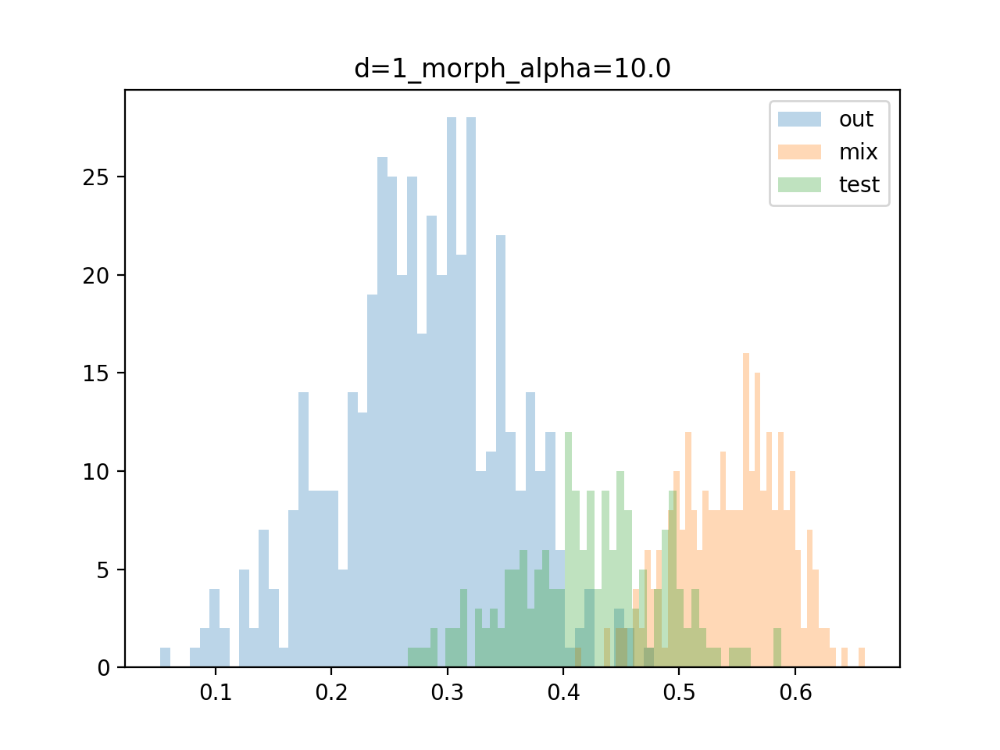

<IPython.core.display.Javascript object>


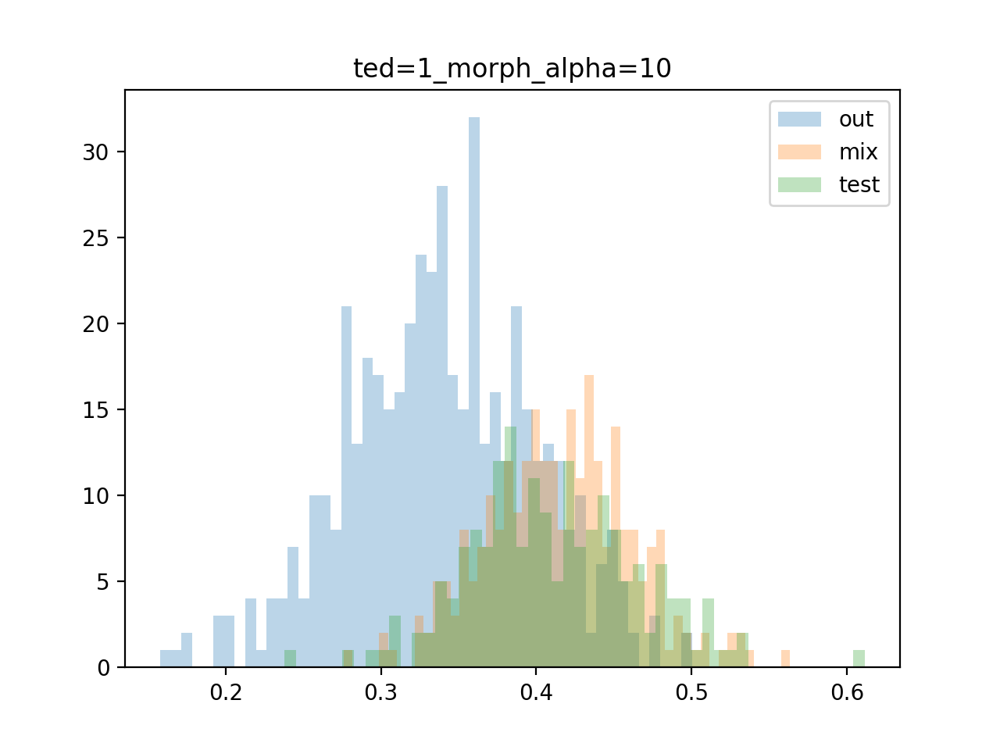

<IPython.core.display.Javascript object>


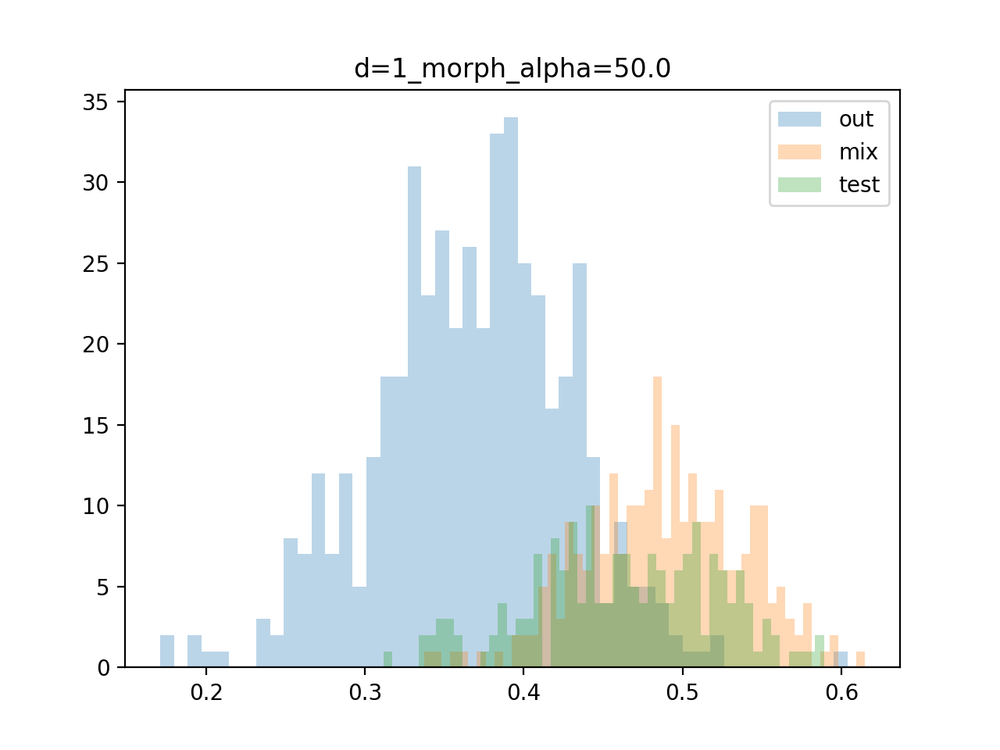

<IPython.core.display.Javascript object>


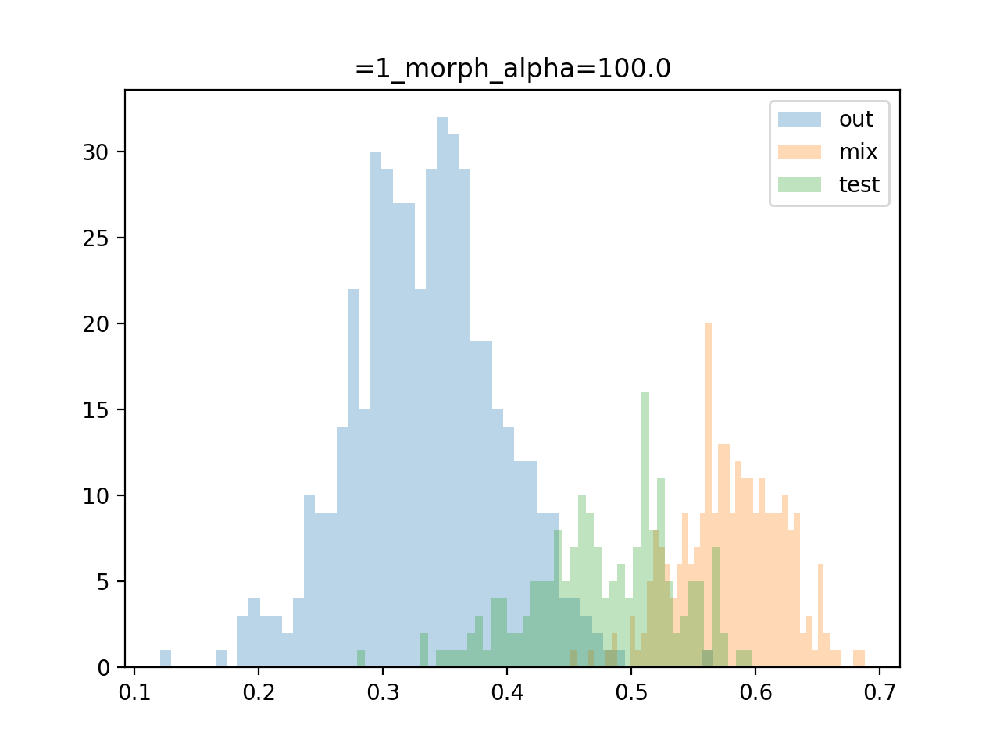

<IPython.core.display.Javascript object>


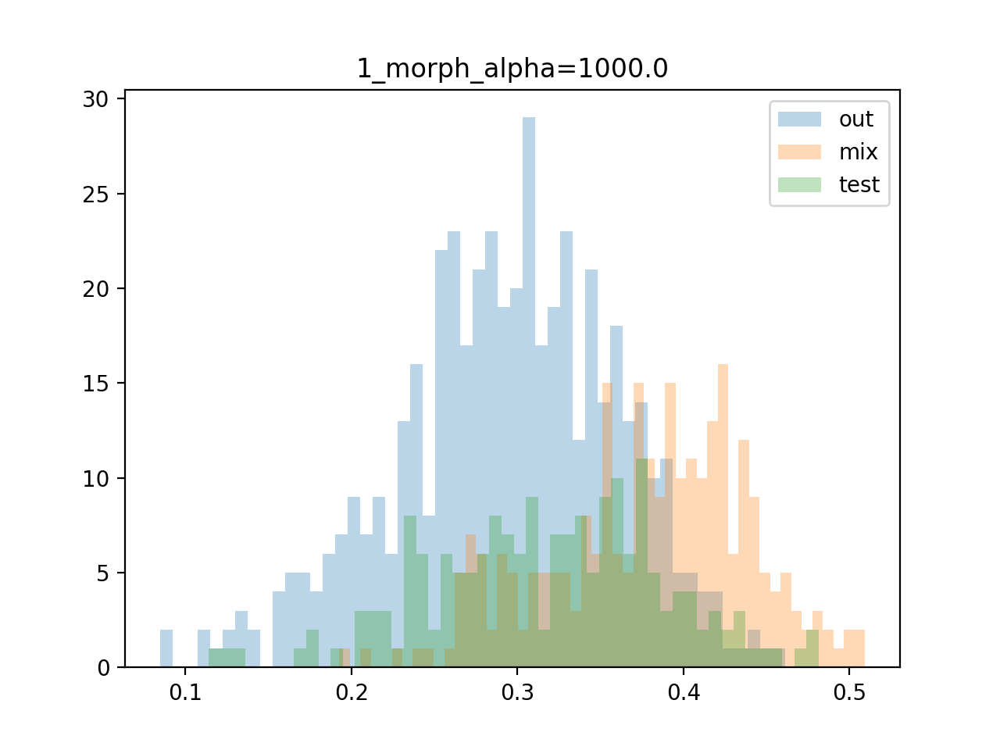

<IPython.core.display.Javascript object>


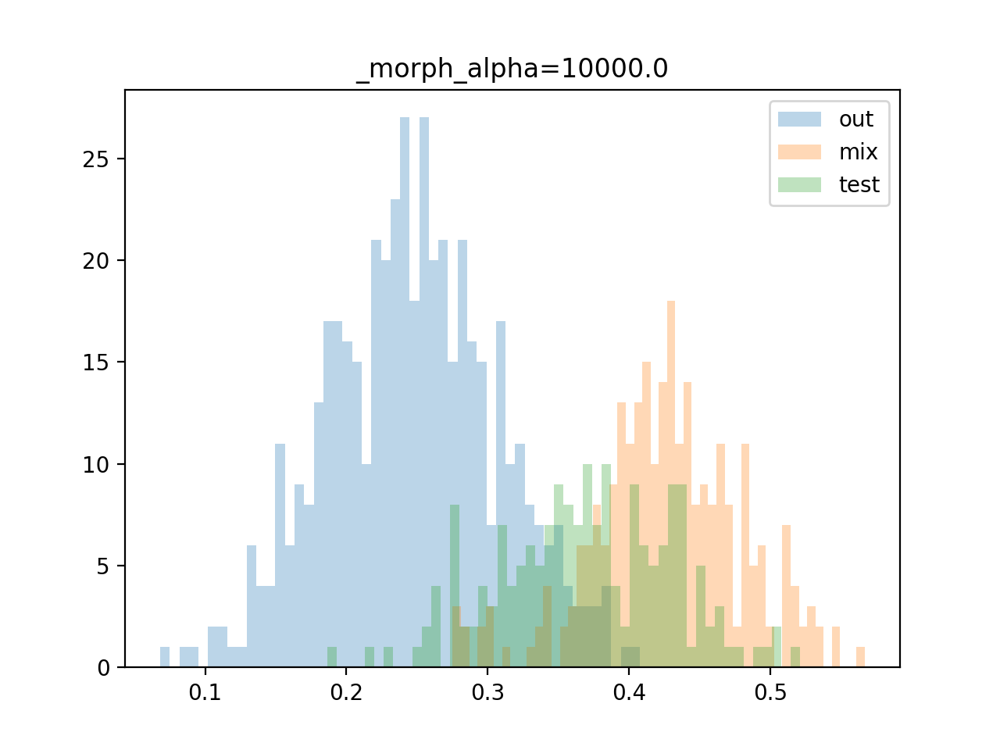

In [671]:
for model in fdl_results:
    plot_pearson(fdl_results[model], model[-20:], factor=50)

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


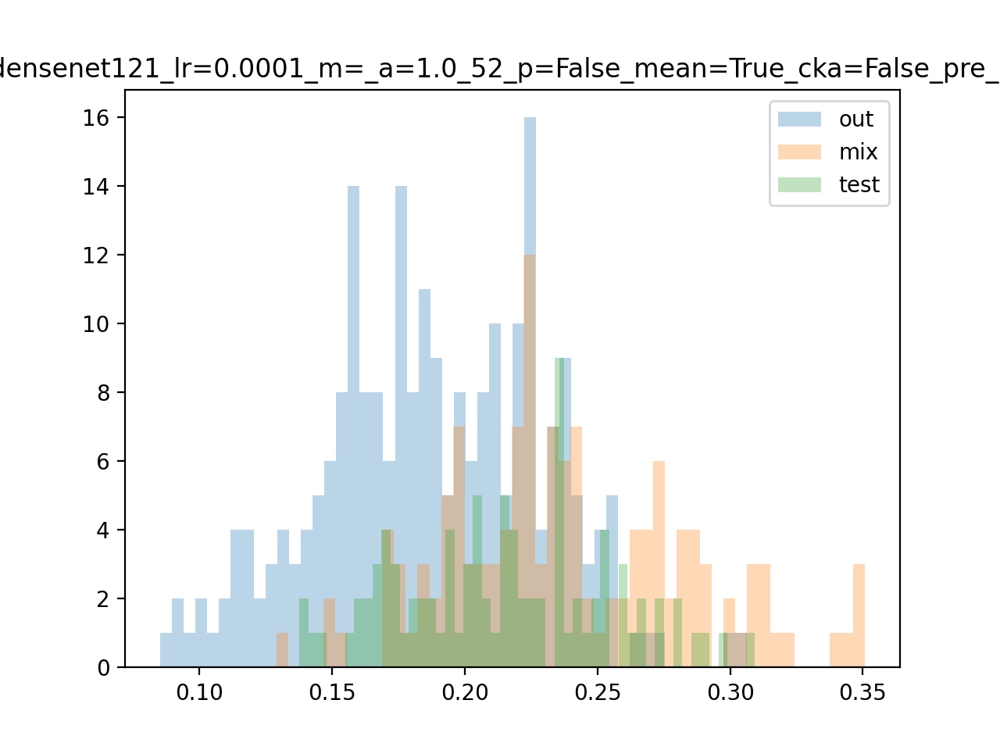

<IPython.core.display.Javascript object>


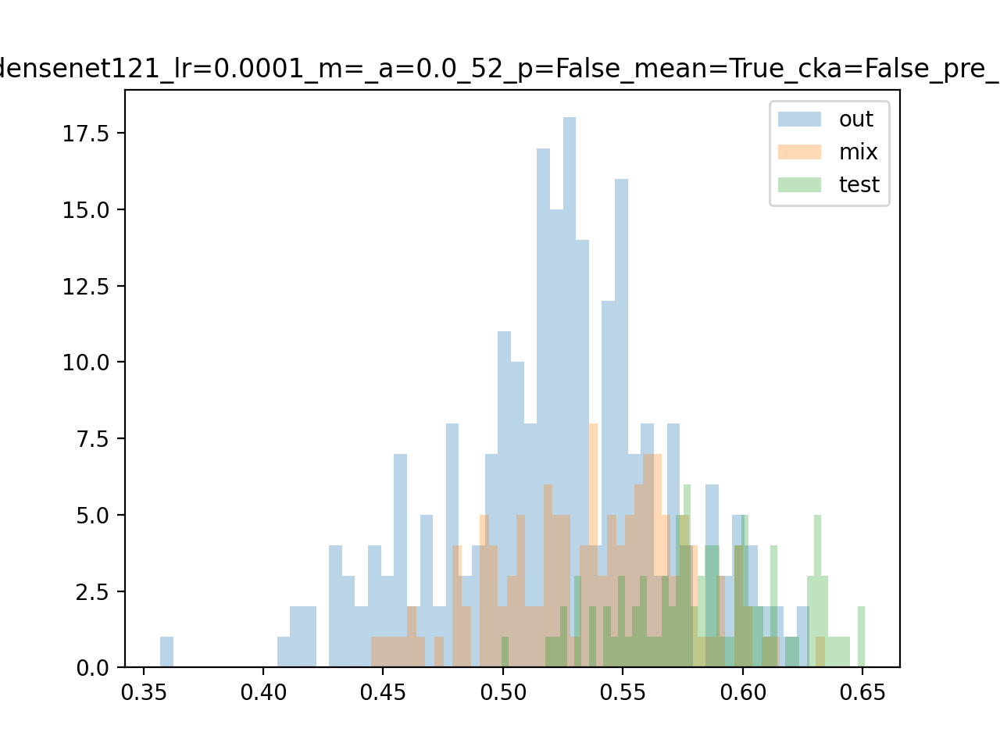

<IPython.core.display.Javascript object>


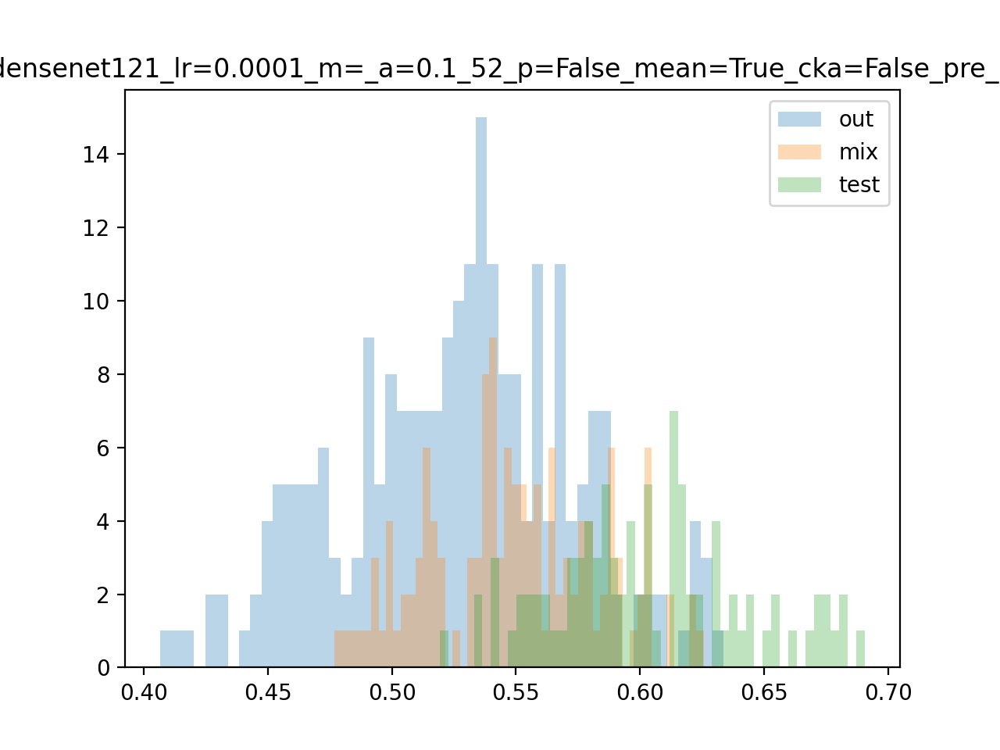

<IPython.core.display.Javascript object>


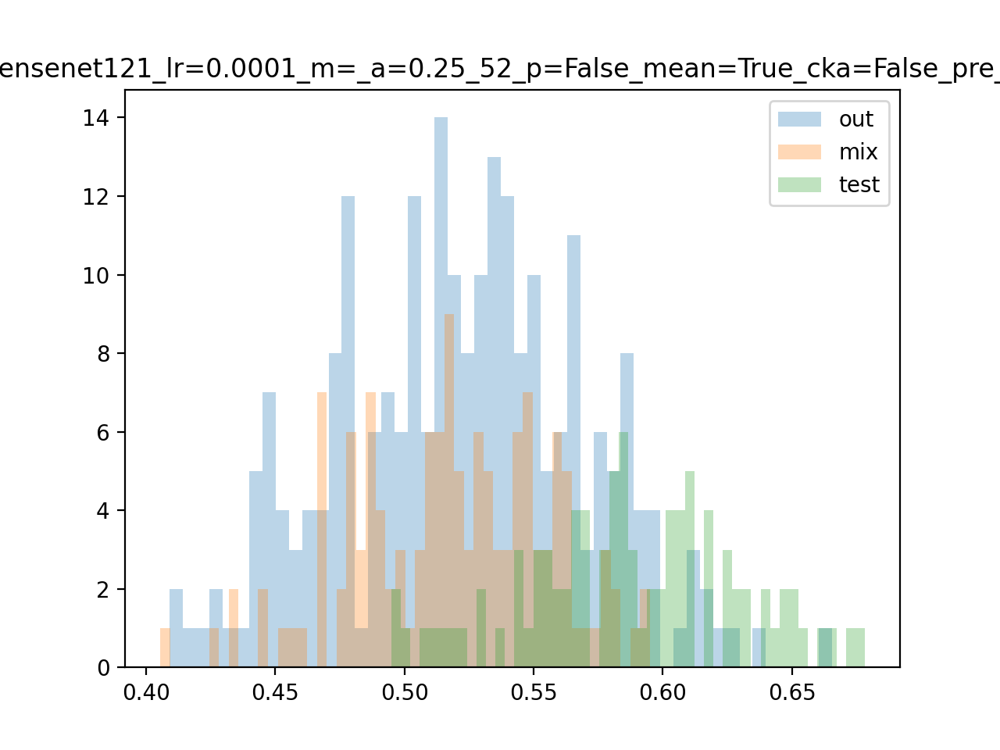

<IPython.core.display.Javascript object>


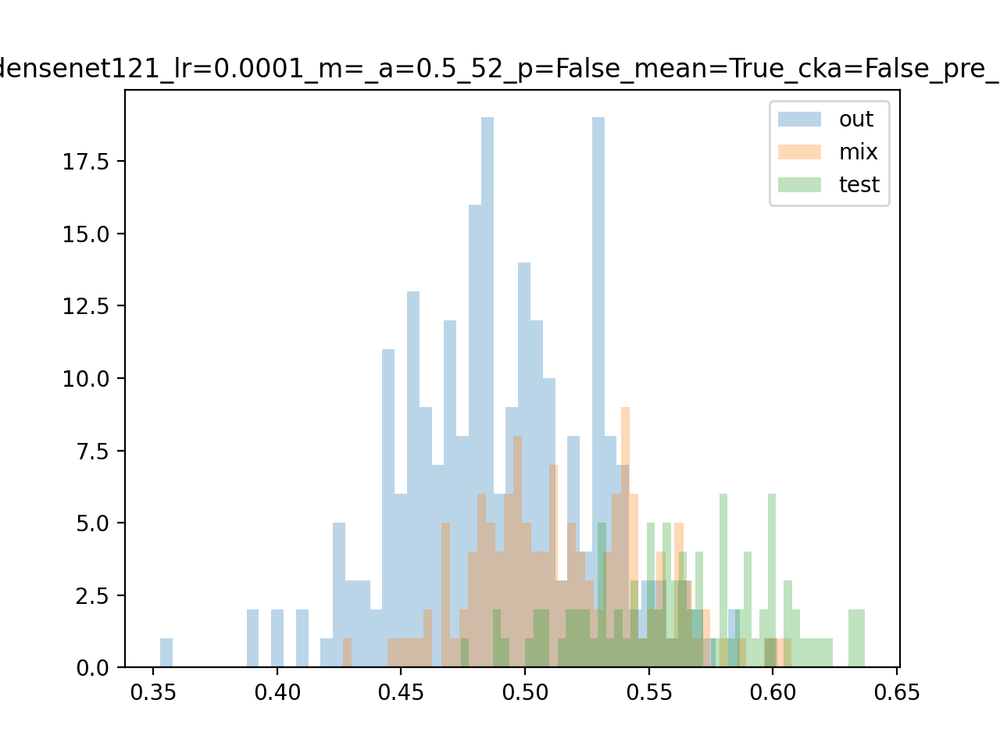

In [669]:
for model in joint_results:
    plot_pearson(joint_results[model], model, factor=100)

### Checking mixed batches

In [862]:
def get_cka_two_batch(thetas_a, thetas_b, batch_a=2, batch_b=2, a_const=10, n_samples=1000):
    thetas_a = torch.Tensor(thetas_a)
    thetas_b = torch.Tensor(thetas_b)
    a_inds = multidimensional_shifting(len(thetas_a[0]), batch_a, n_samples)
    b_inds = multidimensional_shifting(len(thetas_a[0]), batch_b, n_samples)
    
    hist_b = [np.mean([linear_CKA(torch.cat([thetas_a[i][ind_a], thetas_b[i][ind_b]]), 
                                  torch.cat([thetas_a[j][ind_a], thetas_b[j][ind_b]]))
                       for i,j in combinations(range(len(thetas_a)), 2)]) 
            for ind_a, ind_b in zip(a_inds, b_inds)]
    return np.array(hist_b)

In [863]:
def get_rejection_two(res, thresh=5, batch_a=2, batch_b=2, with_dist=False, return_means=False, plot=True, name=''):
    test_dist = get_cka(res['test'][0], batch=batch_a+batch_b)
    test_out_dist = get_cka_two_batch(res['test'][0], res['out'][0], batch_a=batch_a, batch_b=batch_b)
    test_in_out_dist = get_cka_two_batch(res['test'][0], res['in_out'][0], batch_a=batch_a, batch_b=batch_b)
    
    if return_means:
        return (test_out_dist.mean(), test_in_out_dist.mean(), test_dist.mean(), test_out_dist.std(), test_in_out_dist.std(), test_dist.std())
    
    percentile = np.percentile(test_dist, thresh)
    out_reject = (test_out_dist < percentile).mean()
    in_out_reject = (test_in_out_dist < percentile).mean()
    
    if plot:
        plt.figure()
    
        pd.Series(test_out_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(test_out_dist)) / len(test_out_dist), label='out_dist', density=True)
        pd.Series(test_in_out_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(test_in_out_dist)) / len(test_in_out_dist), label='mix', density=True)
        pd.Series(test_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(test_dist)) / len(test_dist), label='in_dist', density=True)

        plt.legend()
        plt.title(name)
        plt.xlabel('batch sim score')
        plt.ylabel('% of batches')
        plt.xlim((0,1))

        print("out_reject", out_reject)
        print("in_out_reject", in_out_reject)
    
    if with_dist:
        return out_reject, in_out_reject, (test_dist, test_out_dist, test_in_out_dist)
    else:
        return out_reject, in_out_reject

In [878]:
def get_cka_two_batch(thetas_a, thetas_b, batch_a=2, batch_b=2, a_const=10, n_samples=1000):
    thetas_a = torch.Tensor(thetas_a)
    thetas_b = torch.Tensor(thetas_b)
    a_inds = multidimensional_shifting(len(thetas_a[0]), batch_a+batch_b, n_samples)
    b_inds = multidimensional_shifting(len(thetas_a[0]), batch_b, n_samples)
    
    hist_a = [np.mean([linear_CKA(thetas_a[i][ind_a], thetas_a[j][ind_a])
                       for i,j in combinations(range(len(thetas_a)), 2)]) for ind_a in a_inds] 
    
    hist_b = [np.mean([linear_CKA(torch.cat([thetas_a[i][ind_a[:-batch_b]], thetas_b[i][ind_b]]), 
                                  torch.cat([thetas_a[j][ind_a[:-batch_b]], thetas_b[j][ind_b]]))
                       for i,j in combinations(range(len(thetas_a)), 2)]) 
            for ind_a, ind_b in zip(a_inds, b_inds)]
    return np.array(hist_a), np.array(hist_b)

In [923]:
def get_cka_two_batch(thetas_a, thetas_b, batch_a=2, batch_b=2, a_const=10, n_samples=2000, seed=0):
    thetas_a = torch.Tensor(thetas_a)
    thetas_b = torch.Tensor(thetas_b)
    a_inds = multidimensional_shifting(len(thetas_a[0]), batch_a, n_samples, seed=seed)
    ind_a_const = next(iter(a_inds)) # consta a batch
    
    a_inds = multidimensional_shifting(len(thetas_a[0]), batch_b, n_samples)
    b_inds = multidimensional_shifting(len(thetas_b[0]), batch_b, n_samples)
    
    hist_a = [np.mean([linear_CKA(torch.cat([thetas_a[i][ind_a_const], thetas_a[i][ind_a]]), 
                                  torch.cat([thetas_a[j][ind_a_const], thetas_a[j][ind_a]]))
                       for i,j in combinations(range(len(thetas_a)), 2)]) 
                for ind_a in a_inds]
    
    hist_b = [np.mean([linear_CKA(torch.cat([thetas_a[i][ind_a_const], thetas_b[i][ind_b]]), 
                                  torch.cat([thetas_a[j][ind_a_const], thetas_b[j][ind_b]]))
                       for i,j in combinations(range(len(thetas_a)), 2)]) 
            for ind_b in b_inds]
    return np.array(hist_a), np.array(hist_b)

In [934]:
def get_rejection_two(res, thresh=5, batch_a=2, batch_b=2, with_dist=False, return_means=False, plot=True, name=''):
    test_dist_out, test_out_dist = get_cka_two_batch(res['test'][0], res['out'][0], batch_a=batch_a, batch_b=batch_b)
    test_dist_in, test_in_out_dist = get_cka_two_batch(res['test'][0], res['in_out'][0], batch_a=batch_a, batch_b=batch_b)
    
    if return_means:
        return (test_out_dist.mean(), test_in_out_dist.mean(), test_dist.mean(), test_out_dist.std(), test_in_out_dist.std(), test_dist.std())
    
    out_reject = (test_out_dist < np.percentile(test_dist_out, thresh)).mean()
    in_out_reject = (test_in_out_dist < np.percentile(test_dist_in, thresh)).mean()
    print(out_reject, in_out_reject)
    
    if plot:
        plt.figure()
    
        pd.Series(test_dist_out).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(test_dist_out)) / len(test_dist_out), label='in_dist', density=True)
        pd.Series(test_out_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(test_out_dist)) / len(test_out_dist), label='in_dist_and_ood', density=True)

        plt.legend()
        plt.title(name)
        plt.xlabel('batch sim score')
        plt.ylabel('% of batches')
        #plt.xlim((0,1))

        plt.figure()
    
        pd.Series(test_dist_in).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(test_dist_in)) / len(test_dist_in), label='in_dist', density=True)
        pd.Series(test_in_out_dist).hist(bins=20, grid=False, alpha=.3, weights=np.ones(len(test_in_out_dist)) / len(test_in_out_dist), label='in_dist_and_mix', density=True)

        plt.legend()
        plt.title(name)
        plt.xlabel('batch sim score')
        plt.ylabel('% of batches')
        #plt.xlim((0,1))
    
    return out_reject, in_out_reject

In [943]:
model

'work_space/save/CheXpert/FDL/2020-06-22_08:04_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0'

In [938]:
records = [dict(), dict()]

In [942]:
for batch_a in tqdm([1, 10, 25, 50, 100], total=5):
    for batch_b in tqdm([1, 10, 25, 50, 100], total=5):
        out_reject, in_out_reject = \
        get_rejection_two(fdl_results[model], with_dist=True, name='test', batch_a=batch_a, batch_b=batch_b, plot=False)
        records[0][batch_a] = records[0].get(batch_a, None) or dict()
        records[0][batch_a][batch_b] = out_reject
        records[1][batch_a] = records[1].get(batch_a, None) or dict()
        records[1][batch_a][batch_b] = in_out_reject

0.0 0.0
0.2325 0.0905
0.434 0.346
0.631 0.6715
0.882 0.9435



0.054 0.0405
0.1795 0.038
0.369 0.138
0.6045 0.4255
0.8715 0.8705



0.054 0.0445
0.123 0.1415
0.22 0.328
0.46 0.6415
0.803 0.94



0.0675 0.0485
0.1605 0.091
0.28 0.2265
0.492 0.478
0.813 0.873



0.0675 0.0515
0.181 0.092
0.282 0.208
0.4795 0.4195
0.8095 0.8425




/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


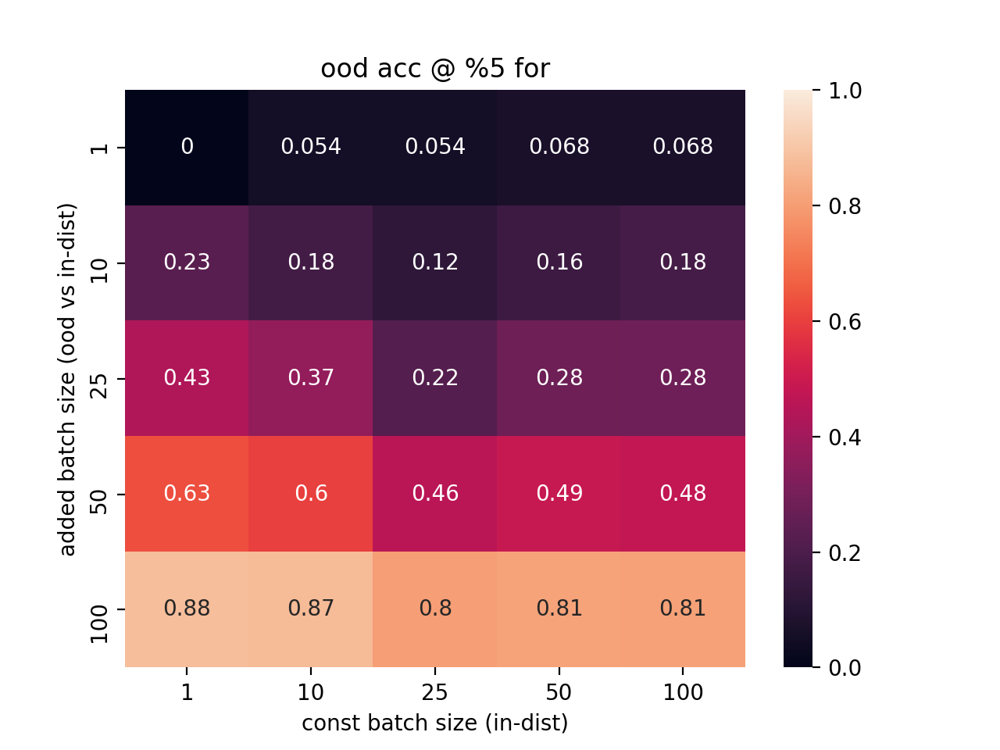

<IPython.core.display.Javascript object>


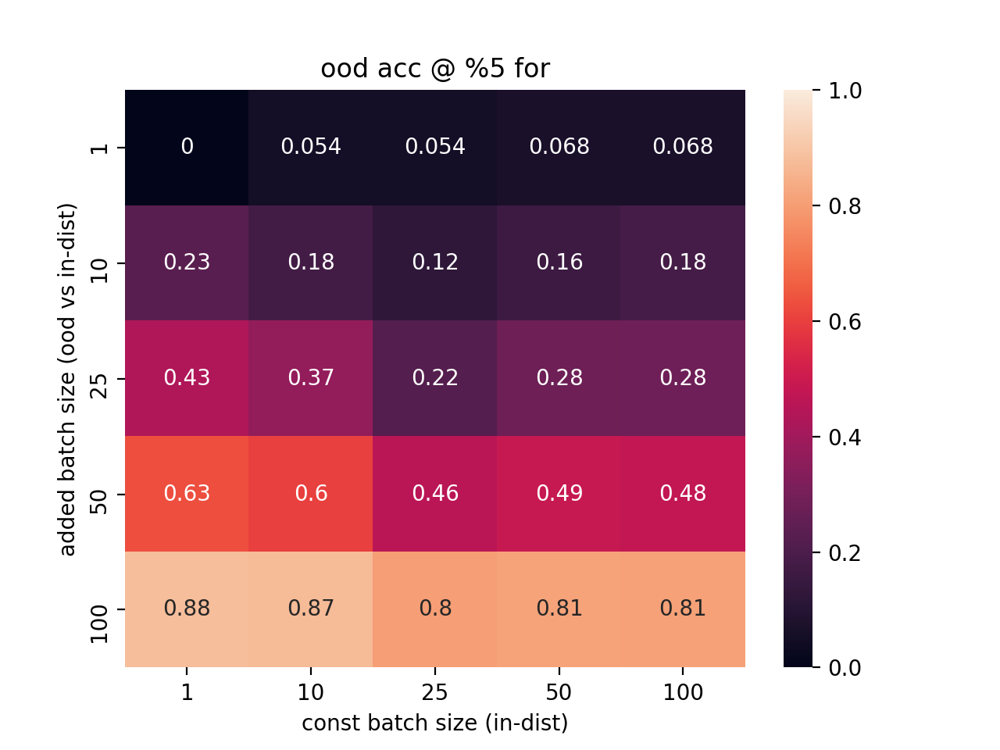

Text(0.5, 23.52222222222222, 'const batch size (in-dist)')

Text(50.722222222222214, 0.5, 'added batch size (ood vs in-dist)')

Text(0.5, 1.0, 'ood acc @ %5 for')

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


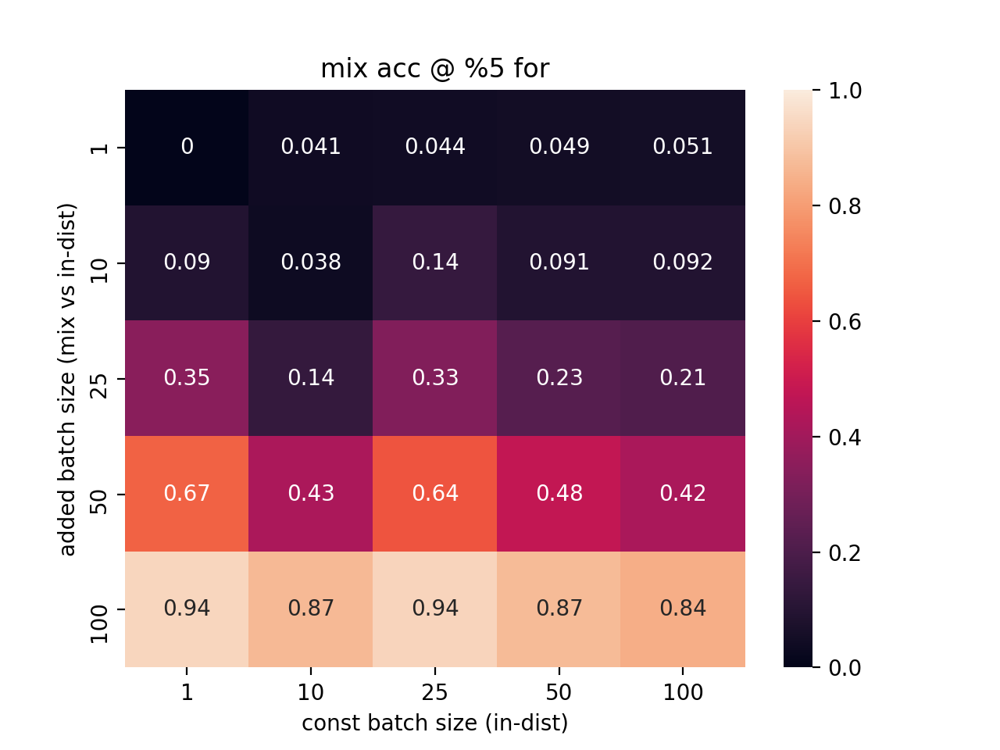

<IPython.core.display.Javascript object>


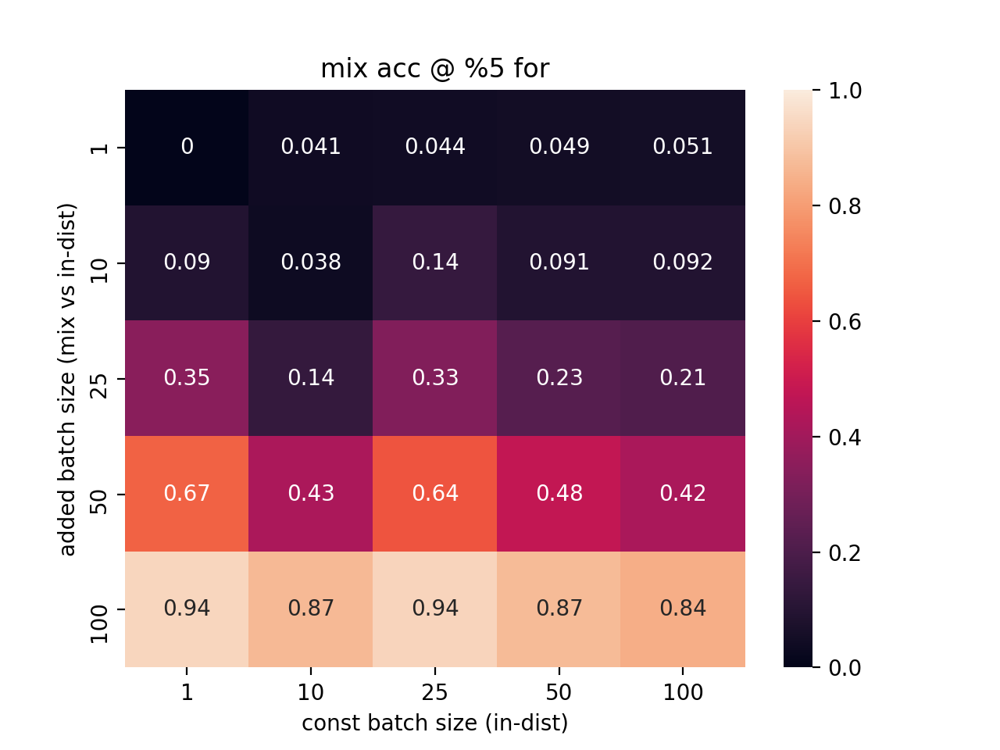

Text(0.5, 23.52222222222222, 'const batch size (in-dist)')

Text(50.722222222222214, 0.5, 'added batch size (mix vs in-dist)')

Text(0.5, 1.0, 'mix acc @ %5 for')

In [951]:
plt.figure()
sns.heatmap(pd.DataFrame.from_dict(records[0]), annot=True, vmin=0, vmax=1)
plt.xlabel('const batch size (in-dist)')
plt.ylabel('added batch size (ood vs in-dist)')
plt.title('ood acc @ %5 for')

plt.figure()
sns.heatmap(pd.DataFrame.from_dict(records[1]), annot=True, vmin=0, vmax=1)
plt.xlabel('const batch size (in-dist)')
plt.ylabel('added batch size (mix vs in-dist)')
plt.title('mix acc @ %5 for')

### augmentations

In [35]:
def load_n_loader(dataset, n=10, limit=1000, per_batch=1):
    subset_indices = np.arange(len(dataset))
    np.random.shuffle(subset_indices)
    subset_indices = np.repeat(subset_indices[:limit], n) # select your indices here as a list
    subset = torch.utils.data.Subset(dataset, subset_indices)
    testloader_subset = torch.utils.data.DataLoader(subset, batch_size=n*per_batch, num_workers=0, shuffle=False)
    return testloader_subset

In [981]:
# for each sample, run embbeding of n=[1, 10, 25, 50, 100] augmentations
# add to a const batch and calculate scor
# agregate by type and try to seperate histograms

In [959]:
test.dataset.transform

Compose(
    RandomResizedCrop(size=(224, 224), scale=(0.8, 1), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
    RandomHorizontalFlip(p=0.5)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)

In [34]:
def get_cka_loader(thetas_a, dataset, batche_sizes=(1,10,25,50,100), n_samples=1000, seed=0):
    basic_model = model_dir +'/'+"FDL/2020-06-09_09:05_n=1_densenet121_lr=0.0001_m=__55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1"
    diverse_model = 'work_space/save/CheXpert/FDL/2020-06-22_08:04_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0'
    basic_model_path = [os.path.join(basic_model, model_path) for model_path in  
                   os.listdir(basic_model) if 'model' in model_path]
    diverse_model_path = [os.path.join(diverse_model, model_path) for model_path in 
                     os.listdir(diverse_model) if 'model' in model_path]
    fdl_div_model = basic_model_path + diverse_model_path

    models = [get_model(model).to('cuda') for model in fdl_div_model]
    thetas_a = torch.Tensor(thetas_a)
    batche_sizes = list(batche_sizes)
    
    records_a = dict()
    const_a_sets = dict()
    for batch_a in batche_sizes:
        a_inds = multidimensional_shifting(len(thetas_a[0]), batch_a, n_samples, seed=seed)
        ind_a_const = next(iter(a_inds)) # const a batch
        const_a_sets[batch_a] = ind_a_const
        
    for batch_a in batche_sizes:
        ind_a_const = const_a_sets[batch_a]
        for batch_b in batche_sizes:        
            a_inds = multidimensional_shifting(len(thetas_a[0]), batch_b, n_samples)
            hist_a = [np.mean([linear_CKA(torch.cat([thetas_a[i][ind_a_const], thetas_a[i][ind_a]]), 
                                          torch.cat([thetas_a[j][ind_a_const], thetas_a[j][ind_a]]))
                               for i,j in combinations(range(len(thetas_a)), 2)]) 
                        for ind_a in a_inds]
            records_a[batch_a] = records_a.get(batch_a, None) or dict()
            records_a[batch_a][batch_b] = np.array(hist_a)
    
    records_b = dict()
    n_loader = load_n_loader(out_out.dataset, n=batche_sizes[-1], limit=n_samples)
    for imgs, label, path in tqdm(n_loader, total=len(n_loader)):
        thetas_b = [model(imgs.cuda()).detach().cpu() for model in models]
        for batch_a in batche_sizes:
            ind_a_const = const_a_sets[batch_a]
            records_b[batch_a] = records_b.get(batch_a, None) or dict()
            for batch_b in batche_sizes:
                
                score = np.mean([linear_CKA(torch.cat([thetas_a[i][ind_a_const], thetas_b[i][:batch_b]]), 
                                      torch.cat([thetas_a[j][ind_a_const], thetas_b[j][:batch_b]]))
                                                 for i,j in combinations(range(len(thetas_a)), 2)])
                records_b[batch_a][batch_b] = records_b.get(batch_a).get(batch_b, None) or []
                records_b[batch_a][batch_b].append(score)
     
    for batch_a in batche_sizes:
        for batch_b in batche_sizes:
            records_b[batch_a][batch_b] = np.array(records_b[batch_a][batch_b])
                      
    return records_a, records_b

In [131]:
def get_rejection_loader(res, thresh=5):
    batche_sizes = (1,10,25,50,100)
    test_dist_out, test_out_dist = get_cka_loader(res['test'][0], out_out.dataset, batche_sizes=batche_sizes)
    test_dist_in, test_in_out_dist = get_cka_loader(res['test'][0], in_out.dataset, batche_sizes=batche_sizes)
    test_dist_test, test_test_dist = get_cka_loader(res['test'][0], test.dataset, batche_sizes=batche_sizes)
    
    records = [dict(), dict(), dict()]
    batche_sizes = list(batche_sizes)
    for batch_a in batche_sizes:
        for batch_b in batche_sizes:
            out_reject = (test_out_dist[batch_a][batch_b] < 
                          np.percentile(test_dist_out[batch_a][batch_b], thresh)).mean()
            in_out_reject = (test_in_out_dist[batch_a][batch_b] < 
                             np.percentile(test_dist_in[batch_a][batch_b], thresh)).mean()
            test_reject = (test_test_dist[batch_a][batch_b] < 
                             np.percentile(test_dist_test[batch_a][batch_b], thresh)).mean()
            
            records[0][batch_a] = records[0].get(batch_a, None) or dict()
            records[0][batch_a][batch_b] = out_reject
            records[1][batch_a] = records[1].get(batch_a, None) or dict()
            records[1][batch_a][batch_b] = in_out_reject 
            records[2][batch_a] = records[2].get(batch_a, None) or dict()
            records[2][batch_a][batch_b] = test_reject
            
    
    return (records, test_dist_out, test_out_dist, test_dist_in, test_in_out_dist, test_dist_test, test_test_dist)

In [33]:
model = list(fdl_results.keys())[0]

In [133]:
records, test_dist_out, test_out_dist, test_dist_in, test_in_out_dist, test_dist_test, test_test_dist = get_rejection_loader(fdl_results[model])

In [142]:
batche_sizes = list((1,10,25,50,100))
for batch_a in batche_sizes:
    for batch_b in batche_sizes:
        out_reject = (test_out_dist[batch_a][batch_b] < 
                      np.percentile(test_dist_out[batch_a][batch_b], thresh)).mean()
        in_out_reject = (test_in_out_dist[batch_a][batch_b] < 
                         np.percentile(test_dist_in[batch_a][batch_b], thresh)).mean()
        test_reject = (test_test_dist[batch_a][batch_b] < 
                         np.percentile(test_dist_test[batch_a][batch_b], thresh)).mean()

        records[0][batch_a] = records[0].get(batch_a, None) or dict()
        records[0][batch_a][batch_b] = out_reject
        records[1][batch_a] = records[1].get(batch_a, None) or dict()
        records[1][batch_a][batch_b] = in_out_reject 
        records[2][batch_a] = records[2].get(batch_a, None) or dict()
        records[2][batch_a][batch_b] = test_reject

<IPython.core.display.Javascript object>


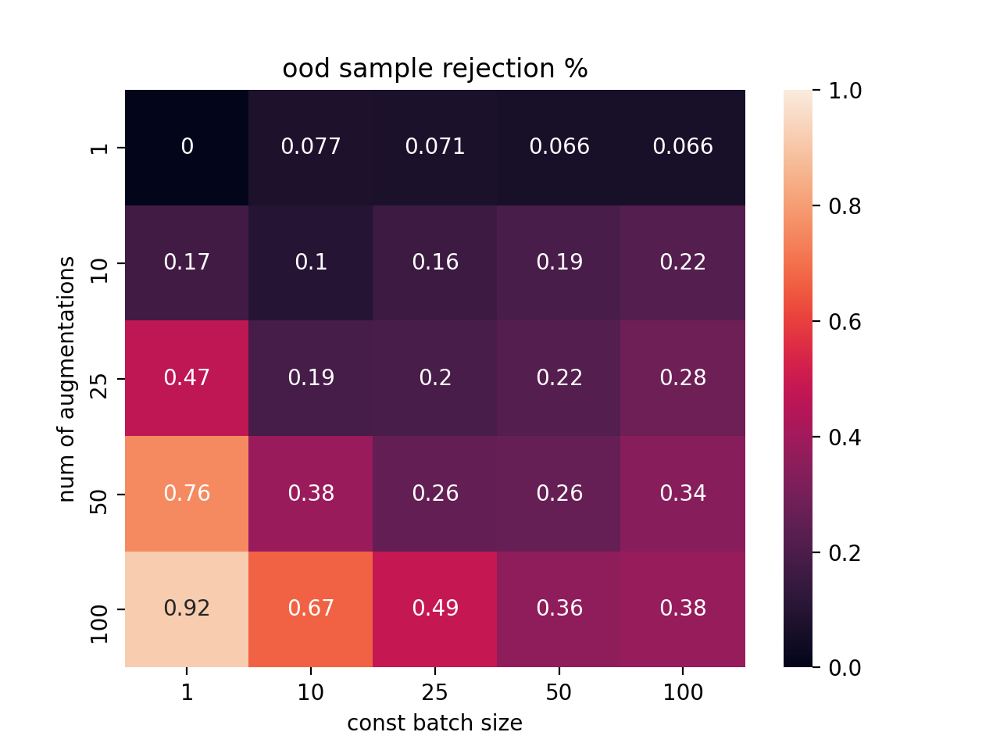

<IPython.core.display.Javascript object>


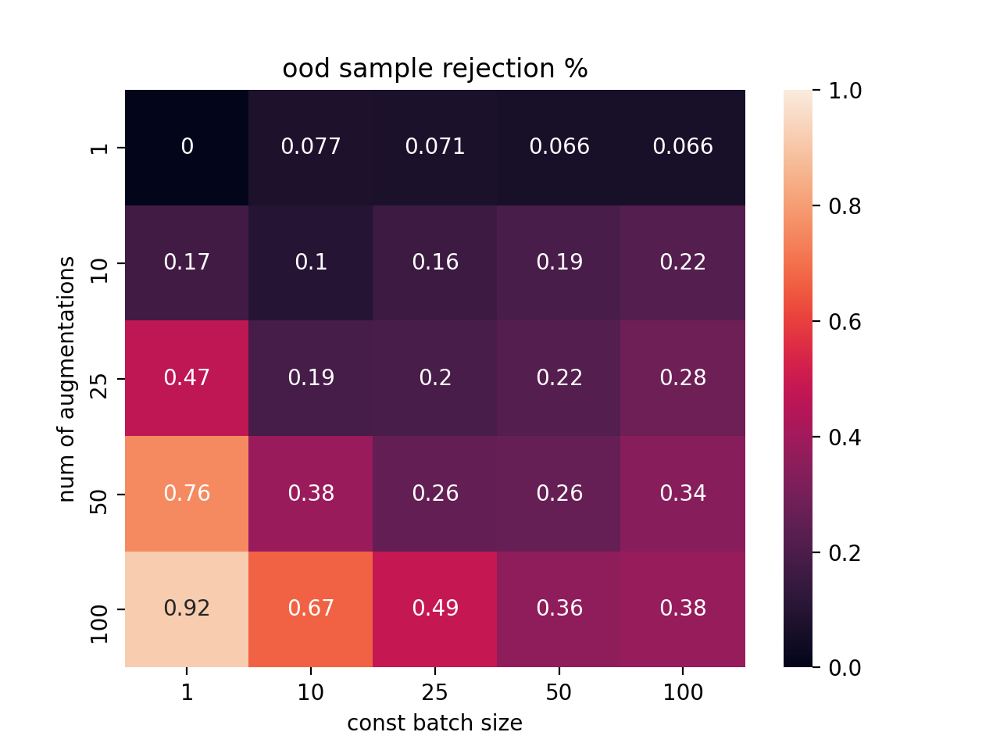

Text(0.5, 23.52222222222222, 'const batch size')

Text(50.722222222222214, 0.5, 'num of augmentations')

Text(0.5, 1.0, 'ood sample rejection %')

In [146]:
plt.figure()
sns.heatmap(pd.DataFrame.from_dict(records[0]), annot=True, vmin=0, vmax=1)
plt.xlabel('const batch size')
plt.ylabel('num of augmentations')
plt.title('ood sample rejection %')

<IPython.core.display.Javascript object>


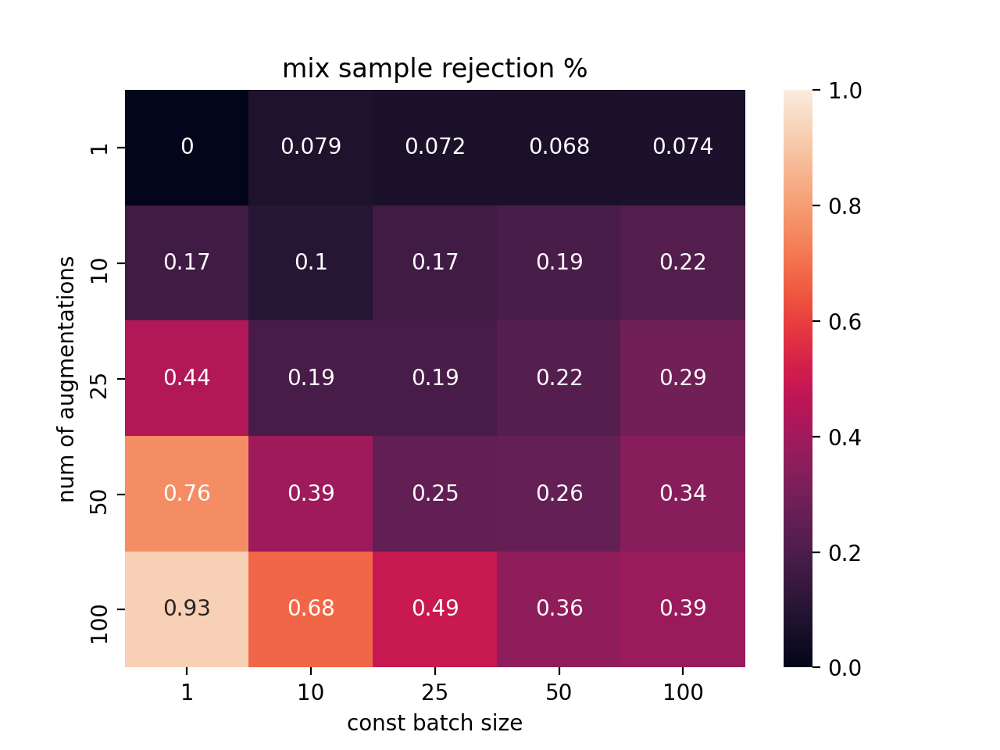

<IPython.core.display.Javascript object>


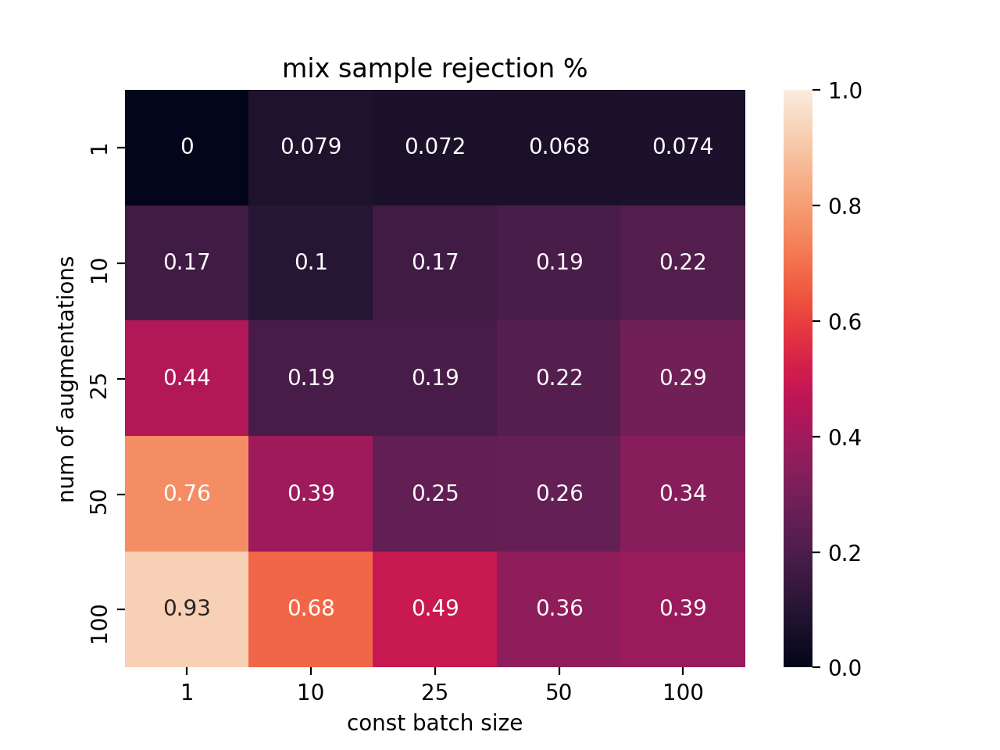

Text(0.5, 23.52222222222222, 'const batch size')

Text(50.722222222222214, 0.5, 'num of augmentations')

Text(0.5, 1.0, 'mix sample rejection %')

In [147]:
plt.figure()
sns.heatmap(pd.DataFrame.from_dict(records[1]), annot=True, vmin=0, vmax=1)
plt.xlabel('const batch size')
plt.ylabel('num of augmentations')
plt.title('mix sample rejection %')

<IPython.core.display.Javascript object>


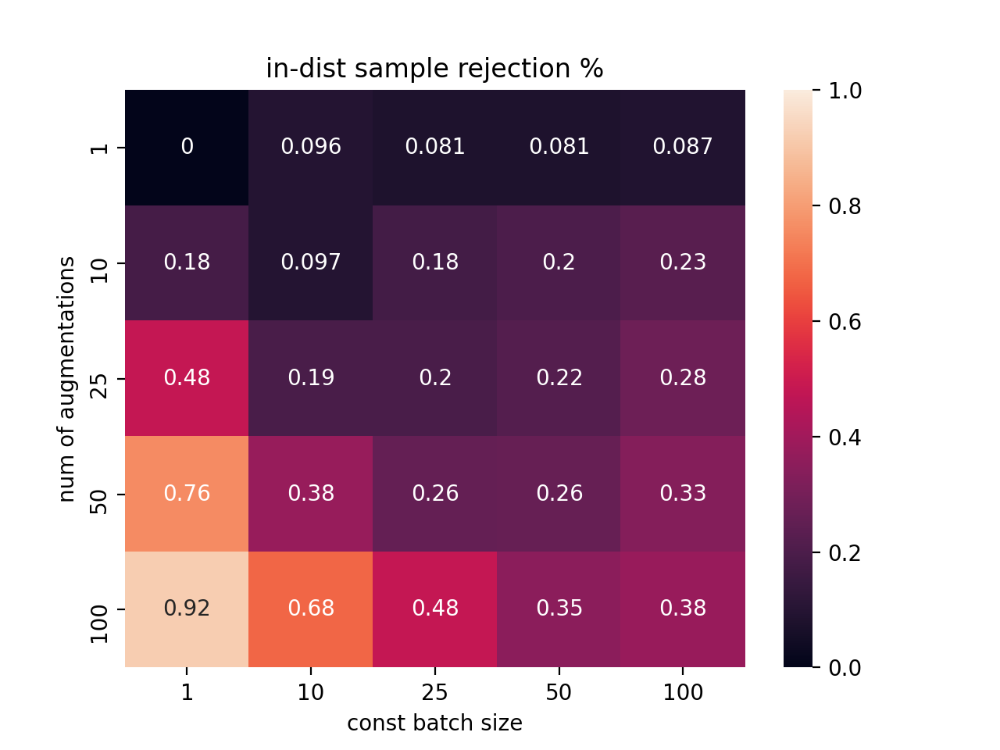

<IPython.core.display.Javascript object>


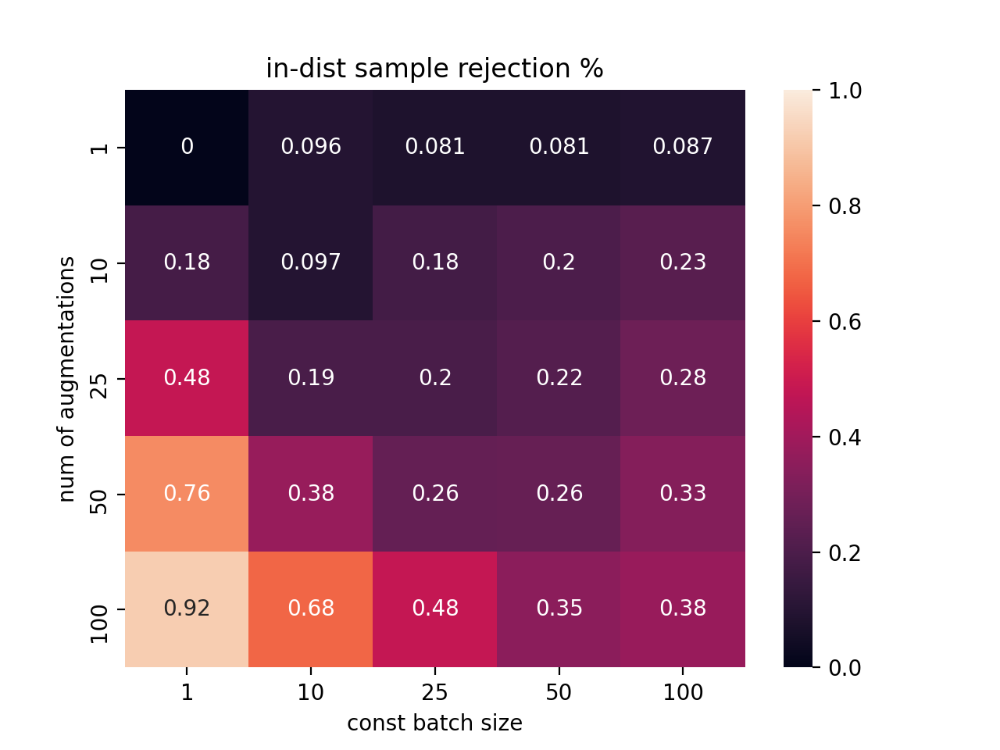

Text(0.5, 23.52222222222222, 'const batch size')

Text(50.722222222222214, 0.5, 'num of augmentations')

Text(0.5, 1.0, 'in-dist sample rejection %')

In [148]:
plt.figure()
sns.heatmap(pd.DataFrame.from_dict(records[2]), annot=True, vmin=0, vmax=1)
plt.xlabel('const batch size')
plt.ylabel('num of augmentations')
plt.title('in-dist sample rejection %')

<IPython.core.display.Javascript object>


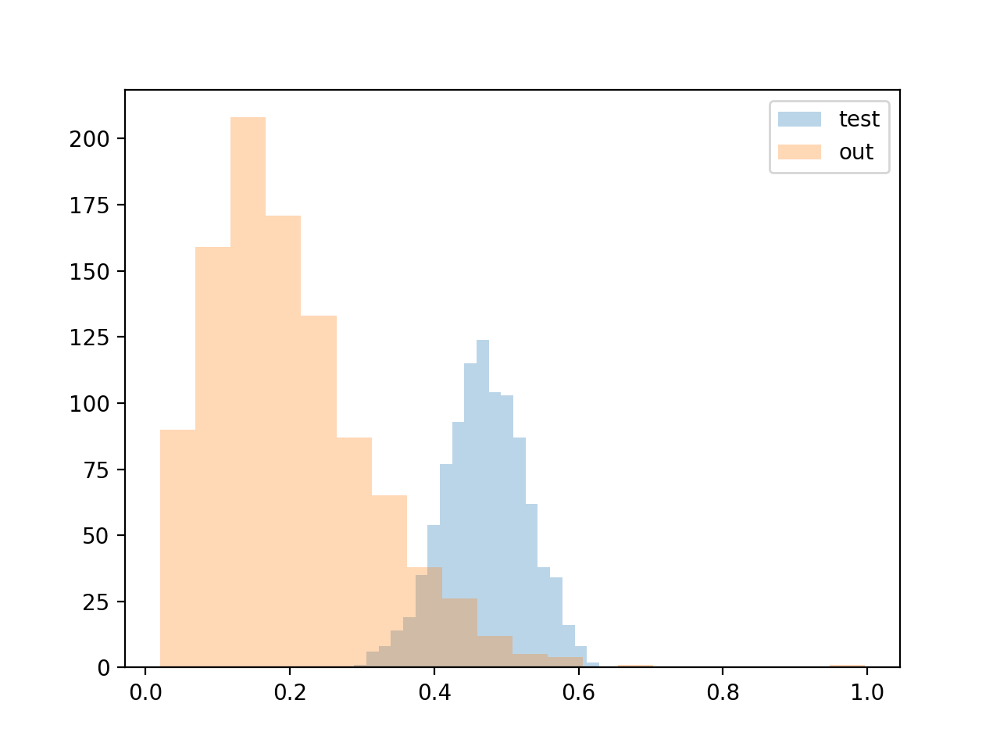

<IPython.core.display.Javascript object>


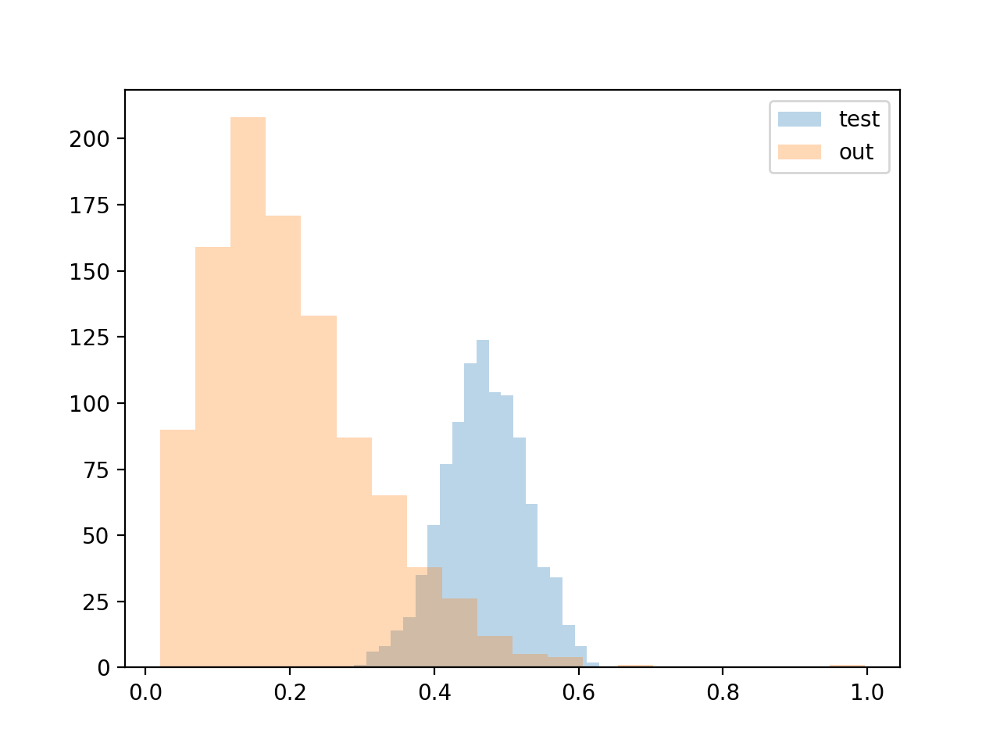

In [126]:
plt.close()
plt.figure()
pd.Series(test_dist_out[1][100]).hist(bins=20, alpha=0.3, grid=False, label='test')
pd.Series(test_out_dist[1][100]).hist(bins=20, alpha=0.3, grid=False, label='out')
plt.legend()

<IPython.core.display.Javascript object>


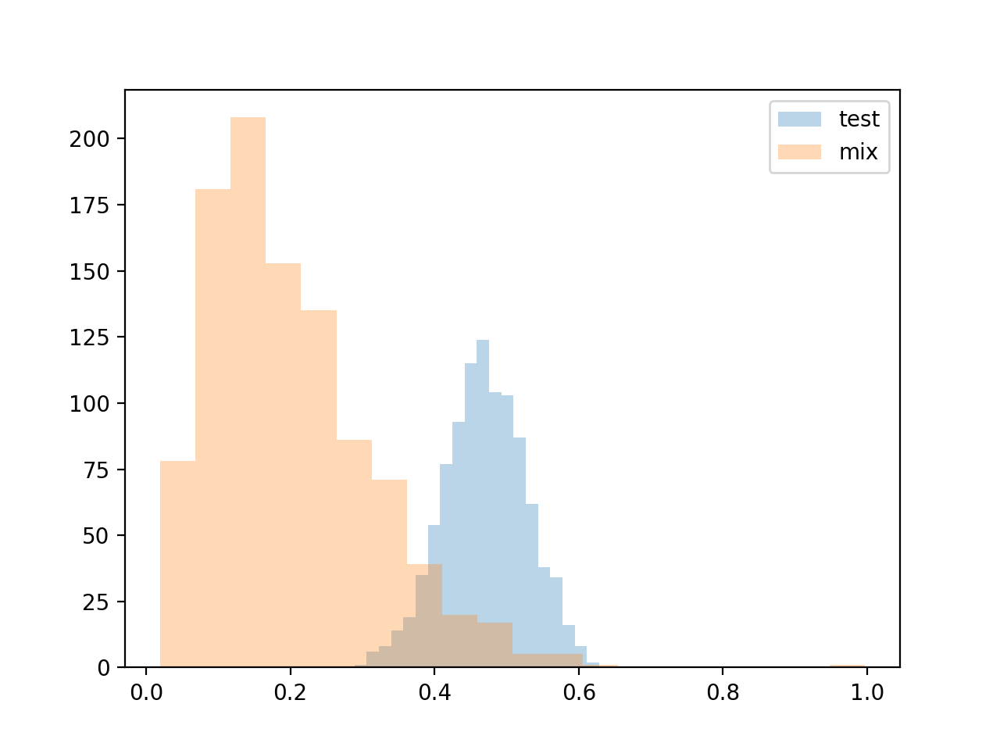

<IPython.core.display.Javascript object>


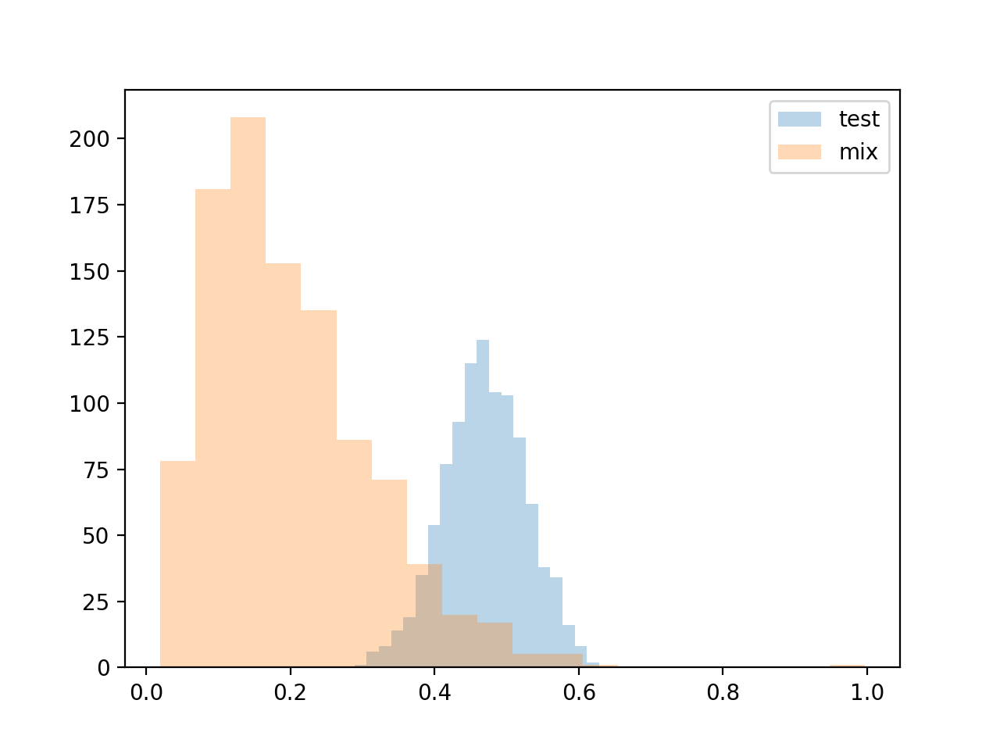

In [128]:
plt.close()
plt.figure()
pd.Series(test_dist_in[1][100]).hist(bins=20, alpha=0.3, grid=False, label='test')
pd.Series(test_in_out_dist[1][100]).hist(bins=20, alpha=0.3, grid=False, label='mix')
plt.legend()

<IPython.core.display.Javascript object>


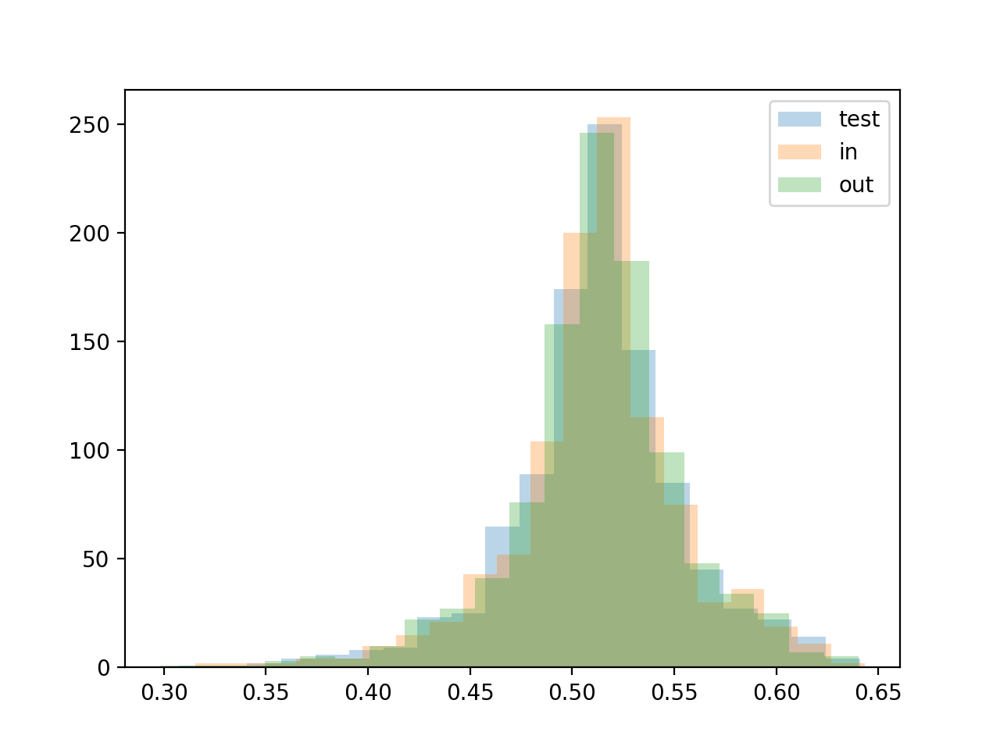

<IPython.core.display.Javascript object>


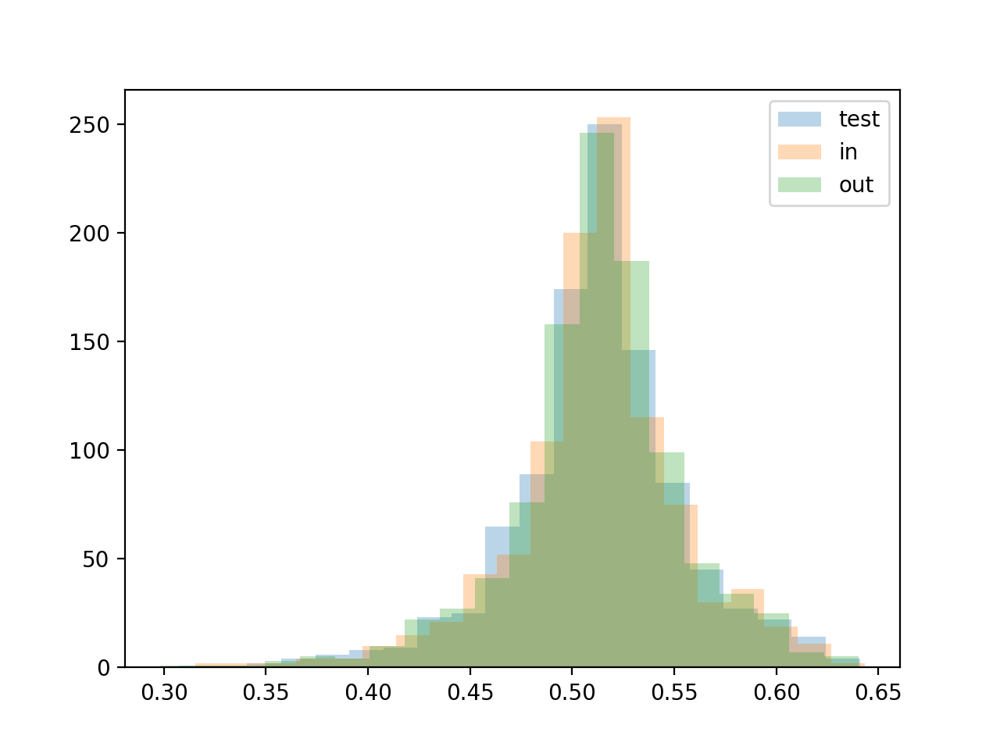

In [157]:
plt.close()
plt.figure()
pd.Series(test_test_dist[100][10]).hist(bins=20, alpha=0.3, grid=False, label='test')
pd.Series(test_in_out_dist[100][10]).hist(bins=20, alpha=0.3, grid=False, label='in')
pd.Series(test_out_dist[100][10]).hist(bins=20, alpha=0.3, grid=False, label='out')
plt.legend()

<IPython.core.display.Javascript object>


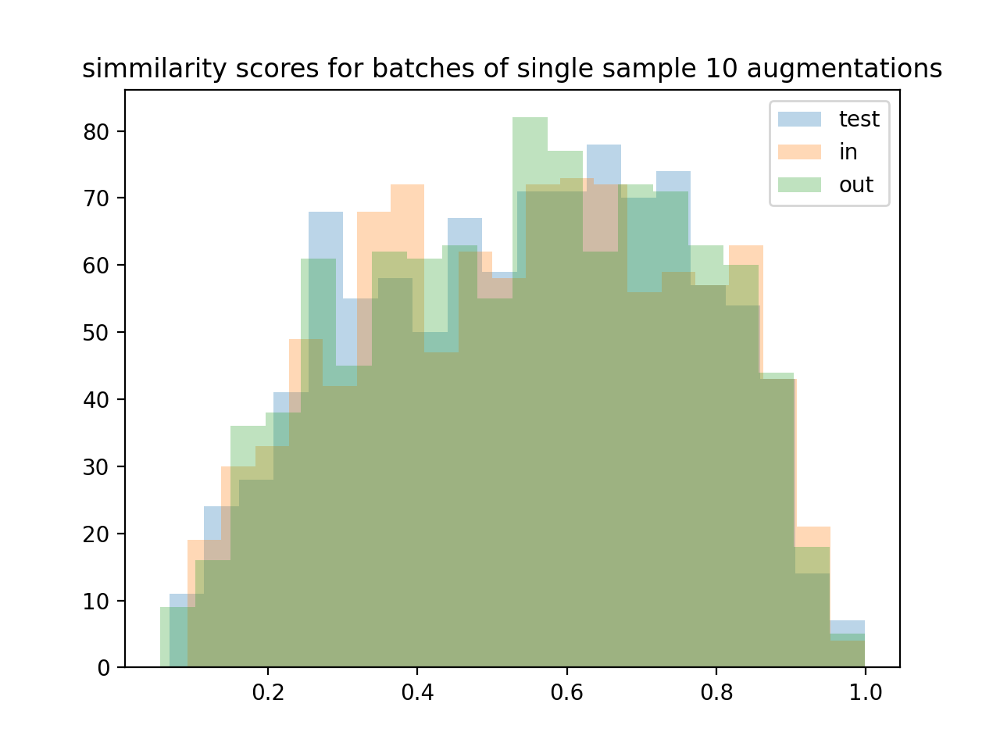

<IPython.core.display.Javascript object>


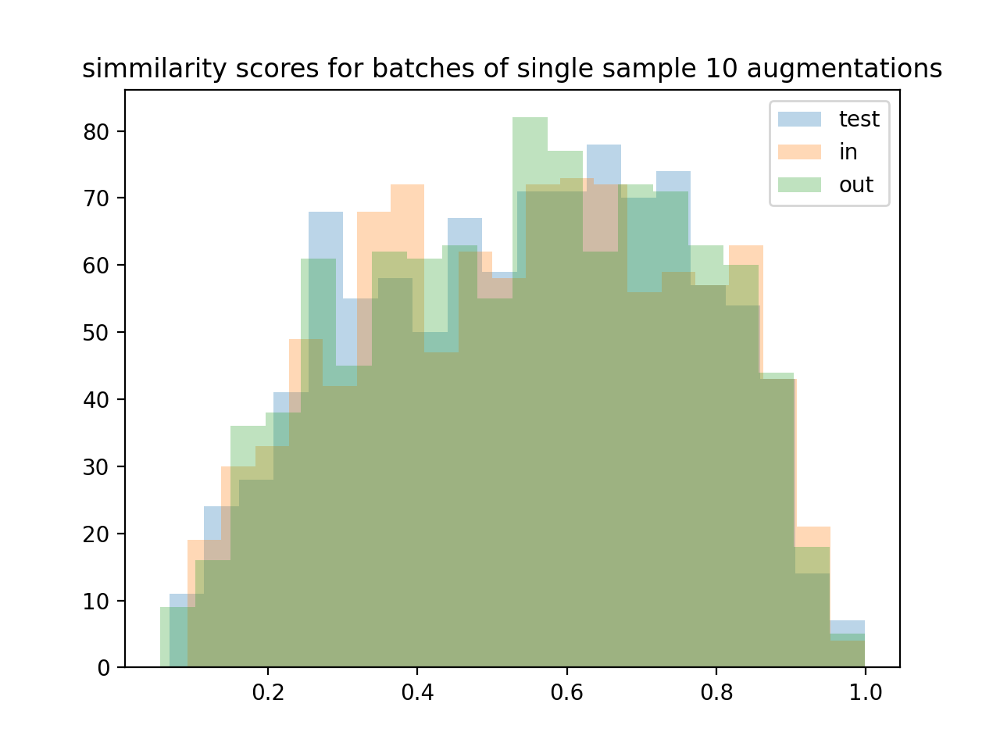

Text(0.5, 1.0, 'simmilarity scores for batches of single sample 10 augmentations')

In [160]:
plt.close()
plt.figure()
pd.Series(test_test_dist[1][10]).hist(bins=20, alpha=0.3, grid=False, label='test')
pd.Series(test_in_out_dist[1][10]).hist(bins=20, alpha=0.3, grid=False, label='in')
pd.Series(test_out_dist[1][10]).hist(bins=20, alpha=0.3, grid=False, label='out')
plt.legend()
plt.title('simmilarity scores for batches of single sample 10 augmentations')

In [59]:
(np.ones((5,7)) - np.array(fdl_results[model]['calibration'][0])) / (0.5 - np.array(fdl_results[model]['calibration'][0]))

array([[2.82657524, 2.16932471, 7.09645849, 3.20716046, 2.79857582,
        2.79427784, 2.54979792],
       [2.82657524, 2.16932471, 7.09645849, 3.20716046, 2.79857582,
        2.79427784, 2.54979792],
       [2.82657524, 2.16932471, 7.09645849, 3.20716046, 2.79857582,
        2.79427784, 2.54979792],
       [2.82657524, 2.16932471, 7.09645849, 3.20716046, 2.79857582,
        2.79427784, 2.54979792],
       [2.82657524, 2.16932471, 7.09645849, 3.20716046, 2.79857582,
        2.79427784, 2.54979792]])

In [56]:
#def get_aug_res(batche_sizes=(1,10,25,50,100), n_samples=1000, thresh=5):
batche_sizes=(1,10,25,50,100) 
n_samples=1000
thresh=5
basic_model = model_dir +'/'+"FDL/2020-06-09_09:05_n=1_densenet121_lr=0.0001_m=__55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1"
diverse_model = 'work_space/save/CheXpert/FDL/2020-06-22_08:04_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0'
basic_model_path = [os.path.join(basic_model, model_path) for model_path in  
               os.listdir(basic_model) if 'model' in model_path]
diverse_model_path = [os.path.join(diverse_model, model_path) for model_path in 
                 os.listdir(diverse_model) if 'model' in model_path]
fdl_div_model = basic_model_path + diverse_model_path

models = [get_model(model).to('cuda') for model in fdl_div_model]

batche_sizes = list(batche_sizes)
calibration = np.array(fdl_results[model]['calibration'])
div = 0.5 - calibration

dists = []
for dataset in [test.dataset, out_out.dataset, in_out.dataset]:
    dat_hist = dict() 
    for size in batche_sizes: dat_hist[size] = []
    n_loader = load_n_loader(dataset, n=batche_sizes[-1], limit=n_samples, per_batch=1)
    #cka_emb_loss = CkaLoss(models, ['0.classifier']) #'0.features.denseblock4' 
    for imgs, label, path in tqdm(n_loader, total=len(n_loader)):
        thetas = [model(imgs.cuda()).detach().cpu().numpy() for model in models]
        #score = cka_emb_loss().detach().cpu().numpy().item()
        for size in batche_sizes:
            score = np.mean([np.mean(((thetas[i][:size] - calibration[i]) / div[i]) - 
                                     ((thetas[j][:size] - calibration[j]) / div[j])) 
                             for i,j in combinations(range(len(thetas)), 2)])
            #score = np.mean([linear_CKA(thetas[i][:size]-calibration, thetas[j][:size]-calibration) for i,j in combinations(range(len(thetas)), 2)])
            dat_hist[size].append(score)
    for size in batche_sizes: dat_hist[size] = np.array(dat_hist[size])
    dists.append(dat_hist)

test_hist, out_hist, mix_hist = dists

results = dict({'out':dict(), 'mix':dict()})
for size in batche_sizes:
    results['out'][size] = (out_hist[size] < np.percentile(test_hist[size], thresh)).mean()
    results['mix'][size] = (mix_hist[size] < np.percentile(test_hist[size], thresh)).mean()


In [58]:
results

{'out': {1: 0.088, 10: 0.083, 25: 0.074, 50: 0.076, 100: 0.072},
 'mix': {1: 0.022, 10: 0.02, 25: 0.019, 50: 0.017, 100: 0.017}}

<IPython.core.display.Javascript object>


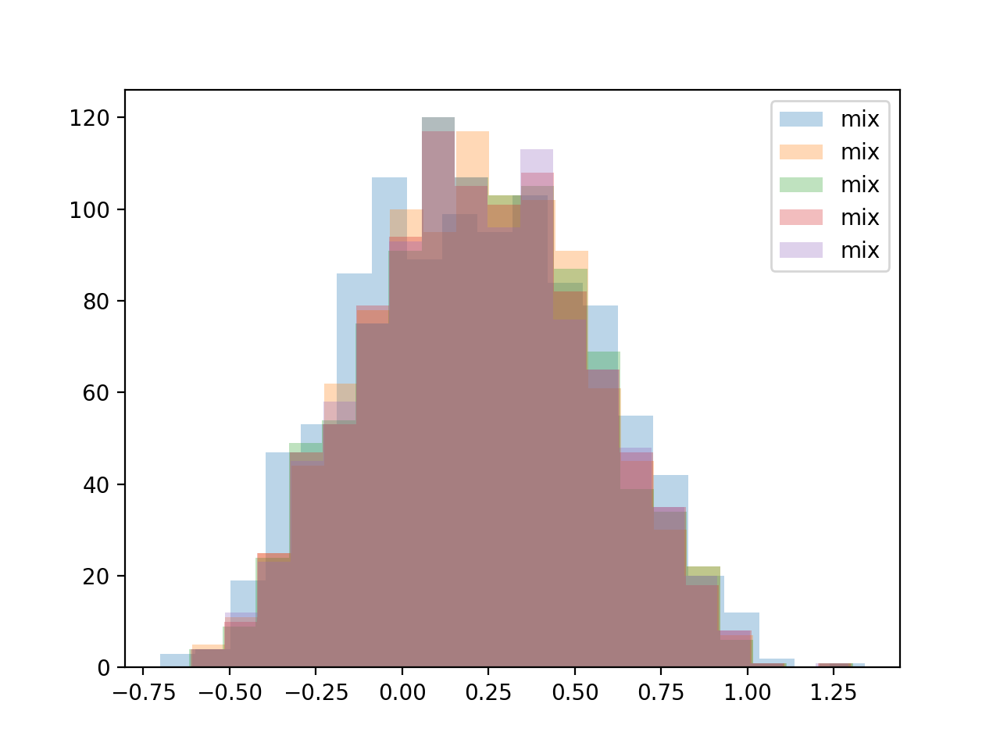

<IPython.core.display.Javascript object>


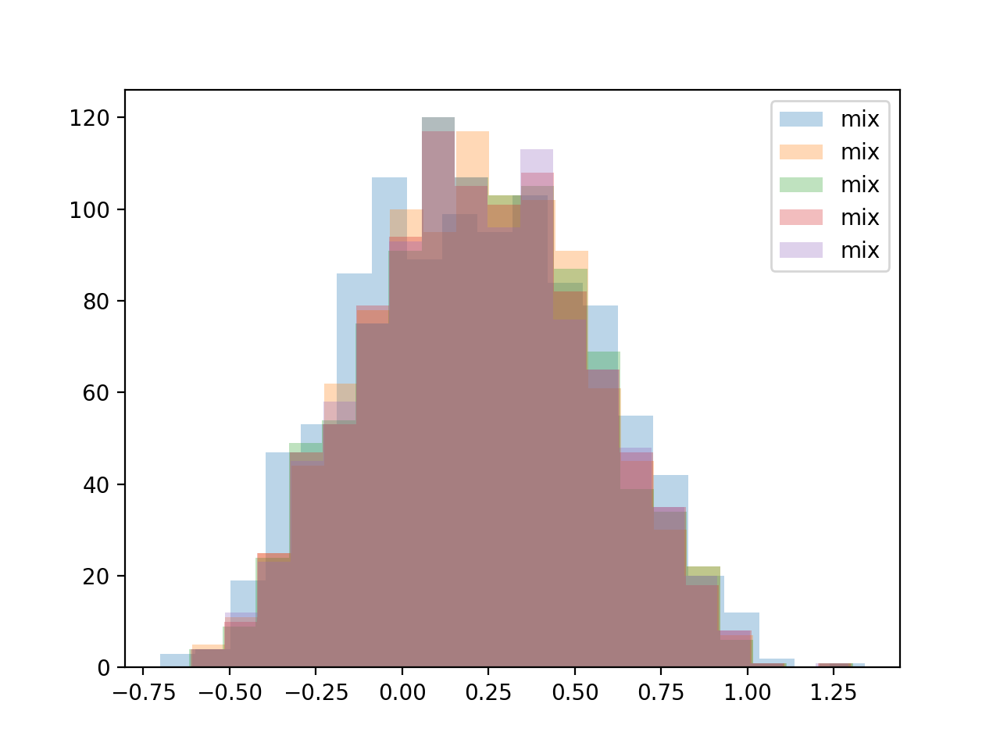

In [67]:
plt.close()
plt.figure()
pd.Series(mix_hist[1]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(mix_hist[10]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(mix_hist[25]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(mix_hist[50]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(mix_hist[100]).hist(bins=20, alpha=0.3, grid=False, label='mix')
plt.legend()

<IPython.core.display.Javascript object>


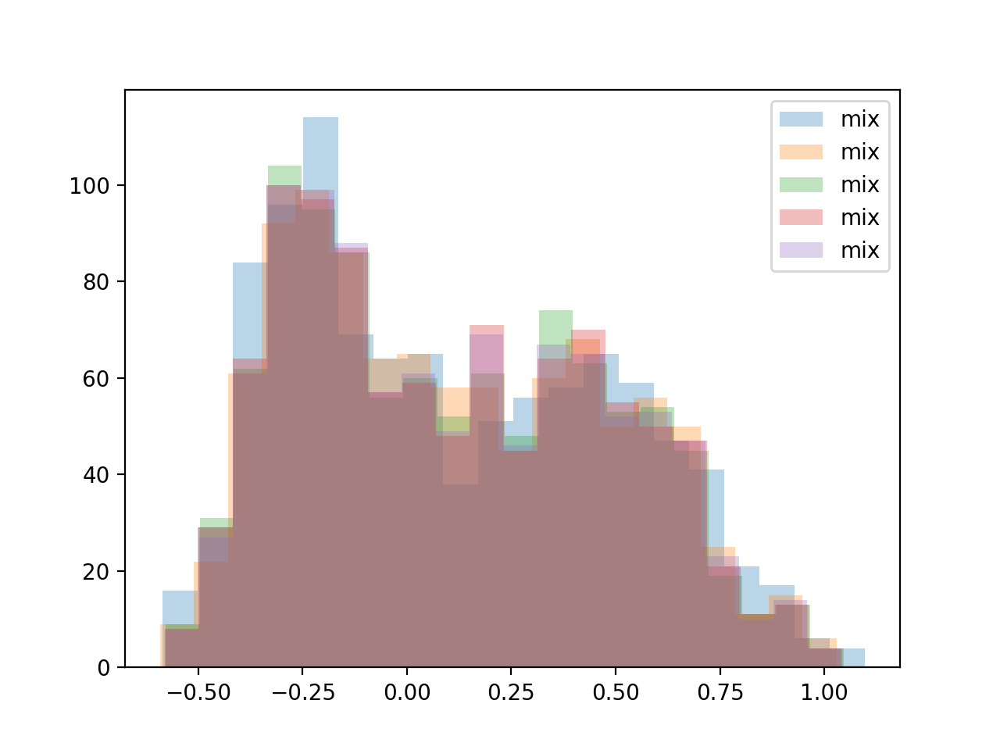

<IPython.core.display.Javascript object>


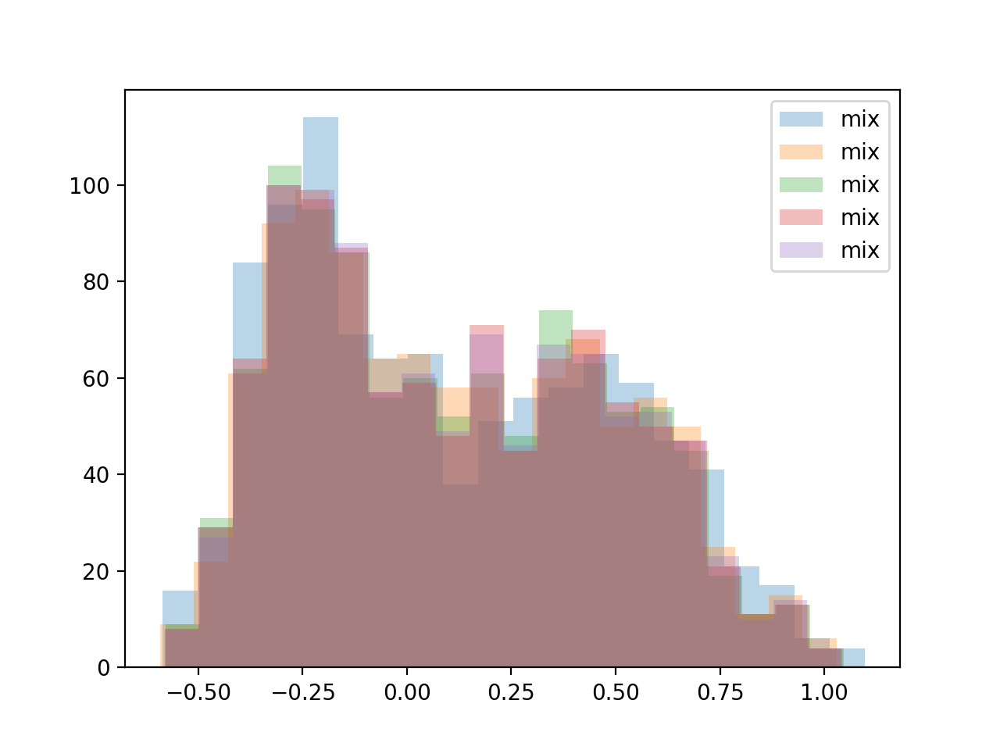

In [68]:
plt.close()
plt.figure()
pd.Series(test_hist[1]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(test_hist[10]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(test_hist[25]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(test_hist[50]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(test_hist[100]).hist(bins=20, alpha=0.3, grid=False, label='mix')
plt.legend()

<IPython.core.display.Javascript object>


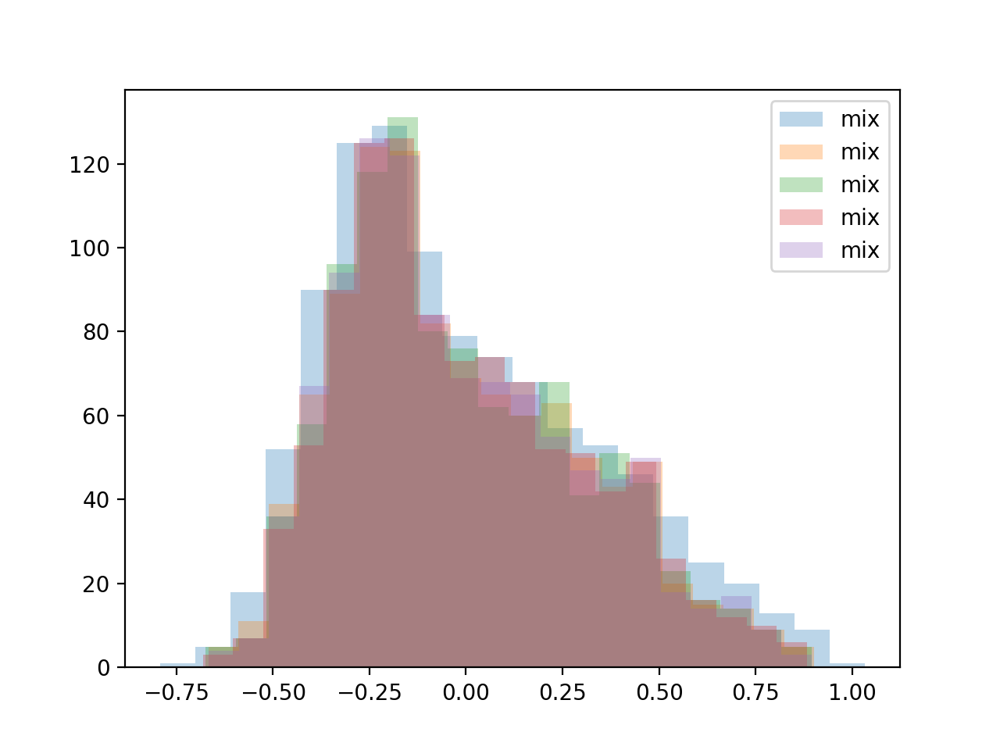

<IPython.core.display.Javascript object>


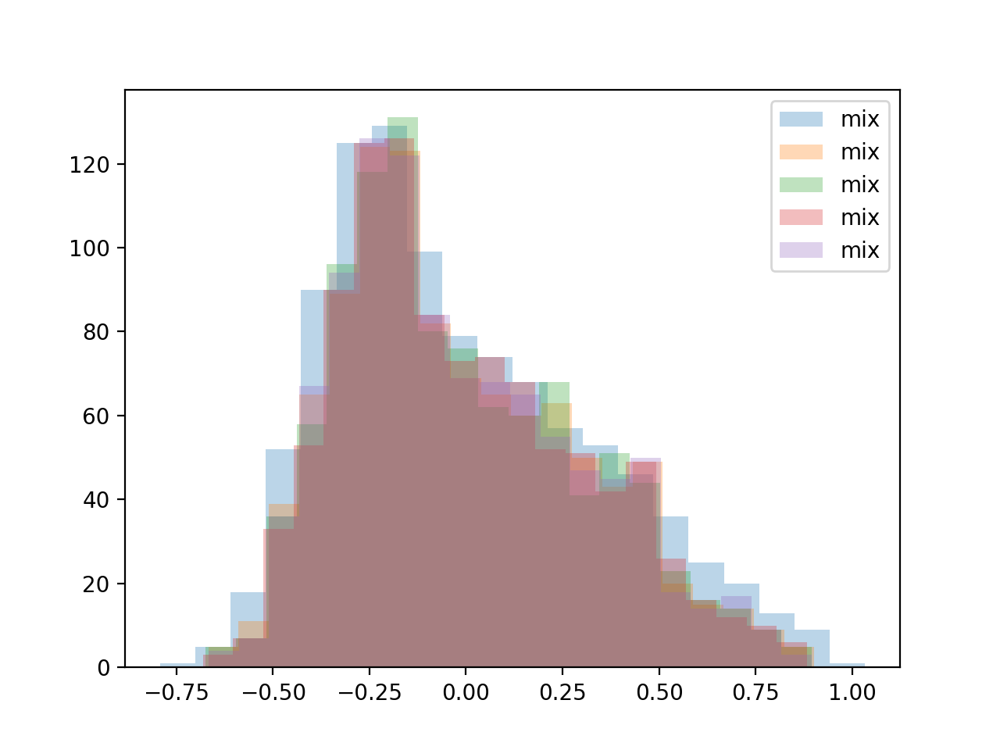

In [69]:
plt.close()
plt.figure()
pd.Series(out_hist[1]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(out_hist[10]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(out_hist[25]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(out_hist[50]).hist(bins=20, alpha=0.3, grid=False, label='mix')
pd.Series(out_hist[100]).hist(bins=20, alpha=0.3, grid=False, label='mix')
plt.legend()

In [40]:
results, (test_hist, out_hist, mix_hist) = get_aug_res(n_samples=1000)

/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in less
/home/ubuntu/anaconda3/envs/CKA/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in less


In [95]:
results

{'out': {1: 0.0, 10: 0.041, 25: 0.035, 50: 0.045, 100: 0.041},
 'mix': {1: 0.0, 10: 0.02, 25: 0.012, 50: 0.009, 100: 0.017}}

<IPython.core.display.Javascript object>


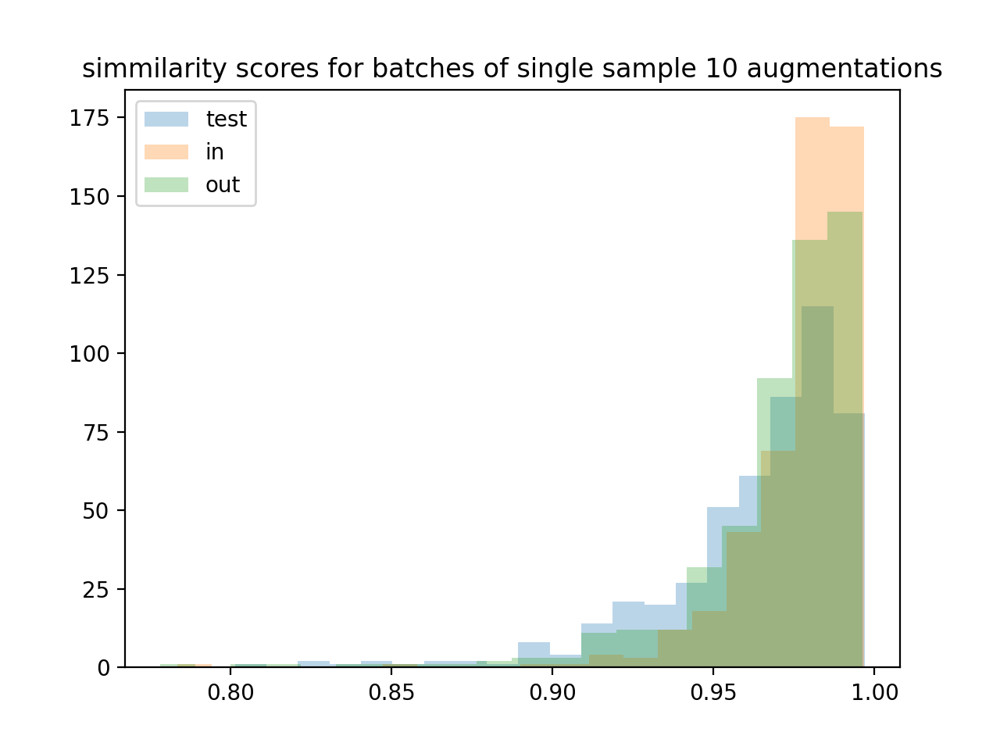

<IPython.core.display.Javascript object>


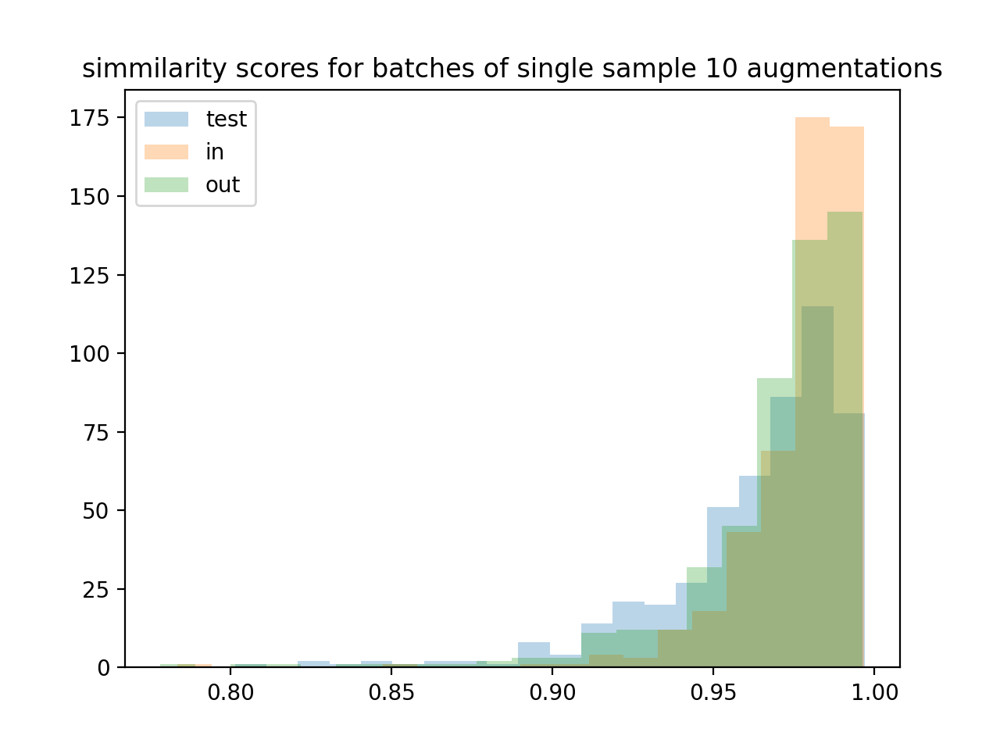

Text(0.5, 1.0, 'simmilarity scores for batches of single sample 10 augmentations')

In [35]:
plt.close()
plt.figure()
pd.Series(test_hist).hist(bins=20, alpha=0.3, grid=False, label='test')
pd.Series(mix_hist).hist(bins=20, alpha=0.3, grid=False, label='in')
pd.Series(out_hist).hist(bins=20, alpha=0.3, grid=False, label='out')
plt.legend()
plt.title('simmilarity scores for batches of single sample 10 augmentations')

In [39]:
def get_cka_loader_(thetas_a, dataset, batche_sizes=(1,10,25,50,100), n_samples=1000, seed=0):
    basic_model = model_dir +'/'+"FDL/2020-06-09_09:05_n=1_densenet121_lr=0.0001_m=__55_p=True_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1"
    diverse_model = 'work_space/save/CheXpert/FDL/2020-06-22_08:04_n=1_densenet121_lr=0.0001_m=__52_p=False_cka=False_pre_pre_layers=-1_pre_steps=50_clean-int-ext=1-1-0_limited=1_morph_alpha=10.0'
    basic_model_path = [os.path.join(basic_model, model_path) for model_path in  
                   os.listdir(basic_model) if 'model' in model_path]
    diverse_model_path = [os.path.join(diverse_model, model_path) for model_path in 
                     os.listdir(diverse_model) if 'model' in model_path]
    fdl_div_model = basic_model_path + diverse_model_path

    models = [get_model(model).to('cuda') for model in fdl_div_model]
    thetas_a = torch.Tensor(thetas_a)
    batche_sizes = list(batche_sizes)
    
    records_a = dict()
    const_a_sets = dict()
    for batch_a in batche_sizes:
        a_inds = multidimensional_shifting(len(thetas_a[0]), batch_a, n_samples, seed=seed)
        ind_a_const = next(iter(a_inds)) # const a batch
        const_a_sets[batch_a] = ind_a_const
        
    for batch_a in batche_sizes:
        ind_a_const = const_a_sets[batch_a]
        a_inds = multidimensional_shifting(len(thetas_a[0]), batch_a, n_samples)
        hist_a = [np.mean([linear_CKA(torch.cat([thetas_a[i][ind_a_const], thetas_a[j][ind_a_const]]), 
                                      torch.cat([thetas_a[i][ind_a], thetas_a[j][ind_a]]))
                           for i,j in combinations(range(len(thetas_a)), 2)]) 
                    for ind_a in a_inds]
        records_a[batch_a] = np.array(hist_a)
    
    records_b = dict()
    for batch_a in batche_sizes:
        records_b[batch_a] = []
    n_loader = load_n_loader(out_out.dataset, n=batche_sizes[-1], limit=n_samples, per_batch=1)
    for imgs, label, path in tqdm(n_loader, total=len(n_loader)):
        thetas_b = [model(imgs.cuda()).detach().cpu() for model in models]
        for batch_a in batche_sizes:
            ind_a_const = const_a_sets[batch_a]                
            score = np.mean([linear_CKA(torch.cat([thetas_a[i][ind_a_const], thetas_a[j][ind_a_const]]), 
                                  torch.cat([thetas_b[i][:batch_a], thetas_b[j][:batch_a]]))
                                             for i,j in combinations(range(len(thetas_a)), 2)])
            records_b[batch_a].append(score)
     
    for batch_a in batche_sizes:
        records_b[batch_a] = np.array(records_b[batch_a])
                      
    return records_a, records_b

In [50]:
def get_rejection_loader_(res, thresh=5):
    batche_sizes = (1,10,25,50,100)
    test_dist_out, test_out_dist = get_cka_loader_(res['test'][0], out_out.dataset, batche_sizes=batche_sizes)
    test_dist_in, test_in_out_dist = get_cka_loader_(res['test'][0], in_out.dataset, batche_sizes=batche_sizes)
    test_dist_test, test_test_dist = get_cka_loader_(res['test'][0], test.dataset, batche_sizes=batche_sizes)
    
    records = [dict(), dict(), dict()]
    batche_sizes = list(batche_sizes)
    for batch_a in batche_sizes:
        out_reject = (test_out_dist[batch_a] < 
                      np.percentile(test_dist_out[batch_a], thresh)).mean()
        in_out_reject = (test_in_out_dist[batch_a] < 
                         np.percentile(test_dist_in[batch_a], thresh)).mean()
        test_reject = (test_test_dist[batch_a] < 
                         np.percentile(test_dist_test[batch_a], thresh)).mean()

        records[0][batch_a] = out_reject
        records[1][batch_a] = in_out_reject 
        records[2][batch_a] = test_reject
            
    
    return (records, test_dist_out, test_out_dist, test_dist_in, test_in_out_dist, test_dist_test, test_test_dist)

In [51]:
records, test_dist_out, test_out_dist, test_dist_in, test_in_out_dist, test_dist_test, test_test_dist = get_rejection_loader_(fdl_results[model])

In [61]:
records

[{1: 0.0, 10: 0.002, 25: 0.0, 50: 0.0, 100: 0.0},
 {1: 0.0, 10: 0.001, 25: 0.001, 50: 0.0, 100: 0.0},
 {1: 0.0, 10: 0.002, 25: 0.001, 50: 0.0, 100: 0.0}]

<IPython.core.display.Javascript object>


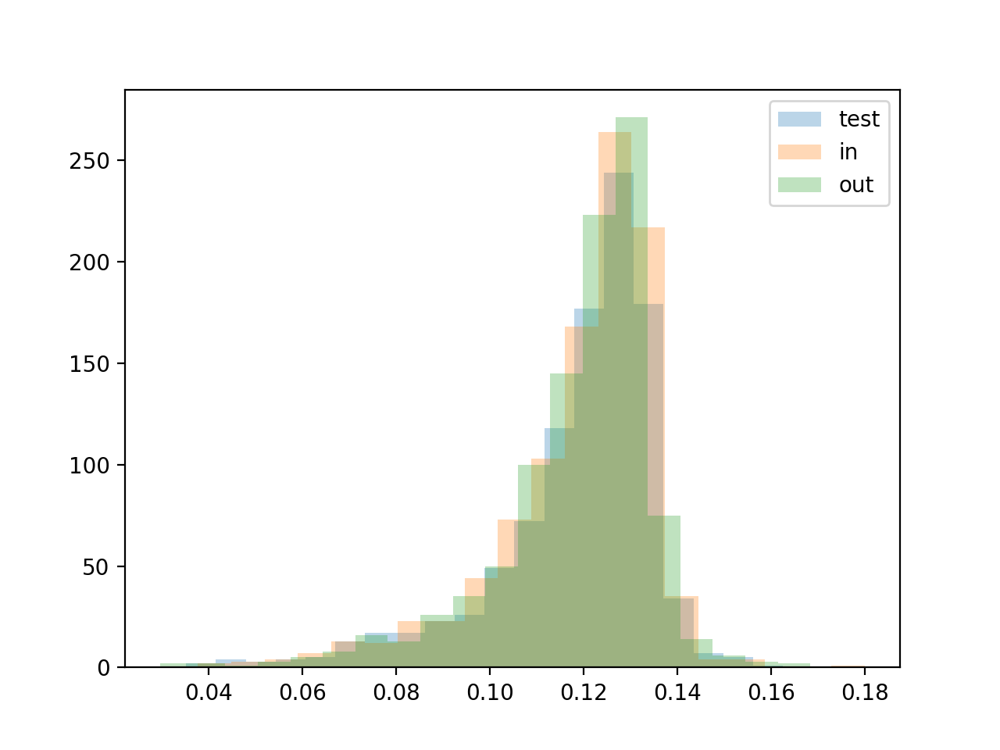

<IPython.core.display.Javascript object>


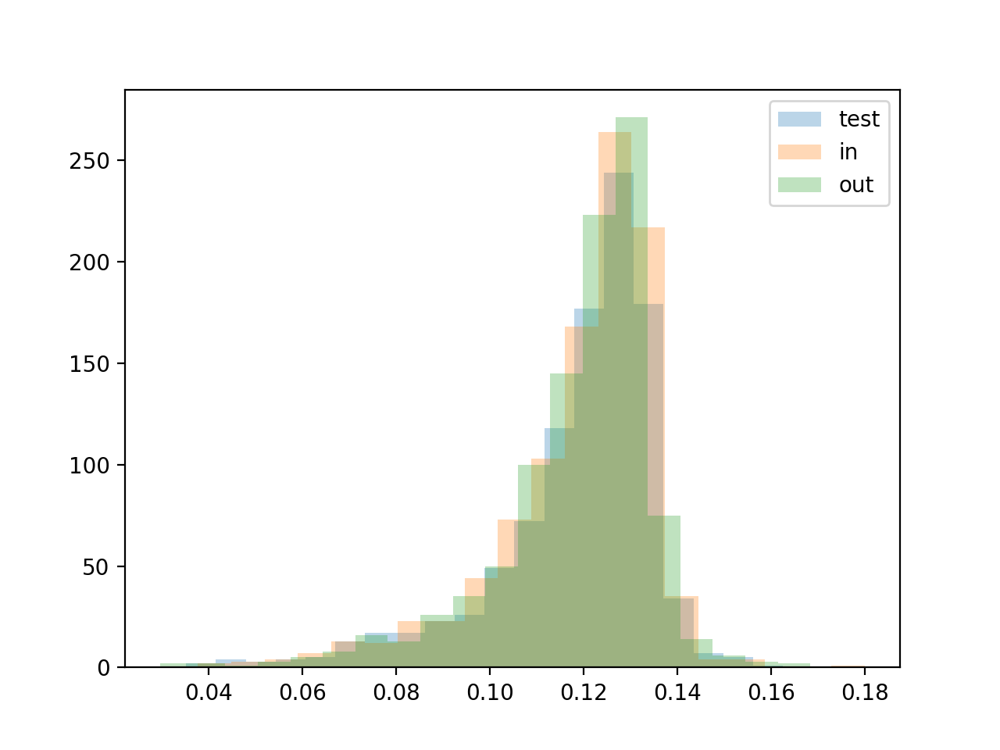

In [62]:
plt.close()
plt.figure()
pd.Series(test_test_dist[100]).hist(bins=20, alpha=0.3, grid=False, label='test')
pd.Series(test_in_out_dist[100]).hist(bins=20, alpha=0.3, grid=False, label='in')
pd.Series(test_out_dist[100]).hist(bins=20, alpha=0.3, grid=False, label='out')
plt.legend()